In [1]:
%cd /global/cfs/cdirs/m4334/jerry/climsim3_dev

/global/cfs/cdirs/m4334/jerry/climsim3_dev


/usr/local/lib/python3.10/dist-packages/IPython/core/magics/osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import gridspec
from sklearn.metrics import r2_score
import torch
import os, gc, sys, glob, string, argparse
import modulus
from tqdm import tqdm
import sys
import pickle
from climsim_utils.data_utils import *

In [3]:
grid_path = '/global/cfs/cdirs/m4334/jerry/climsim3_dev/grid_info/ClimSim_low-res_grid-info.nc'

input_mean_v2_rh_mc_file = 'input_mean_v2_rh_mc_pervar.nc'
input_max_v2_rh_mc_file = 'input_max_v2_rh_mc_pervar.nc'
input_min_v2_rh_mc_file = 'input_min_v2_rh_mc_pervar.nc'
output_scale_v2_rh_mc_file = 'output_scale_std_lowerthred_v2_rh_mc.nc'

input_mean_v6_file = 'input_mean_v6_pervar.nc'
input_max_v6_file = 'input_max_v6_pervar.nc'
input_min_v6_file = 'input_min_v6_pervar.nc'
output_scale_v6_file = 'output_scale_std_lowerthred_v6.nc'

lbd_qn_file = 'qn_exp_lambda_large.txt'

grid_info = xr.open_dataset(grid_path)

input_mean_v2_rh_mc = xr.open_dataset('/global/cfs/cdirs/m4334/jerry/climsim3_dev/preprocessing/normalizations/inputs/' + input_mean_v2_rh_mc_file)
input_max_v2_rh_mc = xr.open_dataset('/global/cfs/cdirs/m4334/jerry/climsim3_dev/preprocessing/normalizations/inputs/' + input_max_v2_rh_mc_file)
input_min_v2_rh_mc = xr.open_dataset('/global/cfs/cdirs/m4334/jerry/climsim3_dev/preprocessing/normalizations/inputs/' + input_min_v2_rh_mc_file)
output_scale_v2_rh_mc = xr.open_dataset('/global/cfs/cdirs/m4334/jerry/climsim3_dev/preprocessing/normalizations/outputs/' + output_scale_v2_rh_mc_file)

input_mean_v6 = xr.open_dataset('/global/cfs/cdirs/m4334/jerry/climsim3_dev/preprocessing/normalizations/inputs/' + input_mean_v6_file)
input_max_v6 = xr.open_dataset('/global/cfs/cdirs/m4334/jerry/climsim3_dev/preprocessing/normalizations/inputs/' + input_max_v6_file)
input_min_v6 = xr.open_dataset('/global/cfs/cdirs/m4334/jerry/climsim3_dev/preprocessing/normalizations/inputs/' + input_min_v6_file)
output_scale_v6 = xr.open_dataset('/global/cfs/cdirs/m4334/jerry/climsim3_dev/preprocessing/normalizations/outputs/' + output_scale_v6_file)

lbd_qn = np.loadtxt('/global/cfs/cdirs/m4334/jerry/climsim3_dev/preprocessing/normalizations/inputs/' + lbd_qn_file, delimiter = ',')

data_v2_rh_mc = data_utils(grid_info = grid_info, 
                           input_mean = input_mean_v2_rh_mc, 
                           input_max = input_max_v2_rh_mc, 
                           input_min = input_min_v2_rh_mc, 
                           output_scale = output_scale_v2_rh_mc,
                           qinput_log = False,
                           normalize = False)
data_v2_rh_mc.set_to_v2_rh_mc_vars()

data_v6 = data_utils(grid_info = grid_info,
                     input_mean = input_mean_v6,
                     input_max = input_max_v6,
                     input_min = input_min_v6,
                     output_scale = output_scale_v6,
                     qinput_log = False,
                     normalize = False)                     
data_v6.set_to_v6_vars()

actual_input_v2_rh_mc = np.load('/pscratch/sd/j/jerrylin/hugging/E3SM-MMF_ne4/preprocessing/v2_rh_mc/test_set/actual_input.npy')
actual_target_v2_rh_mc = np.load('/pscratch/sd/j/jerrylin/hugging/E3SM-MMF_ne4/preprocessing/v2_rh_mc/test_set/actual_target.npy')

actual_input_v6 = np.load('/pscratch/sd/j/jerrylin/hugging/E3SM-MMF_ne4/preprocessing/v6/test_set/actual_input.npy')
actual_target_v6 = np.load('/pscratch/sd/j/jerrylin/hugging/E3SM-MMF_ne4/preprocessing/v6/test_set/actual_target.npy')

assert np.array_equal(actual_target_v2_rh_mc, actual_target_v6)
actual_target = np.load('/pscratch/sd/j/jerrylin/hugging/E3SM-MMF_ne4/preprocessing/v2_rh_mc/test_set/original_test_vars/actual_target_v2.npy')
del actual_target_v2_rh_mc
del actual_target_v6

assert np.array_equal(actual_input_v2_rh_mc[:,:,data_v2_rh_mc.ps_index], 
                      actual_input_v6[:,:,data_v6.ps_index])

surface_pressure = actual_input_v2_rh_mc[:, :, data_v2_rh_mc.ps_index]
hyam_component = (data_v2_rh_mc.hyam * data_v2_rh_mc.p0)[None,None,:]
hybm_component = data_v2_rh_mc.hybm[None,None,:] * surface_pressure[:,:,None]
pressures = hyam_component + hybm_component
pressures_binned = data_v2_rh_mc.zonal_bin_weight_3d(pressures)
lat_bin_mids = data_v2_rh_mc.lat_bin_mids

grid_area = grid_info['area'].values[None,:,None]
pressure_interface = (grid_info['hyai'].values * grid_info['P0'].values)[None,None,:] + (surface_pressure[:,:,None] * grid_info['hybi'].values[None,None,:])
dp = pressure_interface[:,:,1:61] - pressure_interface[:,:,0:60]
total_weight = grid_area * dp

In [4]:
standard_save_path = '/pscratch/sd/j/jerrylin/hugging/E3SM-MMF_ne4/preprocessing/v2_rh_mc/test_set/test_preds/standard/'
conf_loss_save_path = '/pscratch/sd/j/jerrylin/hugging/E3SM-MMF_ne4/preprocessing/v2_rh_mc/test_set/test_preds/conf_loss/'
diff_loss_save_path = '/pscratch/sd/j/jerrylin/hugging/E3SM-MMF_ne4/preprocessing/v2_rh_mc/test_set/test_preds/diff_loss/'
multirep_save_path = '/pscratch/sd/j/jerrylin/hugging/E3SM-MMF_ne4/preprocessing/v2_rh_mc/test_set/test_preds/multirep/'
v6_save_path = '/pscratch/sd/j/jerrylin/hugging/E3SM-MMF_ne4/preprocessing/v6/test_set/test_preds/'
offline_save_path = '/global/cfs/cdirs/m4334/jerry/climsim3_offline_results'

def load_seed_data(save_path, npz_file, seed_key):
    with np.load(os.path.join(save_path, npz_file)) as data:
        return data[seed_key]

seeds = ['seed_7', 'seed_43', 'seed_1024']

print('loading standard preds')
standard_preds = {
    'unet': lambda seed_key: load_seed_data(standard_save_path, 'standard_unet_preds.npz', seed_key),
    'squeezeformer': lambda seed_key: load_seed_data(standard_save_path, 'standard_squeezeformer_preds.npz', seed_key),
    'pure_resLSTM': lambda seed_key: load_seed_data(standard_save_path, 'standard_pure_resLSTM_preds.npz', seed_key),
    'pao_model': lambda seed_key: load_seed_data(standard_save_path, 'standard_pao_model_preds.npz', seed_key),
    'convnext': lambda seed_key: load_seed_data(standard_save_path, 'standard_convnext_preds.npz', seed_key),
    'encdec_lstm': lambda seed_key: load_seed_data(standard_save_path, 'standard_encdec_lstm_preds.npz', seed_key)
}

print('loading conf loss preds')
conf_loss_preds = {
    'unet': lambda seed_key: load_seed_data(conf_loss_save_path, 'conf_loss_unet_preds.npz', seed_key),
    'squeezeformer': lambda seed_key: load_seed_data(conf_loss_save_path, 'conf_loss_squeezeformer_preds.npz', seed_key),
    'pure_resLSTM': lambda seed_key: load_seed_data(conf_loss_save_path, 'conf_loss_pure_resLSTM_preds.npz', seed_key),
    'pao_model': lambda seed_key: load_seed_data(conf_loss_save_path, 'conf_loss_pao_model_preds.npz', seed_key),
    'convnext': lambda seed_key: load_seed_data(conf_loss_save_path, 'conf_loss_convnext_preds.npz', seed_key),
    'encdec_lstm': lambda seed_key: load_seed_data(conf_loss_save_path, 'conf_loss_encdec_lstm_preds.npz', seed_key)
}

print('loading conf loss conf')
conf_loss_conf = {
    'unet': lambda seed_key: load_seed_data(conf_loss_save_path, 'conf_loss_unet_conf.npz', seed_key),
    'squeezeformer': lambda seed_key: load_seed_data(conf_loss_save_path, 'conf_loss_squeezeformer_conf.npz', seed_key),
    'pure_resLSTM': lambda seed_key: load_seed_data(conf_loss_save_path, 'conf_loss_pure_resLSTM_conf.npz', seed_key),
    'pao_model': lambda seed_key: load_seed_data(conf_loss_save_path, 'conf_loss_pao_model_conf.npz', seed_key),
    'convnext': lambda seed_key: load_seed_data(conf_loss_save_path, 'conf_loss_convnext_conf.npz', seed_key),
    'encdec_lstm': lambda seed_key: load_seed_data(conf_loss_save_path, 'conf_loss_encdec_lstm_conf.npz', seed_key)
}

print('loading diff loss preds')
diff_loss_preds = {
    'unet': lambda seed_key: load_seed_data(diff_loss_save_path, 'diff_loss_unet_preds.npz', seed_key),
    'squeezeformer': lambda seed_key: load_seed_data(diff_loss_save_path, 'diff_loss_squeezeformer_preds.npz', seed_key),
    'pure_resLSTM': lambda seed_key: load_seed_data(diff_loss_save_path, 'diff_loss_pure_resLSTM_preds.npz', seed_key),
    'pao_model': lambda seed_key: load_seed_data(diff_loss_save_path, 'diff_loss_pao_model_preds.npz', seed_key),
    'convnext': lambda seed_key: load_seed_data(diff_loss_save_path, 'diff_loss_convnext_preds.npz', seed_key),
    'encdec_lstm': lambda seed_key: load_seed_data(diff_loss_save_path, 'diff_loss_encdec_lstm_preds.npz', seed_key)
}

print('loading multirep preds')
multirep_preds = {
    'unet': lambda seed_key: load_seed_data(multirep_save_path, 'multirep_unet_preds.npz', seed_key),
    'squeezeformer': lambda seed_key: load_seed_data(multirep_save_path, 'multirep_squeezeformer_preds.npz', seed_key),
    'pure_resLSTM': lambda seed_key: load_seed_data(multirep_save_path, 'multirep_pure_resLSTM_preds.npz', seed_key),
    'pao_model': lambda seed_key: load_seed_data(multirep_save_path, 'multirep_pao_model_preds.npz', seed_key),
    'convnext': lambda seed_key: load_seed_data(multirep_save_path, 'multirep_convnext_preds.npz', seed_key),
    'encdec_lstm': lambda seed_key: load_seed_data(multirep_save_path, 'multirep_encdec_lstm_preds.npz', seed_key)
}

print('loading v6 preds')
v6_preds = {
    'unet': lambda seed_key: load_seed_data(v6_save_path, 'v6_unet_preds.npz', seed_key),
    'squeezeformer': lambda seed_key: load_seed_data(v6_save_path, 'v6_squeezeformer_preds.npz', seed_key),
    'pure_resLSTM': lambda seed_key: load_seed_data(v6_save_path, 'v6_pure_resLSTM_preds.npz', seed_key),
    'pao_model': lambda seed_key: load_seed_data(v6_save_path, 'v6_pao_model_preds.npz', seed_key),
    'convnext': lambda seed_key: load_seed_data(v6_save_path, 'v6_convnext_preds.npz', seed_key),
    'encdec_lstm': lambda seed_key: load_seed_data(v6_save_path, 'v6_encdec_lstm_preds.npz', seed_key)
}

loading standard preds
loading conf loss preds
loading conf loss conf
loading diff loss preds
loading multirep preds
loading v6 preds


In [5]:
def show_r2(target, preds):
    assert target.shape == preds.shape, f'target shape {target.shape} does not match preds shape {preds.shape}'
    new_shape = (np.prod(target.shape[:-1]), target.shape[-1])
    target_flattened = target.reshape(new_shape)
    preds_flattened = preds.reshape(new_shape)
    r2_scores = np.array([r2_score(target_flattened[:, i], preds_flattened[:, i]) for i in range(368)])
    r2_scores_capped = r2_scores.copy()
    r2_scores_capped[r2_scores_capped < 0] = 0
    return r2_scores, r2_scores_capped

def calc_rmse(actual_target, nn_pred):
    rmse_dict = {
        "rmse_dTdt": np.sqrt(np.sum(total_weight * (nn_pred[:,:,:60] - actual_target[:,:,:60])**2)/np.sum(total_weight)),
        "rmse_dQvdt": np.sqrt(np.sum(total_weight * (nn_pred[:,:,60:120] - actual_target[:,:,60:120])**2)/np.sum(total_weight)),
        "rmse_dQldt": np.sqrt(np.sum(total_weight * (nn_pred[:,:,120:180] - actual_target[:,:,120:180])**2)/np.sum(total_weight)),
        "rmse_dQidt": np.sqrt(np.sum(total_weight * (nn_pred[:,:,180:240] - actual_target[:,:,180:240])**2)/np.sum(total_weight)),
        "rmse_dUdt": np.sqrt(np.sum(total_weight * (nn_pred[:,:,240:300] - actual_target[:,:,240:300])**2)/np.sum(total_weight)),
        "rmse_dVdt": np.sqrt(np.sum(total_weight * (nn_pred[:,:,300:360] - actual_target[:,:,300:360])**2)/np.sum(total_weight)),
        "rmse_NETSW": np.sqrt(np.sum(grid_info['area'].values[None,:] * (nn_pred[:,:,360] - actual_target[:,:,360])**2)/np.sum(actual_target.shape[0] * np.sum(grid_info['area'].values))),
        "rmse_FLWDS": np.sqrt(np.sum(grid_info['area'].values[None,:] * (nn_pred[:,:,361] - actual_target[:,:,361])**2)/np.sum(actual_target.shape[0] * np.sum(grid_info['area'].values))),
        "rmse_PRECSC": np.sqrt(np.sum(grid_info['area'].values[None,:] * (nn_pred[:,:,362] - actual_target[:,:,362])**2)/np.sum(actual_target.shape[0] * np.sum(grid_info['area'].values))),
        "rmse_PRECC": np.sqrt(np.sum(grid_info['area'].values[None,:] * (nn_pred[:,:,363] - actual_target[:,:,363])**2)/np.sum(actual_target.shape[0] * np.sum(grid_info['area'].values))),
        "rmse_SOLS": np.sqrt(np.sum(grid_info['area'].values[None,:] * (nn_pred[:,:,364] - actual_target[:,:,364])**2)/np.sum(actual_target.shape[0] * np.sum(grid_info['area'].values))),
        "rmse_SOLL": np.sqrt(np.sum(grid_info['area'].values[None,:] * (nn_pred[:,:,365] - actual_target[:,:,365])**2)/np.sum(actual_target.shape[0] * np.sum(grid_info['area'].values))),
        "rmse_SOLSD": np.sqrt(np.sum(grid_info['area'].values[None,:] * (nn_pred[:,:,366] - actual_target[:,:,366])**2)/np.sum(actual_target.shape[0] * np.sum(grid_info['area'].values))),
        "rmse_SOLLD": np.sqrt(np.sum(grid_info['area'].values[None,:] * (nn_pred[:,:,367] - actual_target[:,:,367])**2)/np.sum(actual_target.shape[0] * np.sum(grid_info['area'].values)))
    }
    return rmse_dict

In [6]:
# print('Calculating standard r2')
# standard_unet_r2 = {seed: show_r2(actual_target, standard_preds['unet'](seed)) for seed in seeds}
# standard_squeezeformer_r2 = {seed: show_r2(actual_target, standard_preds['squeezeformer'](seed)) for seed in seeds}
# standard_pure_resLSTM_r2 = {seed: show_r2(actual_target, standard_preds['pure_resLSTM'](seed)) for seed in seeds}
# standard_pao_model_r2 = {seed: show_r2(actual_target, standard_preds['pao_model'](seed)) for seed in seeds}
# standard_convnext_r2 = {seed: show_r2(actual_target, standard_preds['convnext'](seed)) for seed in seeds}
# standard_encdec_lstm_r2 = {seed: show_r2(actual_target, standard_preds['encdec_lstm'](seed)) for seed in seeds}

# print('Calculating conf loss r2')
# conf_loss_unet_r2 = {seed: show_r2(actual_target, conf_loss_preds['unet'](seed)) for seed in seeds}
# conf_loss_squeezeformer_r2 = {seed: show_r2(actual_target, conf_loss_preds['squeezeformer'](seed)) for seed in seeds}
# conf_loss_pure_resLSTM_r2 = {seed: show_r2(actual_target, conf_loss_preds['pure_resLSTM'](seed)) for seed in seeds}
# conf_loss_pao_model_r2 = {seed: show_r2(actual_target, conf_loss_preds['pao_model'](seed)) for seed in seeds}
# conf_loss_convnext_r2 = {seed: show_r2(actual_target, conf_loss_preds['convnext'](seed)) for seed in seeds}
# conf_loss_encdec_lstm_r2 = {seed: show_r2(actual_target, conf_loss_preds['encdec_lstm'](seed)) for seed in seeds}

# print('Calculating diff loss r2')
# diff_loss_unet_r2 = {seed: show_r2(actual_target, diff_loss_preds['unet'](seed)) for seed in seeds}
# diff_loss_squeezeformer_r2 = {seed: show_r2(actual_target, diff_loss_preds['squeezeformer'](seed)) for seed in seeds}
# diff_loss_pure_resLSTM_r2 = {seed: show_r2(actual_target, diff_loss_preds['pure_resLSTM'](seed)) for seed in seeds}
# diff_loss_pao_model_r2 = {seed: show_r2(actual_target, diff_loss_preds['pao_model'](seed)) for seed in seeds}
# diff_loss_convnext_r2 = {seed: show_r2(actual_target, diff_loss_preds['convnext'](seed)) for seed in seeds}
# diff_loss_encdec_lstm_r2 = {seed: show_r2(actual_target, diff_loss_preds['encdec_lstm'](seed)) for seed in seeds}

# print('Calculating multirep r2')
# multirep_unet_r2 = {seed: show_r2(actual_target, multirep_preds['unet'](seed)) for seed in seeds}
# multirep_squeezeformer_r2 = {seed: show_r2(actual_target, multirep_preds['squeezeformer'](seed)) for seed in seeds}
# multirep_pure_resLSTM_r2 = {seed: show_r2(actual_target, multirep_preds['pure_resLSTM'](seed)) for seed in seeds}
# multirep_pao_model_r2 = {seed: show_r2(actual_target, multirep_preds['pao_model'](seed)) for seed in seeds}
# multirep_convnext_r2 = {seed: show_r2(actual_target, multirep_preds['convnext'](seed)) for seed in seeds}
# multirep_encdec_lstm_r2 = {seed: show_r2(actual_target, multirep_preds['encdec_lstm'](seed)) for seed in seeds}

# print('Calculating v6 r2')
# v6_unet_r2 = {seed: show_r2(actual_target, v6_preds['unet'](seed)) for seed in seeds}
# v6_squeezeformer_r2 = {seed: show_r2(actual_target, v6_preds['squeezeformer'](seed)) for seed in seeds}
# v6_pure_resLSTM_r2 = {seed: show_r2(actual_target, v6_preds['pure_resLSTM'](seed)) for seed in seeds}
# v6_pao_model_r2 = {seed: show_r2(actual_target, v6_preds['pao_model'](seed)) for seed in seeds}
# v6_convnext_r2 = {seed: show_r2(actual_target, v6_preds['convnext'](seed)) for seed in seeds}
# v6_encdec_lstm_r2 = {seed: show_r2(actual_target, v6_preds['encdec_lstm'](seed)) for seed in seeds}

# with open(os.path.join(offline_save_path,"standard_unet_r2.pkl"), "wb") as f:
#     pickle.dump(standard_unet_r2, f)
# with open(os.path.join(offline_save_path,"standard_squeezeformer_r2.pkl"), "wb") as f:
#     pickle.dump(standard_squeezeformer_r2, f)
# with open(os.path.join(offline_save_path,"standard_pure_resLSTM_r2.pkl"), "wb") as f:
#     pickle.dump(standard_pure_resLSTM_r2, f)
# with open(os.path.join(offline_save_path,"standard_pao_model_r2.pkl"), "wb") as f:
#     pickle.dump(standard_pao_model_r2, f)
# with open(os.path.join(offline_save_path,"standard_convnext_r2.pkl"), "wb") as f:
#     pickle.dump(standard_convnext_r2, f)
# with open(os.path.join(offline_save_path,"standard_encdec_lstm_r2.pkl"), "wb") as f:
#     pickle.dump(standard_encdec_lstm_r2, f)

# with open(os.path.join(offline_save_path,"conf_loss_unet_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_unet_r2, f)
# with open(os.path.join(offline_save_path,"conf_loss_squeezeformer_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_squeezeformer_r2, f)
# with open(os.path.join(offline_save_path,"conf_loss_pure_resLSTM_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_pure_resLSTM_r2, f)
# with open(os.path.join(offline_save_path,"conf_loss_pao_model_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_pao_model_r2, f)
# with open(os.path.join(offline_save_path,"conf_loss_convnext_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_convnext_r2, f)
# with open(os.path.join(offline_save_path,"conf_loss_encdec_lstm_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_encdec_lstm_r2, f)

# with open(os.path.join(offline_save_path,"diff_loss_unet_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_unet_r2, f)
# with open(os.path.join(offline_save_path,"diff_loss_squeezeformer_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_squeezeformer_r2, f)
# with open(os.path.join(offline_save_path,"diff_loss_pure_resLSTM_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_pure_resLSTM_r2, f)
# with open(os.path.join(offline_save_path,"diff_loss_pao_model_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_pao_model_r2, f)
# with open(os.path.join(offline_save_path,"diff_loss_convnext_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_convnext_r2, f)
# with open(os.path.join(offline_save_path,"diff_loss_encdec_lstm_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_encdec_lstm_r2, f)

# with open(os.path.join(offline_save_path,"multirep_unet_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_unet_r2, f)
# with open(os.path.join(offline_save_path,"multirep_squeezeformer_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_squeezeformer_r2, f)
# with open(os.path.join(offline_save_path,"multirep_pure_resLSTM_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_pure_resLSTM_r2, f)
# with open(os.path.join(offline_save_path,"multirep_pao_model_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_pao_model_r2, f)
# with open(os.path.join(offline_save_path,"multirep_convnext_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_convnext_r2, f)
# with open(os.path.join(offline_save_path,"multirep_encdec_lstm_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_encdec_lstm_r2, f)

# with open(os.path.join(offline_save_path,"v6_unet_r2.pkl"), "wb") as f:
#     pickle.dump(v6_unet_r2, f)
# with open(os.path.join(offline_save_path,"v6_squeezeformer_r2.pkl"), "wb") as f:
#     pickle.dump(v6_squeezeformer_r2, f)
# with open(os.path.join(offline_save_path,"v6_pure_resLSTM_r2.pkl"), "wb") as f:
#     pickle.dump(v6_pure_resLSTM_r2, f)
# with open(os.path.join(offline_save_path,"v6_pao_model_r2.pkl"), "wb") as f:
#     pickle.dump(v6_pao_model_r2, f)
# with open(os.path.join(offline_save_path,"v6_convnext_r2.pkl"), "wb") as f:
#     pickle.dump(v6_convnext_r2, f)
# with open(os.path.join(offline_save_path,"v6_encdec_lstm_r2.pkl"), "wb") as f:
#     pickle.dump(v6_encdec_lstm_r2, f)

# print('Calculating standard rmse')
# standard_unet_rmse = {seed: calc_rmse(actual_target, standard_preds['unet'](seed)) for seed in seeds}
# standard_squeezeformer_rmse = {seed: calc_rmse(actual_target, standard_preds['squeezeformer'](seed)) for seed in seeds}
# standard_pure_resLSTM_rmse = {seed: calc_rmse(actual_target, standard_preds['pure_resLSTM'](seed)) for seed in seeds}
# standard_pao_model_rmse = {seed: calc_rmse(actual_target, standard_preds['pao_model'](seed)) for seed in seeds}
# standard_convnext_rmse = {seed: calc_rmse(actual_target, standard_preds['convnext'](seed)) for seed in seeds}
# standard_encdec_lstm_rmse = {seed: calc_rmse(actual_target, standard_preds['encdec_lstm'](seed)) for seed in seeds}

# print('Calculating conf loss rmse')
# conf_loss_unet_rmse = {seed: calc_rmse(actual_target, conf_loss_preds['unet'](seed)) for seed in seeds}
# conf_loss_squeezeformer_rmse = {seed: calc_rmse(actual_target, conf_loss_preds['squeezeformer'](seed)) for seed in seeds}
# conf_loss_pure_resLSTM_rmse = {seed: calc_rmse(actual_target, conf_loss_preds['pure_resLSTM'](seed)) for seed in seeds}
# conf_loss_pao_model_rmse = {seed: calc_rmse(actual_target, conf_loss_preds['pao_model'](seed)) for seed in seeds}
# conf_loss_convnext_rmse = {seed: calc_rmse(actual_target, conf_loss_preds['convnext'](seed)) for seed in seeds}
# conf_loss_encdec_lstm_rmse = {seed: calc_rmse(actual_target, conf_loss_preds['encdec_lstm'](seed)) for seed in seeds}

# print('Calculating diff loss rmse')
# diff_loss_unet_rmse = {seed: calc_rmse(actual_target, diff_loss_preds['unet'](seed)) for seed in seeds}
# diff_loss_squeezeformer_rmse = {seed: calc_rmse(actual_target, diff_loss_preds['squeezeformer'](seed)) for seed in seeds}
# diff_loss_pure_resLSTM_rmse = {seed: calc_rmse(actual_target, diff_loss_preds['pure_resLSTM'](seed)) for seed in seeds}
# diff_loss_pao_model_rmse = {seed: calc_rmse(actual_target, diff_loss_preds['pao_model'](seed)) for seed in seeds}
# diff_loss_convnext_rmse = {seed: calc_rmse(actual_target, diff_loss_preds['convnext'](seed)) for seed in seeds}
# diff_loss_encdec_lstm_rmse = {seed: calc_rmse(actual_target, diff_loss_preds['encdec_lstm'](seed)) for seed in seeds}

# print('Calculating multirep rmse')
# multirep_unet_rmse = {seed: calc_rmse(actual_target, multirep_preds['unet'](seed)) for seed in seeds}
# multirep_squeezeformer_rmse = {seed: calc_rmse(actual_target, multirep_preds['squeezeformer'](seed)) for seed in seeds}
# multirep_pure_resLSTM_rmse = {seed: calc_rmse(actual_target, multirep_preds['pure_resLSTM'](seed)) for seed in seeds}
# multirep_pao_model_rmse = {seed: calc_rmse(actual_target, multirep_preds['pao_model'](seed)) for seed in seeds}
# multirep_convnext_rmse = {seed: calc_rmse(actual_target, multirep_preds['convnext'](seed)) for seed in seeds}
# multirep_encdec_lstm_rmse = {seed: calc_rmse(actual_target, multirep_preds['encdec_lstm'](seed)) for seed in seeds}

# print('Calculating v6 rmse')
# v6_unet_rmse = {seed: calc_rmse(actual_target, v6_preds['unet'](seed)) for seed in seeds}
# v6_squeezeformer_rmse = {seed: calc_rmse(actual_target, v6_preds['squeezeformer'](seed)) for seed in seeds}
# v6_pure_resLSTM_rmse = {seed: calc_rmse(actual_target, v6_preds['pure_resLSTM'](seed)) for seed in seeds}
# v6_pao_model_rmse = {seed: calc_rmse(actual_target, v6_preds['pao_model'](seed)) for seed in seeds}
# v6_convnext_rmse = {seed: calc_rmse(actual_target, v6_preds['convnext'](seed)) for seed in seeds}
# v6_encdec_lstm_rmse = {seed: calc_rmse(actual_target, v6_preds['encdec_lstm'](seed)) for seed in seeds}

# with open(os.path.join(offline_save_path,"standard_unet_rmse.pkl"), "wb") as f:
#     pickle.dump(standard_unet_rmse, f)
# with open(os.path.join(offline_save_path,"standard_squeezeformer_rmse.pkl"), "wb") as f:
#     pickle.dump(standard_squeezeformer_rmse, f)
# with open(os.path.join(offline_save_path,"standard_pure_resLSTM_rmse.pkl"), "wb") as f:
#     pickle.dump(standard_pure_resLSTM_rmse, f)
# with open(os.path.join(offline_save_path,"standard_pao_model_rmse.pkl"), "wb") as f:
#     pickle.dump(standard_pao_model_rmse, f)
# with open(os.path.join(offline_save_path,"standard_convnext_rmse.pkl"), "wb") as f:
#     pickle.dump(standard_convnext_rmse, f)
# with open(os.path.join(offline_save_path,"standard_encdec_lstm_rmse.pkl"), "wb") as f:
#     pickle.dump(standard_encdec_lstm_rmse, f)

# with open(os.path.join(offline_save_path,"conf_loss_unet_rmse.pkl"), "wb") as f:
#     pickle.dump(conf_loss_unet_rmse, f)
# with open(os.path.join(offline_save_path,"conf_loss_squeezeformer_rmse.pkl"), "wb") as f:
#     pickle.dump(conf_loss_squeezeformer_rmse, f)
# with open(os.path.join(offline_save_path,"conf_loss_pure_resLSTM_rmse.pkl"), "wb") as f:
#     pickle.dump(conf_loss_pure_resLSTM_rmse, f)
# with open(os.path.join(offline_save_path,"conf_loss_pao_model_rmse.pkl"), "wb") as f:
#     pickle.dump(conf_loss_pao_model_rmse, f)
# with open(os.path.join(offline_save_path,"conf_loss_convnext_rmse.pkl"), "wb") as f:
#     pickle.dump(conf_loss_convnext_rmse, f)
# with open(os.path.join(offline_save_path,"conf_loss_encdec_lstm_rmse.pkl"), "wb") as f:
#     pickle.dump(conf_loss_encdec_lstm_rmse, f)

# with open(os.path.join(offline_save_path,"diff_loss_unet_rmse.pkl"), "wb") as f:
#     pickle.dump(diff_loss_unet_rmse, f)
# with open(os.path.join(offline_save_path,"diff_loss_squeezeformer_rmse.pkl"), "wb") as f:
#     pickle.dump(diff_loss_squeezeformer_rmse, f)
# with open(os.path.join(offline_save_path,"diff_loss_pure_resLSTM_rmse.pkl"), "wb") as f:
#     pickle.dump(diff_loss_pure_resLSTM_rmse, f)
# with open(os.path.join(offline_save_path,"diff_loss_pao_model_rmse.pkl"), "wb") as f:
#     pickle.dump(diff_loss_pao_model_rmse, f)
# with open(os.path.join(offline_save_path,"diff_loss_convnext_rmse.pkl"), "wb") as f:
#     pickle.dump(diff_loss_convnext_rmse, f)
# with open(os.path.join(offline_save_path,"diff_loss_encdec_lstm_rmse.pkl"), "wb") as f:
#     pickle.dump(diff_loss_encdec_lstm_rmse, f)

# with open(os.path.join(offline_save_path,"multirep_unet_rmse.pkl"), "wb") as f:
#     pickle.dump(multirep_unet_rmse, f)
# with open(os.path.join(offline_save_path,"multirep_squeezeformer_rmse.pkl"), "wb") as f:
#     pickle.dump(multirep_squeezeformer_rmse, f)
# with open(os.path.join(offline_save_path,"multirep_pure_resLSTM_rmse.pkl"), "wb") as f:
#     pickle.dump(multirep_pure_resLSTM_rmse, f)
# with open(os.path.join(offline_save_path,"multirep_pao_model_rmse.pkl"), "wb") as f:
#     pickle.dump(multirep_pao_model_rmse, f)
# with open(os.path.join(offline_save_path,"multirep_convnext_rmse.pkl"), "wb") as f:
#     pickle.dump(multirep_convnext_rmse, f)
# with open(os.path.join(offline_save_path,"multirep_encdec_lstm_rmse.pkl"), "wb") as f:
#     pickle.dump(multirep_encdec_lstm_rmse, f)

# with open(os.path.join(offline_save_path,"v6_unet_rmse.pkl"), "wb") as f:
#     pickle.dump(v6_unet_rmse, f)
# with open(os.path.join(offline_save_path,"v6_squeezeformer_rmse.pkl"), "wb") as f:
#     pickle.dump(v6_squeezeformer_rmse, f)
# with open(os.path.join(offline_save_path,"v6_pure_resLSTM_rmse.pkl"), "wb") as f:
#     pickle.dump(v6_pure_resLSTM_rmse, f)
# with open(os.path.join(offline_save_path,"v6_pao_model_rmse.pkl"), "wb") as f:
#     pickle.dump(v6_pao_model_rmse, f)
# with open(os.path.join(offline_save_path,"v6_convnext_rmse.pkl"), "wb") as f:
#     pickle.dump(v6_convnext_rmse, f)
# with open(os.path.join(offline_save_path,"v6_encdec_lstm_rmse.pkl"), "wb") as f:
#     pickle.dump(v6_encdec_lstm_rmse, f)

In [7]:
# Load r2

with open(os.path.join(offline_save_path,"standard_unet_r2.pkl"), "rb") as f:
    standard_unet_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"standard_squeezeformer_r2.pkl"), "rb") as f:
    standard_squeezeformer_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"standard_pure_resLSTM_r2.pkl"), "rb") as f:
    standard_pure_resLSTM_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"standard_pao_model_r2.pkl"), "rb") as f:
    standard_pao_model_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"standard_convnext_r2.pkl"), "rb") as f:
    standard_convnext_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"standard_encdec_lstm_r2.pkl"), "rb") as f:
    standard_encdec_lstm_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"conf_loss_unet_r2.pkl"), "rb") as f:
    conf_loss_unet_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"conf_loss_squeezeformer_r2.pkl"), "rb") as f:
    conf_loss_squeezeformer_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"conf_loss_pure_resLSTM_r2.pkl"), "rb") as f:
    conf_loss_pure_resLSTM_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"conf_loss_pao_model_r2.pkl"), "rb") as f:
    conf_loss_pao_model_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"conf_loss_convnext_r2.pkl"), "rb") as f:
    conf_loss_convnext_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"conf_loss_encdec_lstm_r2.pkl"), "rb") as f:
    conf_loss_encdec_lstm_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"diff_loss_unet_r2.pkl"), "rb") as f:
    diff_loss_unet_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"diff_loss_squeezeformer_r2.pkl"), "rb") as f:
    diff_loss_squeezeformer_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"diff_loss_pure_resLSTM_r2.pkl"), "rb") as f:
    diff_loss_pure_resLSTM_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"diff_loss_pao_model_r2.pkl"), "rb") as f:
    diff_loss_pao_model_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"diff_loss_convnext_r2.pkl"), "rb") as f:
    diff_loss_convnext_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"diff_loss_encdec_lstm_r2.pkl"), "rb") as f:
    diff_loss_encdec_lstm_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"multirep_unet_r2.pkl"), "rb") as f:
    multirep_unet_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"multirep_squeezeformer_r2.pkl"), "rb") as f:
    multirep_squeezeformer_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"multirep_pure_resLSTM_r2.pkl"), "rb") as f:
    multirep_pure_resLSTM_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"multirep_pao_model_r2.pkl"), "rb") as f:
    multirep_pao_model_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"multirep_convnext_r2.pkl"), "rb") as f:
    multirep_convnext_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"multirep_encdec_lstm_r2.pkl"), "rb") as f:
    multirep_encdec_lstm_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"v6_unet_r2.pkl"), "rb") as f:
    v6_unet_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"v6_squeezeformer_r2.pkl"), "rb") as f:
    v6_squeezeformer_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"v6_pure_resLSTM_r2.pkl"), "rb") as f:
    v6_pure_resLSTM_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"v6_pao_model_r2.pkl"), "rb") as f:
    v6_pao_model_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"v6_convnext_r2.pkl"), "rb") as f:
    v6_convnext_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"v6_encdec_lstm_r2.pkl"), "rb") as f:
    v6_encdec_lstm_r2 = pickle.load(f)

# Load rmse

with open(os.path.join(offline_save_path,"standard_unet_rmse.pkl"), "rb") as f:
    standard_unet_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"standard_squeezeformer_rmse.pkl"), "rb") as f:
    standard_squeezeformer_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"standard_pure_resLSTM_rmse.pkl"), "rb") as f:
    standard_pure_resLSTM_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"standard_pao_model_rmse.pkl"), "rb") as f:
    standard_pao_model_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"standard_convnext_rmse.pkl"), "rb") as f:
    standard_convnext_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"standard_encdec_lstm_rmse.pkl"), "rb") as f:
    standard_encdec_lstm_rmse = pickle.load(f)

with open(os.path.join(offline_save_path,"conf_loss_unet_rmse.pkl"), "rb") as f:
    conf_loss_unet_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"conf_loss_squeezeformer_rmse.pkl"), "rb") as f:
    conf_loss_squeezeformer_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"conf_loss_pure_resLSTM_rmse.pkl"), "rb") as f:
    conf_loss_pure_resLSTM_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"conf_loss_pao_model_rmse.pkl"), "rb") as f:
    conf_loss_pao_model_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"conf_loss_convnext_rmse.pkl"), "rb") as f:
    conf_loss_convnext_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"conf_loss_encdec_lstm_rmse.pkl"), "rb") as f:
    conf_loss_encdec_lstm_rmse = pickle.load(f)

with open(os.path.join(offline_save_path,"diff_loss_unet_rmse.pkl"), "rb") as f:
    diff_loss_unet_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"diff_loss_squeezeformer_rmse.pkl"), "rb") as f:
    diff_loss_squeezeformer_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"diff_loss_pure_resLSTM_rmse.pkl"), "rb") as f:
    diff_loss_pure_resLSTM_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"diff_loss_pao_model_rmse.pkl"), "rb") as f:
    diff_loss_pao_model_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"diff_loss_convnext_rmse.pkl"), "rb") as f:
    diff_loss_convnext_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"diff_loss_encdec_lstm_rmse.pkl"), "rb") as f:
    diff_loss_encdec_lstm_rmse = pickle.load(f)

with open(os.path.join(offline_save_path,"multirep_unet_rmse.pkl"), "rb") as f:
    multirep_unet_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"multirep_squeezeformer_rmse.pkl"), "rb") as f:
    multirep_squeezeformer_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"multirep_pure_resLSTM_rmse.pkl"), "rb") as f:
    multirep_pure_resLSTM_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"multirep_pao_model_rmse.pkl"), "rb") as f:
    multirep_pao_model_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"multirep_convnext_rmse.pkl"), "rb") as f:
    multirep_convnext_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"multirep_encdec_lstm_rmse.pkl"), "rb") as f:
    multirep_encdec_lstm_rmse = pickle.load(f)

with open(os.path.join(offline_save_path,"v6_unet_rmse.pkl"), "rb") as f:
    v6_unet_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"v6_squeezeformer_rmse.pkl"), "rb") as f:
    v6_squeezeformer_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"v6_pure_resLSTM_rmse.pkl"), "rb") as f:
    v6_pure_resLSTM_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"v6_pao_model_rmse.pkl"), "rb") as f:
    v6_pao_model_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"v6_convnext_rmse.pkl"), "rb") as f:
    v6_convnext_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"v6_encdec_lstm_rmse.pkl"), "rb") as f:
    v6_encdec_lstm_rmse = pickle.load(f)

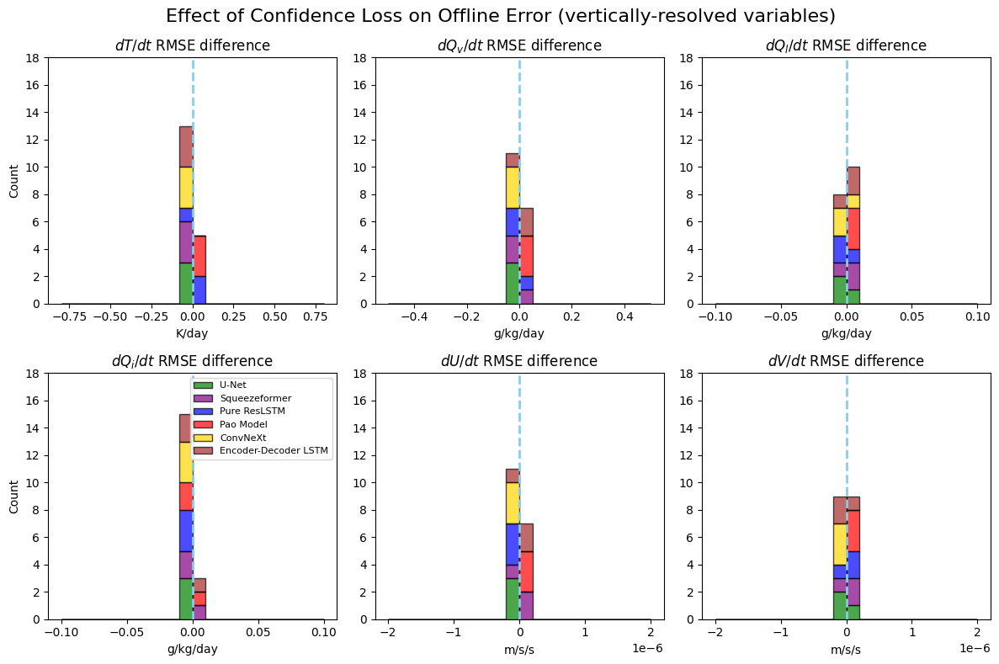

In [164]:
# make conf_loss plot

conf_loss_dTdt_offline_diff = []
conf_loss_dTdt_offline_diff.append([(conf_loss_unet_rmse[seed]['rmse_dTdt'] - standard_unet_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])
conf_loss_dTdt_offline_diff.append([(conf_loss_squeezeformer_rmse[seed]['rmse_dTdt'] - standard_squeezeformer_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])
conf_loss_dTdt_offline_diff.append([(conf_loss_pure_resLSTM_rmse[seed]['rmse_dTdt'] - standard_pure_resLSTM_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])
conf_loss_dTdt_offline_diff.append([(conf_loss_pao_model_rmse[seed]['rmse_dTdt'] - standard_pao_model_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])
conf_loss_dTdt_offline_diff.append([(conf_loss_convnext_rmse[seed]['rmse_dTdt'] - standard_convnext_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])
conf_loss_dTdt_offline_diff.append([(conf_loss_encdec_lstm_rmse[seed]['rmse_dTdt'] - standard_encdec_lstm_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])

conf_loss_dQvdt_offline_diff = []
conf_loss_dQvdt_offline_diff.append([(conf_loss_unet_rmse[seed]['rmse_dQvdt'] - standard_unet_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])
conf_loss_dQvdt_offline_diff.append([(conf_loss_squeezeformer_rmse[seed]['rmse_dQvdt'] - standard_squeezeformer_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])
conf_loss_dQvdt_offline_diff.append([(conf_loss_pure_resLSTM_rmse[seed]['rmse_dQvdt'] - standard_pure_resLSTM_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])
conf_loss_dQvdt_offline_diff.append([(conf_loss_pao_model_rmse[seed]['rmse_dQvdt'] - standard_pao_model_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])
conf_loss_dQvdt_offline_diff.append([(conf_loss_convnext_rmse[seed]['rmse_dQvdt'] - standard_convnext_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])
conf_loss_dQvdt_offline_diff.append([(conf_loss_encdec_lstm_rmse[seed]['rmse_dQvdt'] - standard_encdec_lstm_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])

conf_loss_dQldt_offline_diff = []
conf_loss_dQldt_offline_diff.append([(conf_loss_unet_rmse[seed]['rmse_dQldt'] - standard_unet_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])
conf_loss_dQldt_offline_diff.append([(conf_loss_squeezeformer_rmse[seed]['rmse_dQldt'] - standard_squeezeformer_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])
conf_loss_dQldt_offline_diff.append([(conf_loss_pure_resLSTM_rmse[seed]['rmse_dQldt'] - standard_pure_resLSTM_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])
conf_loss_dQldt_offline_diff.append([(conf_loss_pao_model_rmse[seed]['rmse_dQldt'] - standard_pao_model_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])
conf_loss_dQldt_offline_diff.append([(conf_loss_convnext_rmse[seed]['rmse_dQldt'] - standard_convnext_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])
conf_loss_dQldt_offline_diff.append([(conf_loss_encdec_lstm_rmse[seed]['rmse_dQldt'] - standard_encdec_lstm_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])

conf_loss_dQidt_offline_diff = []
conf_loss_dQidt_offline_diff.append([(conf_loss_unet_rmse[seed]['rmse_dQidt'] - standard_unet_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])
conf_loss_dQidt_offline_diff.append([(conf_loss_squeezeformer_rmse[seed]['rmse_dQidt'] - standard_squeezeformer_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])
conf_loss_dQidt_offline_diff.append([(conf_loss_pure_resLSTM_rmse[seed]['rmse_dQidt'] - standard_pure_resLSTM_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])
conf_loss_dQidt_offline_diff.append([(conf_loss_pao_model_rmse[seed]['rmse_dQidt'] - standard_pao_model_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])
conf_loss_dQidt_offline_diff.append([(conf_loss_convnext_rmse[seed]['rmse_dQidt'] - standard_convnext_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])
conf_loss_dQidt_offline_diff.append([(conf_loss_encdec_lstm_rmse[seed]['rmse_dQidt'] - standard_encdec_lstm_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])

conf_loss_dUdt_offline_diff = []
conf_loss_dUdt_offline_diff.append([conf_loss_unet_rmse[seed]['rmse_dUdt'] - standard_unet_rmse[seed]['rmse_dUdt'] for seed in seeds])
conf_loss_dUdt_offline_diff.append([conf_loss_squeezeformer_rmse[seed]['rmse_dUdt'] - standard_squeezeformer_rmse[seed]['rmse_dUdt'] for seed in seeds])
conf_loss_dUdt_offline_diff.append([conf_loss_pure_resLSTM_rmse[seed]['rmse_dUdt'] - standard_pure_resLSTM_rmse[seed]['rmse_dUdt'] for seed in seeds])
conf_loss_dUdt_offline_diff.append([conf_loss_pao_model_rmse[seed]['rmse_dUdt'] - standard_pao_model_rmse[seed]['rmse_dUdt'] for seed in seeds])
conf_loss_dUdt_offline_diff.append([conf_loss_convnext_rmse[seed]['rmse_dUdt'] - standard_convnext_rmse[seed]['rmse_dUdt'] for seed in seeds])
conf_loss_dUdt_offline_diff.append([conf_loss_encdec_lstm_rmse[seed]['rmse_dUdt'] - standard_encdec_lstm_rmse[seed]['rmse_dUdt'] for seed in seeds])

conf_loss_dVdt_offline_diff = []
conf_loss_dVdt_offline_diff.append([conf_loss_unet_rmse[seed]['rmse_dVdt'] - standard_unet_rmse[seed]['rmse_dVdt'] for seed in seeds])
conf_loss_dVdt_offline_diff.append([conf_loss_squeezeformer_rmse[seed]['rmse_dVdt'] - standard_squeezeformer_rmse[seed]['rmse_dVdt'] for seed in seeds])
conf_loss_dVdt_offline_diff.append([conf_loss_pure_resLSTM_rmse[seed]['rmse_dVdt'] - standard_pure_resLSTM_rmse[seed]['rmse_dVdt'] for seed in seeds])
conf_loss_dVdt_offline_diff.append([conf_loss_pao_model_rmse[seed]['rmse_dVdt'] - standard_pao_model_rmse[seed]['rmse_dVdt'] for seed in seeds])
conf_loss_dVdt_offline_diff.append([conf_loss_convnext_rmse[seed]['rmse_dVdt'] - standard_convnext_rmse[seed]['rmse_dVdt'] for seed in seeds])
conf_loss_dVdt_offline_diff.append([conf_loss_encdec_lstm_rmse[seed]['rmse_dVdt'] - standard_encdec_lstm_rmse[seed]['rmse_dVdt'] for seed in seeds])

# Create a figure with 3 subplots (1 row, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(12, 8))

colors = ['green', 'purple', 'blue', 'red', 'gold', 'brown']
dTdt_bin_edges = np.linspace(-.8, .8, 21)
dQvdt_bin_edges = np.linspace(-.5, .5, 21)
dQldt_bin_edges = np.linspace(-.1, .1, 21)
dQidt_bin_edges = np.linspace(-.1, .1, 21)
dUdt_bin_edges = np.linspace(-2.0e-6, 2.0e-6, 21)
dVdt_bin_edges = np.linspace(-2.0e-6, 2.0e-6, 21)

# Plot histograms in each subplot
axes[0,0].hist(conf_loss_dTdt_offline_diff, bins = dTdt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[0,0].set_title(r'$dT/dt$ RMSE difference')
axes[0,0].set_ylabel('Count')
axes[0,0].set_xlabel('K/day')
axes[0,0].set_ylim(0,18)
axes[0,0].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[0,0].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

axes[0,1].hist(conf_loss_dQvdt_offline_diff, bins = dQvdt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[0,1].set_title(r'$dQ_v/dt$ RMSE difference')
axes[0,1].set_xlabel('g/kg/day')
axes[0,1].set_ylim(0,18)
axes[0,1].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[0,1].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

axes[0,2].hist(conf_loss_dQldt_offline_diff, bins = dQldt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[0,2].set_title(r'$dQ_l/dt$ RMSE difference')
axes[0,2].set_xlabel('g/kg/day')
axes[0,2].set_ylim(0,18)
axes[0,2].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[0,2].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

axes[1,0].hist(conf_loss_dQidt_offline_diff, bins = dQidt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[1,0].set_title('$dQ_i/dt$ RMSE difference')
axes[1,0].set_xlabel('g/kg/day')
axes[1,0].set_ylim(0,18)
axes[1,0].legend(ncol = 1, fontsize = 8)
axes[1,0].set_ylabel('Count')
axes[1,0].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[1,0].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

axes[1,1].hist(conf_loss_dUdt_offline_diff, bins = dUdt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[1,1].set_title('$dU/dt$ RMSE difference')
axes[1,1].set_xlabel('m/s/s')
axes[1,1].set_ylim(0,18)
axes[1,1].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[1,1].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

axes[1,2].hist(conf_loss_dVdt_offline_diff, bins = dVdt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[1,2].set_title('$dV/dt$ RMSE difference')
axes[1,2].set_xlabel('m/s/s')
axes[1,2].set_ylim(0,18)
axes[1,2].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[1,2].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

# Add overall title and adjust layout
fig.suptitle('Effect of Confidence Loss on Offline Error (vertically-resolved variables)', fontsize=16)
plt.tight_layout()
plt.show()

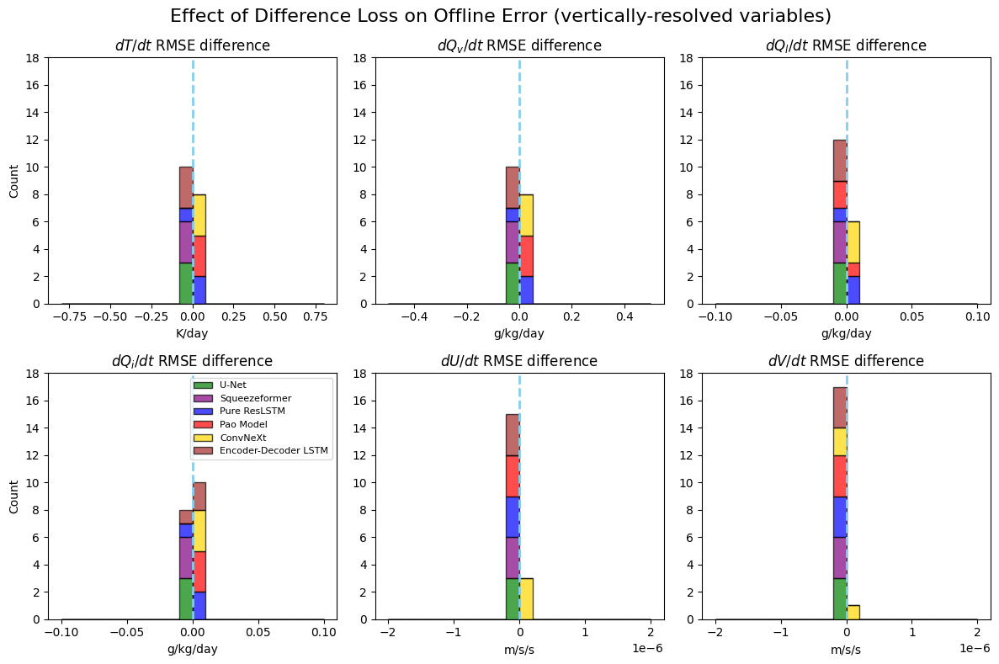

In [163]:
# make diff_loss plot

diff_loss_dTdt_offline_diff = []
diff_loss_dTdt_offline_diff.append([(diff_loss_unet_rmse[seed]['rmse_dTdt'] - standard_unet_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])
diff_loss_dTdt_offline_diff.append([(diff_loss_squeezeformer_rmse[seed]['rmse_dTdt'] - standard_squeezeformer_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])
diff_loss_dTdt_offline_diff.append([(diff_loss_pure_resLSTM_rmse[seed]['rmse_dTdt'] - standard_pure_resLSTM_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])
diff_loss_dTdt_offline_diff.append([(diff_loss_pao_model_rmse[seed]['rmse_dTdt'] - standard_pao_model_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])
diff_loss_dTdt_offline_diff.append([(diff_loss_convnext_rmse[seed]['rmse_dTdt'] - standard_convnext_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])
diff_loss_dTdt_offline_diff.append([(diff_loss_encdec_lstm_rmse[seed]['rmse_dTdt'] - standard_encdec_lstm_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])

diff_loss_dQvdt_offline_diff = []
diff_loss_dQvdt_offline_diff.append([(diff_loss_unet_rmse[seed]['rmse_dQvdt'] - standard_unet_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])
diff_loss_dQvdt_offline_diff.append([(diff_loss_squeezeformer_rmse[seed]['rmse_dQvdt'] - standard_squeezeformer_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])
diff_loss_dQvdt_offline_diff.append([(diff_loss_pure_resLSTM_rmse[seed]['rmse_dQvdt'] - standard_pure_resLSTM_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])
diff_loss_dQvdt_offline_diff.append([(diff_loss_pao_model_rmse[seed]['rmse_dQvdt'] - standard_pao_model_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])
diff_loss_dQvdt_offline_diff.append([(diff_loss_convnext_rmse[seed]['rmse_dQvdt'] - standard_convnext_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])
diff_loss_dQvdt_offline_diff.append([(diff_loss_encdec_lstm_rmse[seed]['rmse_dQvdt'] - standard_encdec_lstm_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])

diff_loss_dQldt_offline_diff = []
diff_loss_dQldt_offline_diff.append([(diff_loss_unet_rmse[seed]['rmse_dQldt'] - standard_unet_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])
diff_loss_dQldt_offline_diff.append([(diff_loss_squeezeformer_rmse[seed]['rmse_dQldt'] - standard_squeezeformer_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])
diff_loss_dQldt_offline_diff.append([(diff_loss_pure_resLSTM_rmse[seed]['rmse_dQldt'] - standard_pure_resLSTM_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])
diff_loss_dQldt_offline_diff.append([(diff_loss_pao_model_rmse[seed]['rmse_dQldt'] - standard_pao_model_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])
diff_loss_dQldt_offline_diff.append([(diff_loss_convnext_rmse[seed]['rmse_dQldt'] - standard_convnext_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])
diff_loss_dQldt_offline_diff.append([(diff_loss_encdec_lstm_rmse[seed]['rmse_dQldt'] - standard_encdec_lstm_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])

diff_loss_dQidt_offline_diff = []
diff_loss_dQidt_offline_diff.append([(diff_loss_unet_rmse[seed]['rmse_dQidt'] - standard_unet_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])
diff_loss_dQidt_offline_diff.append([(diff_loss_squeezeformer_rmse[seed]['rmse_dQidt'] - standard_squeezeformer_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])
diff_loss_dQidt_offline_diff.append([(diff_loss_pure_resLSTM_rmse[seed]['rmse_dQidt'] - standard_pure_resLSTM_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])
diff_loss_dQidt_offline_diff.append([(diff_loss_pao_model_rmse[seed]['rmse_dQidt'] - standard_pao_model_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])
diff_loss_dQidt_offline_diff.append([(diff_loss_convnext_rmse[seed]['rmse_dQidt'] - standard_convnext_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])
diff_loss_dQidt_offline_diff.append([(diff_loss_encdec_lstm_rmse[seed]['rmse_dQidt'] - standard_encdec_lstm_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])

diff_loss_dUdt_offline_diff = []
diff_loss_dUdt_offline_diff.append([diff_loss_unet_rmse[seed]['rmse_dUdt'] - standard_unet_rmse[seed]['rmse_dUdt'] for seed in seeds])
diff_loss_dUdt_offline_diff.append([diff_loss_squeezeformer_rmse[seed]['rmse_dUdt'] - standard_squeezeformer_rmse[seed]['rmse_dUdt'] for seed in seeds])
diff_loss_dUdt_offline_diff.append([diff_loss_pure_resLSTM_rmse[seed]['rmse_dUdt'] - standard_pure_resLSTM_rmse[seed]['rmse_dUdt'] for seed in seeds])
diff_loss_dUdt_offline_diff.append([diff_loss_pao_model_rmse[seed]['rmse_dUdt'] - standard_pao_model_rmse[seed]['rmse_dUdt'] for seed in seeds])
diff_loss_dUdt_offline_diff.append([diff_loss_convnext_rmse[seed]['rmse_dUdt'] - standard_convnext_rmse[seed]['rmse_dUdt'] for seed in seeds])
diff_loss_dUdt_offline_diff.append([diff_loss_encdec_lstm_rmse[seed]['rmse_dUdt'] - standard_encdec_lstm_rmse[seed]['rmse_dUdt'] for seed in seeds])

diff_loss_dVdt_offline_diff = []
diff_loss_dVdt_offline_diff.append([diff_loss_unet_rmse[seed]['rmse_dVdt'] - standard_unet_rmse[seed]['rmse_dVdt'] for seed in seeds])
diff_loss_dVdt_offline_diff.append([diff_loss_squeezeformer_rmse[seed]['rmse_dVdt'] - standard_squeezeformer_rmse[seed]['rmse_dVdt'] for seed in seeds])
diff_loss_dVdt_offline_diff.append([diff_loss_pure_resLSTM_rmse[seed]['rmse_dVdt'] - standard_pure_resLSTM_rmse[seed]['rmse_dVdt'] for seed in seeds])
diff_loss_dVdt_offline_diff.append([diff_loss_pao_model_rmse[seed]['rmse_dVdt'] - standard_pao_model_rmse[seed]['rmse_dVdt'] for seed in seeds])
diff_loss_dVdt_offline_diff.append([diff_loss_convnext_rmse[seed]['rmse_dVdt'] - standard_convnext_rmse[seed]['rmse_dVdt'] for seed in seeds])
diff_loss_dVdt_offline_diff.append([diff_loss_encdec_lstm_rmse[seed]['rmse_dVdt'] - standard_encdec_lstm_rmse[seed]['rmse_dVdt'] for seed in seeds])

# Create a figure with 3 subplots (1 row, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(12, 8))

colors = ['green', 'purple', 'blue', 'red', 'gold', 'brown']
dTdt_bin_edges = np.linspace(-.8, .8, 21)
dQvdt_bin_edges = np.linspace(-.5, .5, 21)
dQldt_bin_edges = np.linspace(-.1, .1, 21)
dQidt_bin_edges = np.linspace(-.1, .1, 21)
dUdt_bin_edges = np.linspace(-2.0e-6, 2.0e-6, 21)
dVdt_bin_edges = np.linspace(-2.0e-6, 2.0e-6, 21)

# Plot histograms in each subplot
axes[0,0].hist(diff_loss_dTdt_offline_diff, bins = dTdt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[0,0].set_title(r'$dT/dt$ RMSE difference')
axes[0,0].set_ylabel('Count')
axes[0,0].set_xlabel('K/day')
axes[0,0].set_ylim(0,18)
axes[0,0].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[0,0].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

axes[0,1].hist(diff_loss_dQvdt_offline_diff, bins = dQvdt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[0,1].set_title(r'$dQ_v/dt$ RMSE difference')
axes[0,1].set_xlabel('g/kg/day')
axes[0,1].set_ylim(0,18)
axes[0,1].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[0,1].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

axes[0,2].hist(diff_loss_dQldt_offline_diff, bins = dQldt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[0,2].set_title(r'$dQ_l/dt$ RMSE difference')
axes[0,2].set_xlabel('g/kg/day')
axes[0,2].set_ylim(0,18)
axes[0,2].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[0,2].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

axes[1,0].hist(diff_loss_dQidt_offline_diff, bins = dQidt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[1,0].set_title('$dQ_i/dt$ RMSE difference')
axes[1,0].set_xlabel('g/kg/day')
axes[1,0].set_ylim(0,18)
axes[1,0].legend(ncol = 1, fontsize = 8)
axes[1,0].set_ylabel('Count')
axes[1,0].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[1,0].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

axes[1,1].hist(diff_loss_dUdt_offline_diff, bins = dUdt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[1,1].set_title('$dU/dt$ RMSE difference')
axes[1,1].set_xlabel('m/s/s')
axes[1,1].set_ylim(0,18)
axes[1,1].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[1,1].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

axes[1,2].hist(diff_loss_dVdt_offline_diff, bins = dVdt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[1,2].set_title('$dV/dt$ RMSE difference')
axes[1,2].set_xlabel('m/s/s')
axes[1,2].set_ylim(0,18)
axes[1,2].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[1,2].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

# Add overall title and adjust layout
fig.suptitle('Effect of Difference Loss on Offline Error (vertically-resolved variables)', fontsize=16)
plt.tight_layout()
plt.show()

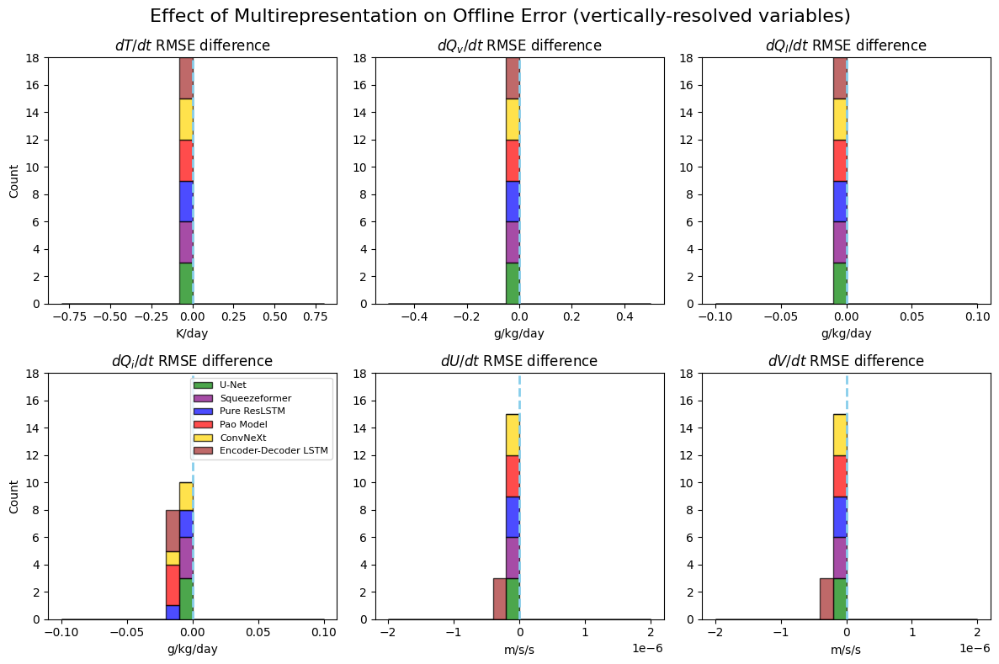

In [162]:
# make multirep plot

multirep_dTdt_offline_diff = []
multirep_dTdt_offline_diff.append([(multirep_unet_rmse[seed]['rmse_dTdt'] - standard_unet_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])
multirep_dTdt_offline_diff.append([(multirep_squeezeformer_rmse[seed]['rmse_dTdt'] - standard_squeezeformer_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])
multirep_dTdt_offline_diff.append([(multirep_pure_resLSTM_rmse[seed]['rmse_dTdt'] - standard_pure_resLSTM_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])
multirep_dTdt_offline_diff.append([(multirep_pao_model_rmse[seed]['rmse_dTdt'] - standard_pao_model_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])
multirep_dTdt_offline_diff.append([(multirep_convnext_rmse[seed]['rmse_dTdt'] - standard_convnext_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])
multirep_dTdt_offline_diff.append([(multirep_encdec_lstm_rmse[seed]['rmse_dTdt'] - standard_encdec_lstm_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])

multirep_dQvdt_offline_diff = []
multirep_dQvdt_offline_diff.append([(multirep_unet_rmse[seed]['rmse_dQvdt'] - standard_unet_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])
multirep_dQvdt_offline_diff.append([(multirep_squeezeformer_rmse[seed]['rmse_dQvdt'] - standard_squeezeformer_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])
multirep_dQvdt_offline_diff.append([(multirep_pure_resLSTM_rmse[seed]['rmse_dQvdt'] - standard_pure_resLSTM_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])
multirep_dQvdt_offline_diff.append([(multirep_pao_model_rmse[seed]['rmse_dQvdt'] - standard_pao_model_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])
multirep_dQvdt_offline_diff.append([(multirep_convnext_rmse[seed]['rmse_dQvdt'] - standard_convnext_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])
multirep_dQvdt_offline_diff.append([(multirep_encdec_lstm_rmse[seed]['rmse_dQvdt'] - standard_encdec_lstm_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])

multirep_dQldt_offline_diff = []
multirep_dQldt_offline_diff.append([(multirep_unet_rmse[seed]['rmse_dQldt'] - standard_unet_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])
multirep_dQldt_offline_diff.append([(multirep_squeezeformer_rmse[seed]['rmse_dQldt'] - standard_squeezeformer_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])
multirep_dQldt_offline_diff.append([(multirep_pure_resLSTM_rmse[seed]['rmse_dQldt'] - standard_pure_resLSTM_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])
multirep_dQldt_offline_diff.append([(multirep_pao_model_rmse[seed]['rmse_dQldt'] - standard_pao_model_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])
multirep_dQldt_offline_diff.append([(multirep_convnext_rmse[seed]['rmse_dQldt'] - standard_convnext_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])
multirep_dQldt_offline_diff.append([(multirep_encdec_lstm_rmse[seed]['rmse_dQldt'] - standard_encdec_lstm_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])

multirep_dQidt_offline_diff = []
multirep_dQidt_offline_diff.append([(multirep_unet_rmse[seed]['rmse_dQidt'] - standard_unet_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])
multirep_dQidt_offline_diff.append([(multirep_squeezeformer_rmse[seed]['rmse_dQidt'] - standard_squeezeformer_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])
multirep_dQidt_offline_diff.append([(multirep_pure_resLSTM_rmse[seed]['rmse_dQidt'] - standard_pure_resLSTM_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])
multirep_dQidt_offline_diff.append([(multirep_pao_model_rmse[seed]['rmse_dQidt'] - standard_pao_model_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])
multirep_dQidt_offline_diff.append([(multirep_convnext_rmse[seed]['rmse_dQidt'] - standard_convnext_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])
multirep_dQidt_offline_diff.append([(multirep_encdec_lstm_rmse[seed]['rmse_dQidt'] - standard_encdec_lstm_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])

multirep_dUdt_offline_diff = []
multirep_dUdt_offline_diff.append([multirep_unet_rmse[seed]['rmse_dUdt'] - standard_unet_rmse[seed]['rmse_dUdt'] for seed in seeds])
multirep_dUdt_offline_diff.append([multirep_squeezeformer_rmse[seed]['rmse_dUdt'] - standard_squeezeformer_rmse[seed]['rmse_dUdt'] for seed in seeds])
multirep_dUdt_offline_diff.append([multirep_pure_resLSTM_rmse[seed]['rmse_dUdt'] - standard_pure_resLSTM_rmse[seed]['rmse_dUdt'] for seed in seeds])
multirep_dUdt_offline_diff.append([multirep_pao_model_rmse[seed]['rmse_dUdt'] - standard_pao_model_rmse[seed]['rmse_dUdt'] for seed in seeds])
multirep_dUdt_offline_diff.append([multirep_convnext_rmse[seed]['rmse_dUdt'] - standard_convnext_rmse[seed]['rmse_dUdt'] for seed in seeds])
multirep_dUdt_offline_diff.append([multirep_encdec_lstm_rmse[seed]['rmse_dUdt'] - standard_encdec_lstm_rmse[seed]['rmse_dUdt'] for seed in seeds])

multirep_dVdt_offline_diff = []
multirep_dVdt_offline_diff.append([multirep_unet_rmse[seed]['rmse_dVdt'] - standard_unet_rmse[seed]['rmse_dVdt'] for seed in seeds])
multirep_dVdt_offline_diff.append([multirep_squeezeformer_rmse[seed]['rmse_dVdt'] - standard_squeezeformer_rmse[seed]['rmse_dVdt'] for seed in seeds])
multirep_dVdt_offline_diff.append([multirep_pure_resLSTM_rmse[seed]['rmse_dVdt'] - standard_pure_resLSTM_rmse[seed]['rmse_dVdt'] for seed in seeds])
multirep_dVdt_offline_diff.append([multirep_pao_model_rmse[seed]['rmse_dVdt'] - standard_pao_model_rmse[seed]['rmse_dVdt'] for seed in seeds])
multirep_dVdt_offline_diff.append([multirep_convnext_rmse[seed]['rmse_dVdt'] - standard_convnext_rmse[seed]['rmse_dVdt'] for seed in seeds])
multirep_dVdt_offline_diff.append([multirep_encdec_lstm_rmse[seed]['rmse_dVdt'] - standard_encdec_lstm_rmse[seed]['rmse_dVdt'] for seed in seeds])

# Create a figure with 3 subplots (1 row, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(12, 8))

colors = ['green', 'purple', 'blue', 'red', 'gold', 'brown']
dTdt_bin_edges = np.linspace(-.8, .8, 21)
dQvdt_bin_edges = np.linspace(-.5, .5, 21)
dQldt_bin_edges = np.linspace(-.1, .1, 21)
dQidt_bin_edges = np.linspace(-.1, .1, 21)
dUdt_bin_edges = np.linspace(-2.0e-6, 2.0e-6, 21)
dVdt_bin_edges = np.linspace(-2.0e-6, 2.0e-6, 21)

# Plot histograms in each subplot
axes[0,0].hist(multirep_dTdt_offline_diff, bins = dTdt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[0,0].set_title(r'$dT/dt$ RMSE difference')
axes[0,0].set_ylabel('Count')
axes[0,0].set_xlabel('K/day')
axes[0,0].set_ylim(0,18)
axes[0,0].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[0,0].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
axes[0,0].set_ylim(0,18)

axes[0,1].hist(multirep_dQvdt_offline_diff, bins = dQvdt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[0,1].set_title(r'$dQ_v/dt$ RMSE difference')
axes[0,1].set_xlabel('g/kg/day')
axes[0,1].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[0,1].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
axes[0,1].set_ylim(0,18)

axes[0,2].hist(multirep_dQldt_offline_diff, bins = dQldt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[0,2].set_title(r'$dQ_l/dt$ RMSE difference')
axes[0,2].set_xlabel('g/kg/day')
axes[0,2].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[0,2].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
axes[0,2].set_ylim(0,18)

axes[1,0].hist(multirep_dQidt_offline_diff, bins = dQidt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[1,0].set_title('$dQ_i/dt$ RMSE difference')
axes[1,0].set_xlabel('g/kg/day')
axes[1,0].legend(ncol = 1, fontsize = 8)
axes[1,0].set_ylabel('Count')
axes[1,0].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[1,0].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
axes[1,0].set_ylim(0,18)

axes[1,1].hist(multirep_dUdt_offline_diff, bins = dUdt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[1,1].set_title('$dU/dt$ RMSE difference')
axes[1,1].set_xlabel('m/s/s')
axes[1,1].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[1,1].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
axes[1,1].set_ylim(0,18)

axes[1,2].hist(multirep_dVdt_offline_diff, bins = dVdt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[1,2].set_title('$dV/dt$ RMSE difference')
axes[1,2].set_xlabel('m/s/s')
axes[1,2].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[1,2].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
axes[1,2].set_ylim(0,18)

# Add overall title and adjust layout
fig.suptitle('Effect of Multirepresentation on Offline Error (vertically-resolved variables)', fontsize=16)
plt.tight_layout()
plt.show()

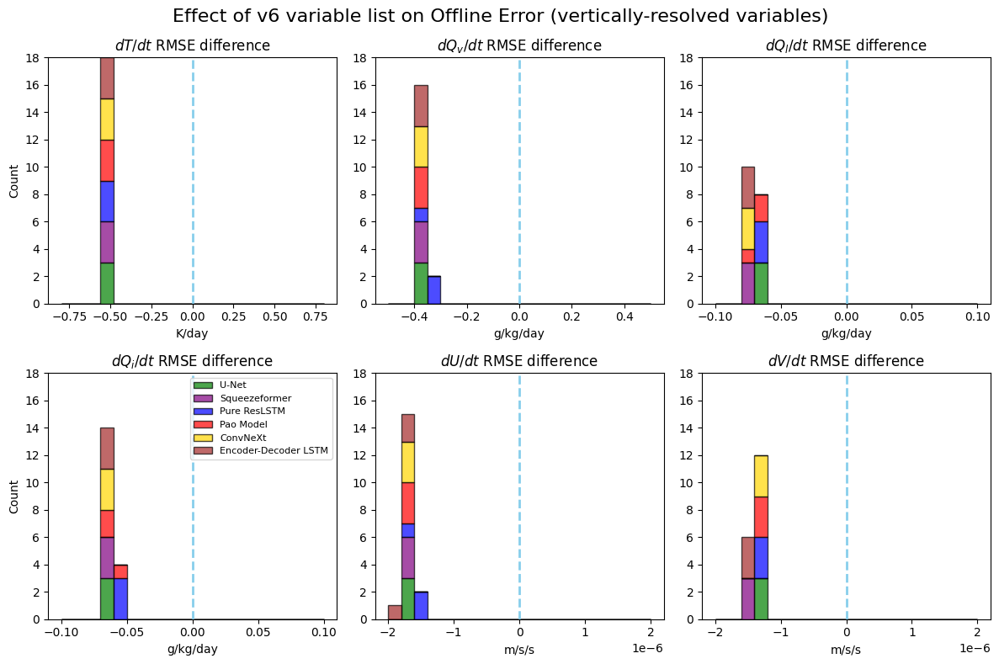

In [161]:
# make v6 plot

v6_dTdt_offline_diff = []
v6_dTdt_offline_diff.append([(v6_unet_rmse[seed]['rmse_dTdt'] - standard_unet_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])
v6_dTdt_offline_diff.append([(v6_squeezeformer_rmse[seed]['rmse_dTdt'] - standard_squeezeformer_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])
v6_dTdt_offline_diff.append([(v6_pure_resLSTM_rmse[seed]['rmse_dTdt'] - standard_pure_resLSTM_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])
v6_dTdt_offline_diff.append([(v6_pao_model_rmse[seed]['rmse_dTdt'] - standard_pao_model_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])
v6_dTdt_offline_diff.append([(v6_convnext_rmse[seed]['rmse_dTdt'] - standard_convnext_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])
v6_dTdt_offline_diff.append([(v6_encdec_lstm_rmse[seed]['rmse_dTdt'] - standard_encdec_lstm_rmse[seed]['rmse_dTdt'])*86400 for seed in seeds])

v6_dQvdt_offline_diff = []
v6_dQvdt_offline_diff.append([(v6_unet_rmse[seed]['rmse_dQvdt'] - standard_unet_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])
v6_dQvdt_offline_diff.append([(v6_squeezeformer_rmse[seed]['rmse_dQvdt'] - standard_squeezeformer_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])
v6_dQvdt_offline_diff.append([(v6_pure_resLSTM_rmse[seed]['rmse_dQvdt'] - standard_pure_resLSTM_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])
v6_dQvdt_offline_diff.append([(v6_pao_model_rmse[seed]['rmse_dQvdt'] - standard_pao_model_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])
v6_dQvdt_offline_diff.append([(v6_convnext_rmse[seed]['rmse_dQvdt'] - standard_convnext_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])
v6_dQvdt_offline_diff.append([(v6_encdec_lstm_rmse[seed]['rmse_dQvdt'] - standard_encdec_lstm_rmse[seed]['rmse_dQvdt'])*1000*86400 for seed in seeds])

v6_dQldt_offline_diff = []
v6_dQldt_offline_diff.append([(v6_unet_rmse[seed]['rmse_dQldt'] - standard_unet_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])
v6_dQldt_offline_diff.append([(v6_squeezeformer_rmse[seed]['rmse_dQldt'] - standard_squeezeformer_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])
v6_dQldt_offline_diff.append([(v6_pure_resLSTM_rmse[seed]['rmse_dQldt'] - standard_pure_resLSTM_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])
v6_dQldt_offline_diff.append([(v6_pao_model_rmse[seed]['rmse_dQldt'] - standard_pao_model_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])
v6_dQldt_offline_diff.append([(v6_convnext_rmse[seed]['rmse_dQldt'] - standard_convnext_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])
v6_dQldt_offline_diff.append([(v6_encdec_lstm_rmse[seed]['rmse_dQldt'] - standard_encdec_lstm_rmse[seed]['rmse_dQldt'])*1000*86400 for seed in seeds])

v6_dQidt_offline_diff = []
v6_dQidt_offline_diff.append([(v6_unet_rmse[seed]['rmse_dQidt'] - standard_unet_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])
v6_dQidt_offline_diff.append([(v6_squeezeformer_rmse[seed]['rmse_dQidt'] - standard_squeezeformer_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])
v6_dQidt_offline_diff.append([(v6_pure_resLSTM_rmse[seed]['rmse_dQidt'] - standard_pure_resLSTM_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])
v6_dQidt_offline_diff.append([(v6_pao_model_rmse[seed]['rmse_dQidt'] - standard_pao_model_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])
v6_dQidt_offline_diff.append([(v6_convnext_rmse[seed]['rmse_dQidt'] - standard_convnext_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])
v6_dQidt_offline_diff.append([(v6_encdec_lstm_rmse[seed]['rmse_dQidt'] - standard_encdec_lstm_rmse[seed]['rmse_dQidt'])*1000*86400 for seed in seeds])

v6_dUdt_offline_diff = []
v6_dUdt_offline_diff.append([v6_unet_rmse[seed]['rmse_dUdt'] - standard_unet_rmse[seed]['rmse_dUdt'] for seed in seeds])
v6_dUdt_offline_diff.append([v6_squeezeformer_rmse[seed]['rmse_dUdt'] - standard_squeezeformer_rmse[seed]['rmse_dUdt'] for seed in seeds])
v6_dUdt_offline_diff.append([v6_pure_resLSTM_rmse[seed]['rmse_dUdt'] - standard_pure_resLSTM_rmse[seed]['rmse_dUdt'] for seed in seeds])
v6_dUdt_offline_diff.append([v6_pao_model_rmse[seed]['rmse_dUdt'] - standard_pao_model_rmse[seed]['rmse_dUdt'] for seed in seeds])
v6_dUdt_offline_diff.append([v6_convnext_rmse[seed]['rmse_dUdt'] - standard_convnext_rmse[seed]['rmse_dUdt'] for seed in seeds])
v6_dUdt_offline_diff.append([v6_encdec_lstm_rmse[seed]['rmse_dUdt'] - standard_encdec_lstm_rmse[seed]['rmse_dUdt'] for seed in seeds])

v6_dVdt_offline_diff = []
v6_dVdt_offline_diff.append([v6_unet_rmse[seed]['rmse_dVdt'] - standard_unet_rmse[seed]['rmse_dVdt'] for seed in seeds])
v6_dVdt_offline_diff.append([v6_squeezeformer_rmse[seed]['rmse_dVdt'] - standard_squeezeformer_rmse[seed]['rmse_dVdt'] for seed in seeds])
v6_dVdt_offline_diff.append([v6_pure_resLSTM_rmse[seed]['rmse_dVdt'] - standard_pure_resLSTM_rmse[seed]['rmse_dVdt'] for seed in seeds])
v6_dVdt_offline_diff.append([v6_pao_model_rmse[seed]['rmse_dVdt'] - standard_pao_model_rmse[seed]['rmse_dVdt'] for seed in seeds])
v6_dVdt_offline_diff.append([v6_convnext_rmse[seed]['rmse_dVdt'] - standard_convnext_rmse[seed]['rmse_dVdt'] for seed in seeds])
v6_dVdt_offline_diff.append([v6_encdec_lstm_rmse[seed]['rmse_dVdt'] - standard_encdec_lstm_rmse[seed]['rmse_dVdt'] for seed in seeds])

# Create a figure with 3 subplots (1 row, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(12, 8))

colors = ['green', 'purple', 'blue', 'red', 'gold', 'brown']
dTdt_bin_edges = np.linspace(-.8, .8, 21)
dQvdt_bin_edges = np.linspace(-.5, .5, 21)
dQldt_bin_edges = np.linspace(-.1, .1, 21)
dQidt_bin_edges = np.linspace(-.1, .1, 21)
dUdt_bin_edges = np.linspace(-2.0e-6, 2.0e-6, 21)
dVdt_bin_edges = np.linspace(-2.0e-6, 2.0e-6, 21)

# Plot histograms in each subplot
axes[0,0].hist(v6_dTdt_offline_diff, bins = dTdt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[0,0].set_title(r'$dT/dt$ RMSE difference')
axes[0,0].set_ylabel('Count')
axes[0,0].set_xlabel('K/day')
axes[0,0].set_ylim(0,18)
axes[0,0].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[0,0].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

axes[0,1].hist(v6_dQvdt_offline_diff, bins = dQvdt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[0,1].set_title(r'$dQ_v/dt$ RMSE difference')
axes[0,1].set_xlabel('g/kg/day')
axes[0,1].set_ylim(0,18)
axes[0,1].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[0,1].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

axes[0,2].hist(v6_dQldt_offline_diff, bins = dQldt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[0,2].set_title(r'$dQ_l/dt$ RMSE difference')
axes[0,2].set_xlabel('g/kg/day')
axes[0,2].set_ylim(0,18)
axes[0,2].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[0,2].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

axes[1,0].hist(v6_dQidt_offline_diff, bins = dQidt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[1,0].set_title('$dQ_i/dt$ RMSE difference')
axes[1,0].set_xlabel('g/kg/day')
axes[1,0].set_ylim(0,18)
axes[1,0].legend(ncol = 1, fontsize = 8)
axes[1,0].set_ylabel('Count')
axes[1,0].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[1,0].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

axes[1,1].hist(v6_dUdt_offline_diff, bins = dUdt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[1,1].set_title('$dU/dt$ RMSE difference')
axes[1,1].set_xlabel('m/s/s')
axes[1,1].set_ylim(0,18)
axes[1,1].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[1,1].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

axes[1,2].hist(v6_dVdt_offline_diff, bins = dVdt_bin_edges, stacked=True, alpha=0.7, label=['U-Net', 'Squeezeformer', 'Pure ResLSTM', 'Pao Model', 'ConvNeXt', 'Encoder-Decoder LSTM'], edgecolor = 'black', color = colors)
axes[1,2].set_title('$dV/dt$ RMSE difference')
axes[1,2].set_xlabel('m/s/s')
axes[1,2].set_ylim(0,18)
axes[1,2].axvline(x=0, color='skyblue', linestyle='--', linewidth=2)
axes[1,2].yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

# Add overall title and adjust layout
fig.suptitle('Effect of v6 variable list on Offline Error (vertically-resolved variables)', fontsize=16)
plt.tight_layout()
plt.show()

In [9]:
# Load r2

with open(os.path.join(offline_save_path,"standard_unet_r2.pkl"), "rb") as f:
    standard_unet_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"standard_squeezeformer_r2.pkl"), "rb") as f:
    standard_squeezeformer_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"standard_pure_resLSTM_r2.pkl"), "rb") as f:
    standard_pure_resLSTM_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"standard_pao_model_r2.pkl"), "rb") as f:
    standard_pao_model_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"standard_convnext_r2.pkl"), "rb") as f:
    standard_convnext_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"standard_encdec_lstm_r2.pkl"), "rb") as f:
    standard_encdec_lstm_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"conf_loss_unet_r2.pkl"), "rb") as f:
    conf_loss_unet_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"conf_loss_squeezeformer_r2.pkl"), "rb") as f:
    conf_loss_squeezeformer_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"conf_loss_pure_resLSTM_r2.pkl"), "rb") as f:
    conf_loss_pure_resLSTM_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"conf_loss_pao_model_r2.pkl"), "rb") as f:
    conf_loss_pao_model_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"conf_loss_convnext_r2.pkl"), "rb") as f:
    conf_loss_convnext_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"conf_loss_encdec_lstm_r2.pkl"), "rb") as f:
    conf_loss_encdec_lstm_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"diff_loss_unet_r2.pkl"), "rb") as f:
    diff_loss_unet_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"diff_loss_squeezeformer_r2.pkl"), "rb") as f:
    diff_loss_squeezeformer_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"diff_loss_pure_resLSTM_r2.pkl"), "rb") as f:
    diff_loss_pure_resLSTM_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"diff_loss_pao_model_r2.pkl"), "rb") as f:
    diff_loss_pao_model_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"diff_loss_convnext_r2.pkl"), "rb") as f:
    diff_loss_convnext_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"diff_loss_encdec_lstm_r2.pkl"), "rb") as f:
    diff_loss_encdec_lstm_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"multirep_unet_r2.pkl"), "rb") as f:
    multirep_unet_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"multirep_squeezeformer_r2.pkl"), "rb") as f:
    multirep_squeezeformer_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"multirep_pure_resLSTM_r2.pkl"), "rb") as f:
    multirep_pure_resLSTM_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"multirep_pao_model_r2.pkl"), "rb") as f:
    multirep_pao_model_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"multirep_convnext_r2.pkl"), "rb") as f:
    multirep_convnext_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"multirep_encdec_lstm_r2.pkl"), "rb") as f:
    multirep_encdec_lstm_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"v6_unet_r2.pkl"), "rb") as f:
    v6_unet_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"v6_squeezeformer_r2.pkl"), "rb") as f:
    v6_squeezeformer_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"v6_pure_resLSTM_r2.pkl"), "rb") as f:
    v6_pure_resLSTM_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"v6_pao_model_r2.pkl"), "rb") as f:
    v6_pao_model_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"v6_convnext_r2.pkl"), "rb") as f:
    v6_convnext_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"v6_encdec_lstm_r2.pkl"), "rb") as f:
    v6_encdec_lstm_r2 = pickle.load(f)

# Load rmse

with open(os.path.join(offline_save_path,"standard_unet_rmse.pkl"), "rb") as f:
    standard_unet_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"standard_squeezeformer_rmse.pkl"), "rb") as f:
    standard_squeezeformer_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"standard_pure_resLSTM_rmse.pkl"), "rb") as f:
    standard_pure_resLSTM_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"standard_pao_model_rmse.pkl"), "rb") as f:
    standard_pao_model_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"standard_convnext_rmse.pkl"), "rb") as f:
    standard_convnext_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"standard_encdec_lstm_rmse.pkl"), "rb") as f:
    standard_encdec_lstm_rmse = pickle.load(f)

with open(os.path.join(offline_save_path,"conf_loss_unet_rmse.pkl"), "rb") as f:
    conf_loss_unet_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"conf_loss_squeezeformer_rmse.pkl"), "rb") as f:
    conf_loss_squeezeformer_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"conf_loss_pure_resLSTM_rmse.pkl"), "rb") as f:
    conf_loss_pure_resLSTM_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"conf_loss_pao_model_rmse.pkl"), "rb") as f:
    conf_loss_pao_model_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"conf_loss_convnext_rmse.pkl"), "rb") as f:
    conf_loss_convnext_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"conf_loss_encdec_lstm_rmse.pkl"), "rb") as f:
    conf_loss_encdec_lstm_rmse = pickle.load(f)

with open(os.path.join(offline_save_path,"diff_loss_unet_rmse.pkl"), "rb") as f:
    diff_loss_unet_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"diff_loss_squeezeformer_rmse.pkl"), "rb") as f:
    diff_loss_squeezeformer_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"diff_loss_pure_resLSTM_rmse.pkl"), "rb") as f:
    diff_loss_pure_resLSTM_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"diff_loss_pao_model_rmse.pkl"), "rb") as f:
    diff_loss_pao_model_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"diff_loss_convnext_rmse.pkl"), "rb") as f:
    diff_loss_convnext_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"diff_loss_encdec_lstm_rmse.pkl"), "rb") as f:
    diff_loss_encdec_lstm_rmse = pickle.load(f)

with open(os.path.join(offline_save_path,"multirep_unet_rmse.pkl"), "rb") as f:
    multirep_unet_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"multirep_squeezeformer_rmse.pkl"), "rb") as f:
    multirep_squeezeformer_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"multirep_pure_resLSTM_rmse.pkl"), "rb") as f:
    multirep_pure_resLSTM_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"multirep_pao_model_rmse.pkl"), "rb") as f:
    multirep_pao_model_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"multirep_convnext_rmse.pkl"), "rb") as f:
    multirep_convnext_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"multirep_encdec_lstm_rmse.pkl"), "rb") as f:
    multirep_encdec_lstm_rmse = pickle.load(f)

with open(os.path.join(offline_save_path,"v6_unet_rmse.pkl"), "rb") as f:
    v6_unet_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"v6_squeezeformer_rmse.pkl"), "rb") as f:
    v6_squeezeformer_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"v6_pure_resLSTM_rmse.pkl"), "rb") as f:
    v6_pure_resLSTM_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"v6_pao_model_rmse.pkl"), "rb") as f:
    v6_pao_model_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"v6_convnext_rmse.pkl"), "rb") as f:
    v6_convnext_rmse = pickle.load(f)
with open(os.path.join(offline_save_path,"v6_encdec_lstm_rmse.pkl"), "rb") as f:
    v6_encdec_lstm_rmse = pickle.load(f)

In [21]:
v6_encdec_lstm_rmse['seed_7'].shape

(368,)

In [13]:
def plot_offline_R2_lines(unet_r2,
                          squeezeformer_r2,
                          pure_resLSTM_r2,
                          pao_model_r2,
                          convnext_r2,
                          encdec_lstm_r2,
                          config_label):
    
    unet_dTdt_r2 = np.mean(np.stack([unet_r2[seed][0][:60] for seed in seeds]), axis = 0)
    squeezeformer_dTdt_r2 = np.mean(np.stack([squeezeformer_r2[seed][0][:60] for seed in seeds]), axis = 0)
    pure_resLSTM_dTdt_r2 = np.mean(np.stack([pure_resLSTM_r2[seed][0][:60] for seed in seeds]), axis = 0)
    pao_model_dTdt_r2 = np.mean(np.stack([pao_model_r2[seed][0][:60] for seed in seeds]), axis = 0)
    convnext_dTdt_r2 = np.mean(np.stack([convnext_r2[seed][0][:60] for seed in seeds]), axis = 0)
    encdec_lstm_dTdt_r2 = np.mean(np.stack([encdec_lstm_r2[seed][0][:60] for seed in seeds]), axis = 0)
    
    unet_dQvdt_r2 = np.mean(np.stack([unet_r2[seed][0][60:120] for seed in seeds]), axis = 0)
    squeezeformer_dQvdt_r2 = np.mean(np.stack([squeezeformer_r2[seed][0][60:120] for seed in seeds]), axis = 0)
    pure_resLSTM_dQvdt_r2 = np.mean(np.stack([pure_resLSTM_r2[seed][0][60:120] for seed in seeds]), axis = 0)
    pao_model_dQvdt_r2 = np.mean(np.stack([pao_model_r2[seed][0][60:120] for seed in seeds]), axis = 0)
    convnext_dQvdt_r2 = np.mean(np.stack([convnext_r2[seed][0][60:120] for seed in seeds]), axis = 0)
    encdec_lstm_dQvdt_r2 = np.mean(np.stack([encdec_lstm_r2[seed][0][60:120] for seed in seeds]), axis = 0)
    
    unet_dQldt_r2 = np.mean(np.stack([unet_r2[seed][0][120:180] for seed in seeds]), axis = 0)
    squeezeformer_dQldt_r2 = np.mean(np.stack([squeezeformer_r2[seed][0][120:180] for seed in seeds]), axis = 0)
    pure_resLSTM_dQldt_r2 = np.mean(np.stack([pure_resLSTM_r2[seed][0][120:180] for seed in seeds]), axis = 0)
    pao_model_dQldt_r2 = np.mean(np.stack([pao_model_r2[seed][0][120:180] for seed in seeds]), axis = 0)
    convnext_dQldt_r2 = np.mean(np.stack([convnext_r2[seed][0][120:180] for seed in seeds]), axis = 0)
    encdec_lstm_dQldt_r2 = np.mean(np.stack([encdec_lstm_r2[seed][0][120:180] for seed in seeds]), axis = 0)
    
    unet_dQidt_r2 = np.mean(np.stack([unet_r2[seed][0][180:240] for seed in seeds]), axis = 0)
    squeezeformer_dQidt_r2 = np.mean(np.stack([squeezeformer_r2[seed][0][180:240] for seed in seeds]), axis = 0)
    pure_resLSTM_dQidt_r2 = np.mean(np.stack([pure_resLSTM_r2[seed][0][180:240] for seed in seeds]), axis = 0)
    pao_model_dQidt_r2 = np.mean(np.stack([pao_model_r2[seed][0][180:240] for seed in seeds]), axis = 0)
    convnext_dQidt_r2 = np.mean(np.stack([convnext_r2[seed][0][180:240] for seed in seeds]), axis = 0)
    encdec_lstm_dQidt_r2 = np.mean(np.stack([encdec_lstm_r2[seed][0][180:240] for seed in seeds]), axis = 0)
    
    unet_dUdt_r2 = np.mean(np.stack([unet_r2[seed][0][240:300] for seed in seeds]), axis = 0)
    squeezeformer_dUdt_r2 = np.mean(np.stack([squeezeformer_r2[seed][0][240:300] for seed in seeds]), axis = 0)
    pure_resLSTM_dUdt_r2 = np.mean(np.stack([pure_resLSTM_r2[seed][0][240:300] for seed in seeds]), axis = 0)
    pao_model_dUdt_r2 = np.mean(np.stack([pao_model_r2[seed][0][240:300] for seed in seeds]), axis = 0)
    convnext_dUdt_r2 = np.mean(np.stack([convnext_r2[seed][0][240:300] for seed in seeds]), axis = 0)
    encdec_lstm_dUdt_r2 = np.mean(np.stack([encdec_lstm_r2[seed][0][240:300] for seed in seeds]), axis = 0)
    
    unet_dVdt_r2 = np.mean(np.stack([unet_r2[seed][0][300:360] for seed in seeds]), axis = 0)
    squeezeformer_dVdt_r2 = np.mean(np.stack([squeezeformer_r2[seed][0][300:360] for seed in seeds]), axis = 0)
    pure_resLSTM_dVdt_r2 = np.mean(np.stack([pure_resLSTM_r2[seed][0][300:360] for seed in seeds]), axis = 0)
    pao_model_dVdt_r2 = np.mean(np.stack([pao_model_r2[seed][0][300:360] for seed in seeds]), axis = 0)
    convnext_dVdt_r2 = np.mean(np.stack([convnext_r2[seed][0][300:360] for seed in seeds]), axis = 0)
    encdec_lstm_dVdt_r2 = np.mean(np.stack([encdec_lstm_r2[seed][0][300:360] for seed in seeds]), axis = 0)
    
    unet_NETSW_r2 = np.mean([unet_r2[seed][0][360] for seed in seeds])
    squeezeformer_NETSW_r2 = np.mean([squeezeformer_r2[seed][0][360] for seed in seeds])
    pure_resLSTM_NETSW_r2 = np.mean([pure_resLSTM_r2[seed][0][360] for seed in seeds])
    pao_model_NETSW_r2 = np.mean([pao_model_r2[seed][0][360] for seed in seeds])
    convnext_NETSW_r2 = np.mean([convnext_r2[seed][0][360] for seed in seeds])
    encdec_lstm_NETSW_r2 = np.mean([encdec_lstm_r2[seed][0][360] for seed in seeds])
    
    unet_FLWDS_r2 = np.mean([unet_r2[seed][0][361] for seed in seeds])
    squeezeformer_FLWDS_r2 = np.mean([squeezeformer_r2[seed][0][361] for seed in seeds])
    pure_resLSTM_FLWDS_r2 = np.mean([pure_resLSTM_r2[seed][0][361] for seed in seeds])
    pao_model_FLWDS_r2 = np.mean([pao_model_r2[seed][0][361] for seed in seeds])
    convnext_FLWDS_r2 = np.mean([convnext_r2[seed][0][361] for seed in seeds])
    encdec_lstm_FLWDS_r2 = np.mean([encdec_lstm_r2[seed][0][361] for seed in seeds])
    
    unet_PRECSC_r2 = np.mean([unet_r2[seed][0][362] for seed in seeds])
    squeezeformer_PRECSC_r2 = np.mean([squeezeformer_r2[seed][0][362] for seed in seeds])
    pure_resLSTM_PRECSC_r2 = np.mean([pure_resLSTM_r2[seed][0][362] for seed in seeds])
    pao_model_PRECSC_r2 = np.mean([pao_model_r2[seed][0][362] for seed in seeds])
    convnext_PRECSC_r2 = np.mean([convnext_r2[seed][0][362] for seed in seeds])
    encdec_lstm_PRECSC_r2 = np.mean([encdec_lstm_r2[seed][0][362] for seed in seeds])
    
    unet_PRECC_r2 = np.mean([unet_r2[seed][0][363] for seed in seeds])
    squeezeformer_PRECC_r2 = np.mean([squeezeformer_r2[seed][0][363] for seed in seeds])
    pure_resLSTM_PRECC_r2 = np.mean([pure_resLSTM_r2[seed][0][363] for seed in seeds])
    pao_model_PRECC_r2 = np.mean([pao_model_r2[seed][0][363] for seed in seeds])
    convnext_PRECC_r2 = np.mean([convnext_r2[seed][0][363] for seed in seeds])
    encdec_lstm_PRECC_r2 = np.mean([encdec_lstm_r2[seed][0][363] for seed in seeds])
    
    unet_SOLS_r2 = np.mean([unet_r2[seed][0][364] for seed in seeds])
    squeezeformer_SOLS_r2 = np.mean([squeezeformer_r2[seed][0][364] for seed in seeds])
    pure_resLSTM_SOLS_r2 = np.mean([pure_resLSTM_r2[seed][0][364] for seed in seeds])
    pao_model_SOLS_r2 = np.mean([pao_model_r2[seed][0][364] for seed in seeds])
    convnext_SOLS_r2 = np.mean([convnext_r2[seed][0][364] for seed in seeds])
    encdec_lstm_SOLS_r2 = np.mean([encdec_lstm_r2[seed][0][364] for seed in seeds])
    
    unet_SOLL_r2 = np.mean([unet_r2[seed][0][365] for seed in seeds])
    squeezeformer_SOLL_r2 = np.mean([squeezeformer_r2[seed][0][365] for seed in seeds])
    pure_resLSTM_SOLL_r2 = np.mean([pure_resLSTM_r2[seed][0][365] for seed in seeds])
    pao_model_SOLL_r2 = np.mean([pao_model_r2[seed][0][365] for seed in seeds])
    convnext_SOLL_r2 = np.mean([convnext_r2[seed][0][365] for seed in seeds])
    encdec_lstm_SOLL_r2 = np.mean([encdec_lstm_r2[seed][0][365] for seed in seeds])
    
    unet_SOLSD_r2 = np.mean([unet_r2[seed][0][366] for seed in seeds])
    squeezeformer_SOLSD_r2 = np.mean([squeezeformer_r2[seed][0][366] for seed in seeds])
    pure_resLSTM_SOLSD_r2 = np.mean([pure_resLSTM_r2[seed][0][366] for seed in seeds])
    pao_model_SOLSD_r2 = np.mean([pao_model_r2[seed][0][366] for seed in seeds])
    convnext_SOLSD_r2 = np.mean([convnext_r2[seed][0][366] for seed in seeds])
    encdec_lstm_SOLSD_r2 = np.mean([encdec_lstm_r2[seed][0][366] for seed in seeds])
    
    unet_SOLLD_r2 = np.mean([unet_r2[seed][0][367] for seed in seeds])
    squeezeformer_SOLLD_r2 = np.mean([squeezeformer_r2[seed][0][367] for seed in seeds])
    pure_resLSTM_SOLLD_r2 = np.mean([pure_resLSTM_r2[seed][0][367] for seed in seeds])
    pao_model_SOLLD_r2 = np.mean([pao_model_r2[seed][0][367] for seed in seeds])
    convnext_SOLLD_r2 = np.mean([convnext_r2[seed][0][367] for seed in seeds])
    encdec_lstm_SOLLD_r2 = np.mean([encdec_lstm_r2[seed][0][367] for seed in seeds])
    
    dTdt_r2 = np.stack([unet_dTdt_r2, squeezeformer_dTdt_r2, pure_resLSTM_dTdt_r2, pao_model_dTdt_r2, convnext_dTdt_r2, encdec_lstm_dTdt_r2], axis = 0)
    dQvdt_r2 = np.stack([unet_dQvdt_r2, squeezeformer_dQvdt_r2, pure_resLSTM_dQvdt_r2, pao_model_dQvdt_r2, convnext_dQvdt_r2, encdec_lstm_dQvdt_r2], axis = 0)
    dQldt_r2 = np.stack([unet_dQldt_r2, squeezeformer_dQldt_r2, pure_resLSTM_dQldt_r2, pao_model_dQldt_r2, convnext_dQldt_r2, encdec_lstm_dQldt_r2], axis = 0)
    dQidt_r2 = np.stack([unet_dQidt_r2, squeezeformer_dQidt_r2, pure_resLSTM_dQidt_r2, pao_model_dQidt_r2, convnext_dQidt_r2, encdec_lstm_dQidt_r2], axis = 0)
    dUdt_r2 = np.stack([unet_dUdt_r2, squeezeformer_dUdt_r2, pure_resLSTM_dUdt_r2, pao_model_dUdt_r2, convnext_dUdt_r2, encdec_lstm_dUdt_r2], axis = 0)
    dVdt_r2 = np.stack([unet_dVdt_r2, squeezeformer_dVdt_r2, pure_resLSTM_dVdt_r2, pao_model_dVdt_r2, convnext_dVdt_r2, encdec_lstm_dVdt_r2], axis = 0)
    scalar_NETSW_r2 = np.array([unet_NETSW_r2, squeezeformer_NETSW_r2, pure_resLSTM_NETSW_r2, pao_model_NETSW_r2, convnext_NETSW_r2, encdec_lstm_NETSW_r2])
    scalar_FLWDS_r2 = np.array([unet_FLWDS_r2, squeezeformer_FLWDS_r2, pure_resLSTM_FLWDS_r2, pao_model_FLWDS_r2, convnext_FLWDS_r2, encdec_lstm_FLWDS_r2])
    scalar_PRECSC_r2 = np.array([unet_PRECSC_r2, squeezeformer_PRECSC_r2, pure_resLSTM_PRECSC_r2, pao_model_PRECSC_r2, convnext_PRECSC_r2, encdec_lstm_PRECSC_r2])
    scalar_PRECC_r2 = np.array([unet_PRECC_r2, squeezeformer_PRECC_r2, pure_resLSTM_PRECC_r2, pao_model_PRECC_r2, convnext_PRECC_r2, encdec_lstm_PRECC_r2])
    scalar_SOLS_r2 = np.array([unet_SOLS_r2, squeezeformer_SOLS_r2, pure_resLSTM_SOLS_r2, pao_model_SOLS_r2, convnext_SOLS_r2, encdec_lstm_SOLS_r2])
    scalar_SOLL_r2 = np.array([unet_SOLL_r2, squeezeformer_SOLL_r2, pure_resLSTM_SOLL_r2, pao_model_SOLL_r2, convnext_SOLL_r2, encdec_lstm_SOLL_r2])
    scalar_SOLSD_r2 = np.array([unet_SOLSD_r2, squeezeformer_SOLSD_r2, pure_resLSTM_SOLSD_r2, pao_model_SOLSD_r2, convnext_SOLSD_r2, encdec_lstm_SOLSD_r2])
    scalar_SOLLD_r2 = np.array([unet_SOLLD_r2, squeezeformer_SOLLD_r2, pure_resLSTM_SOLLD_r2, pao_model_SOLLD_r2, convnext_SOLLD_r2, encdec_lstm_SOLLD_r2])

    sigma_pressure_levels = data_v2_rh_mc.grid_info['lev'].values
    model_names = ['UNet', 'Squeezeformer', 'PureResLSTM', 'PaoModel', 'ConvNext', 'EncDecLSTM']
    colors = ['green', 'purple', 'blue', 'red', 'gold', 'orange']

    # Six variables for the six profile panels:
    r2_profiles = {
        r'(a) $R^2$: dT/dt': dTdt_r2, 
        r'(b) $R^2$: dQ$_v$/dt': dQvdt_r2, 
        r'(c) $R^2$: dQ$_l$/dt': dQldt_r2,
        r'(d) $R^2$: dQ$_i$/dt': dQidt_r2, 
        r'(e) $R^2$: dU/dt': dUdt_r2, 
        r'(f) $R^2$: dV/dt': dVdt_r2
    }
    r2_scalars = {
        'NETSW': scalar_NETSW_r2,
        'FLWDS': scalar_FLWDS_r2,
        'PRECSC': scalar_PRECSC_r2,
        'PRECC': scalar_PRECC_r2,
        'SOLS': scalar_SOLS_r2,
        'SOLL': scalar_SOLL_r2,
        'SOLSD': scalar_SOLSD_r2,
        'SOLLD': scalar_SOLLD_r2
    }
    # --------------------------
    # 2) Set up the figure
    # --------------------------
    fig = plt.figure(figsize=(12, 10))
    gs = gridspec.GridSpec(3, 3, height_ratios=[1, 1, 0.7], hspace=0.3, wspace=0.2)
    
    for idx, var in enumerate(r2_profiles.keys()):
        row = idx // 3
        col = idx % 3
        ax = fig.add_subplot(gs[row, col])
        
        # plot each model's profile
        for m, color in enumerate(colors):
            ax.plot(r2_profiles[var][m], sigma_pressure_levels,
                    marker='o', ms=4, color=color, label=model_names[m], alpha = .6)
        
        ax.set_xlim(0, 1)
        ax.set_ylim(1000, 0)         # invert y
        ax.set_yticks([0, 200, 400, 600, 800, 1000])
        if col == 0:
            ax.set_ylabel("Hybrid pressure (hPa)")
        else:
            ax.set_yticklabels([])   # no y‐labels on inner panels
        
        ax.set_title(var, fontsize=12)
        ax.grid(True, linestyle='--', alpha=0.7)
    
    # --------------------------
    # 3) The bottom bar‐chart
    # --------------------------
    axb = fig.add_subplot(gs[2, :])
    x = np.arange(len(r2_scalars))  # the label locations
    width = 0.1  # the width of the bars
    
    for i, model in enumerate(model_names):
        values = [r2_scalars[key][i] for key in r2_scalars]
        axb.bar(x + 2*width + i*width, values, width, label=model, color=colors[i])
    
    axb.set_xticks(x + 4.5 * width)
    axb.set_xticklabels(r2_scalars.keys(), rotation=0)
    axb.set_xlim(-0.2, 8)
    axb.set_ylim(0, 1.0)
    axb.grid(True, linestyle='--', alpha=0.7)
    axb.set_ylabel("R²")
    axb.set_title("(g) Fluxes", pad=10)
    axb.legend(loc='lower left', ncol=2, frameon=True, framealpha=.9)
    fig.suptitle(r'Offline $R^2$ averaged across seeds ' +  f'({config_label} configuration)', y = .94)
    plt.tight_layout()
    plt.show()

/tmp/ipykernel_682969/3824460911.py:192: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


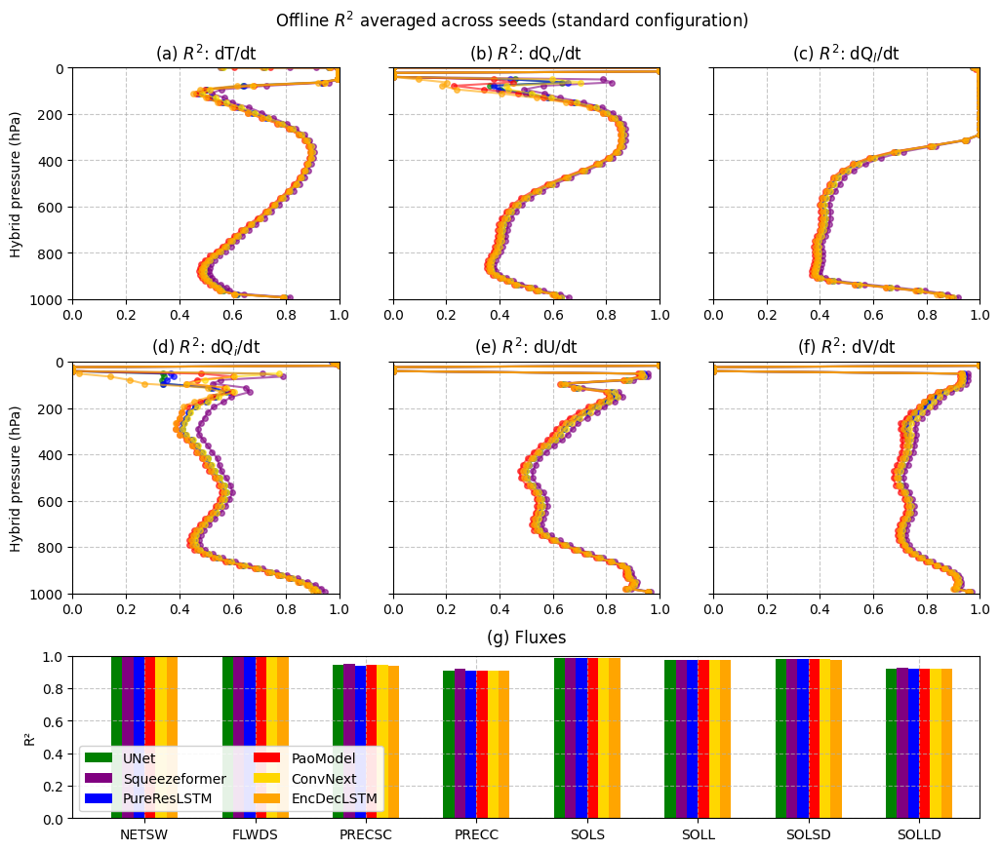

In [14]:
plot_offline_R2_lines(
      standard_unet_r2,
      standard_squeezeformer_r2,
      standard_pure_resLSTM_r2,
      standard_pao_model_r2,
      standard_convnext_r2,
      standard_encdec_lstm_r2,
      'standard'
    )

/tmp/ipykernel_682969/3824460911.py:192: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


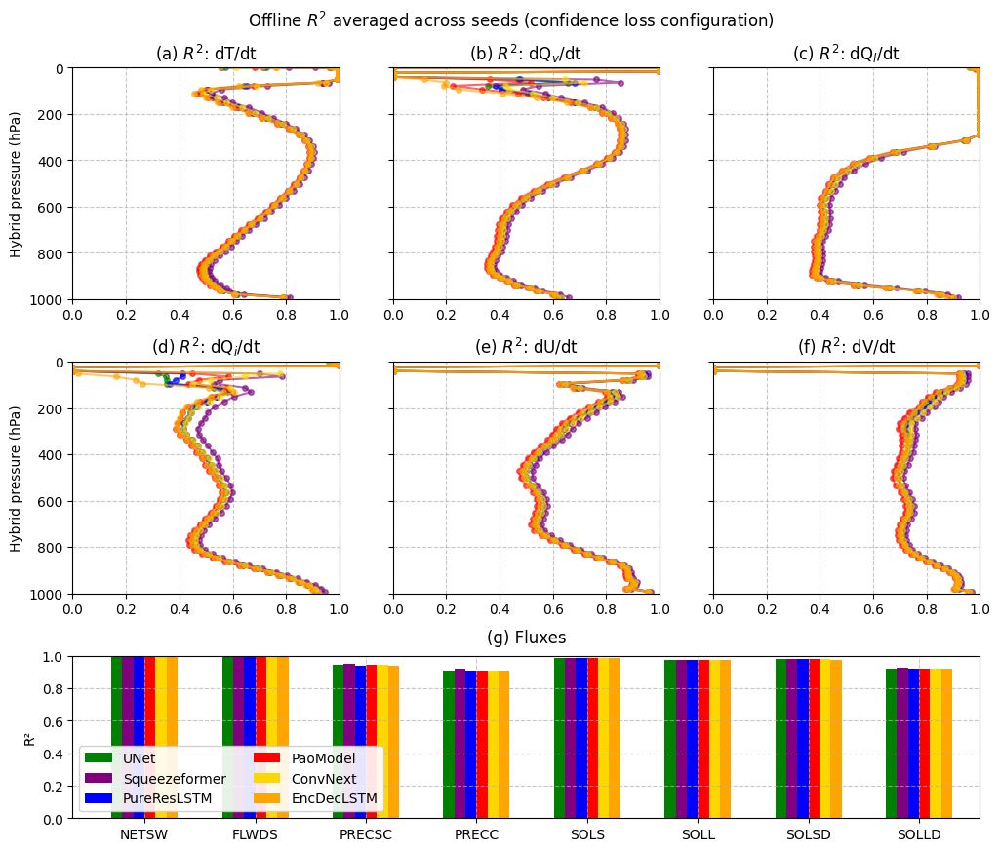

In [15]:
plot_offline_R2_lines(
      conf_loss_unet_r2,
      conf_loss_squeezeformer_r2,
      conf_loss_pure_resLSTM_r2,
      conf_loss_pao_model_r2,
      conf_loss_convnext_r2,
      conf_loss_encdec_lstm_r2,
      'confidence loss'
    )

/tmp/ipykernel_682969/3824460911.py:192: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


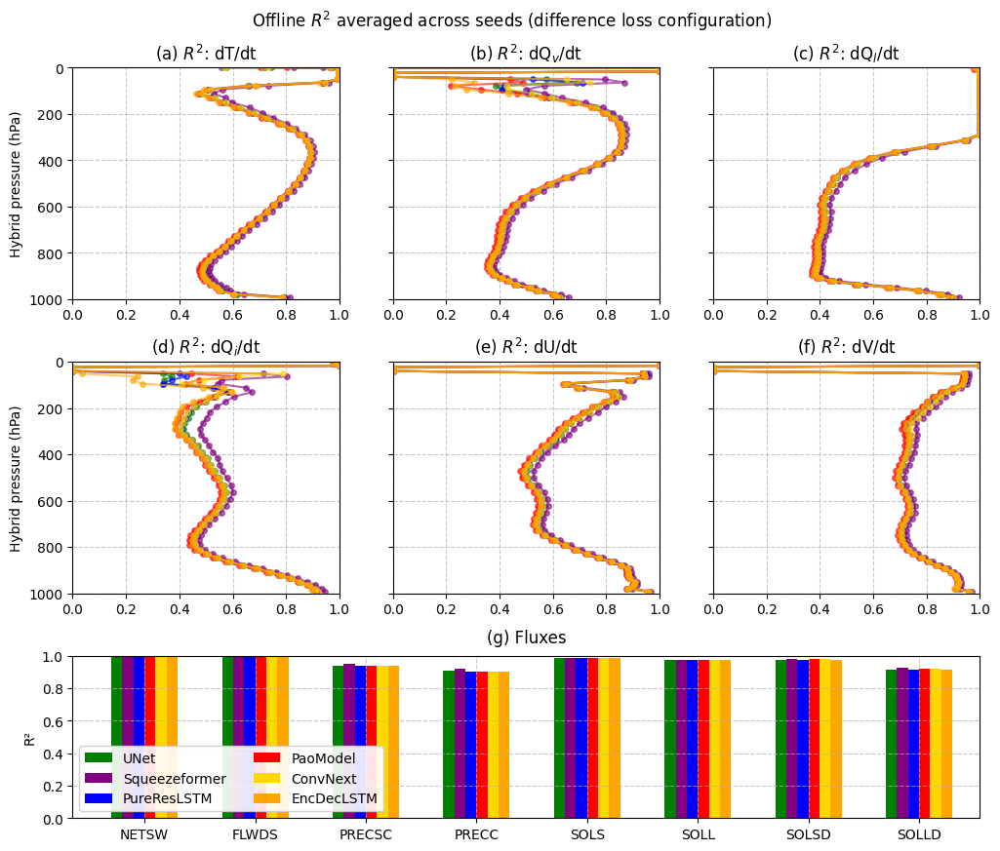

In [16]:
plot_offline_R2_lines(
      diff_loss_unet_r2,
      diff_loss_squeezeformer_r2,
      diff_loss_pure_resLSTM_r2,
      diff_loss_pao_model_r2,
      diff_loss_convnext_r2,
      diff_loss_encdec_lstm_r2,
      'difference loss'
    )

/tmp/ipykernel_682969/3824460911.py:192: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


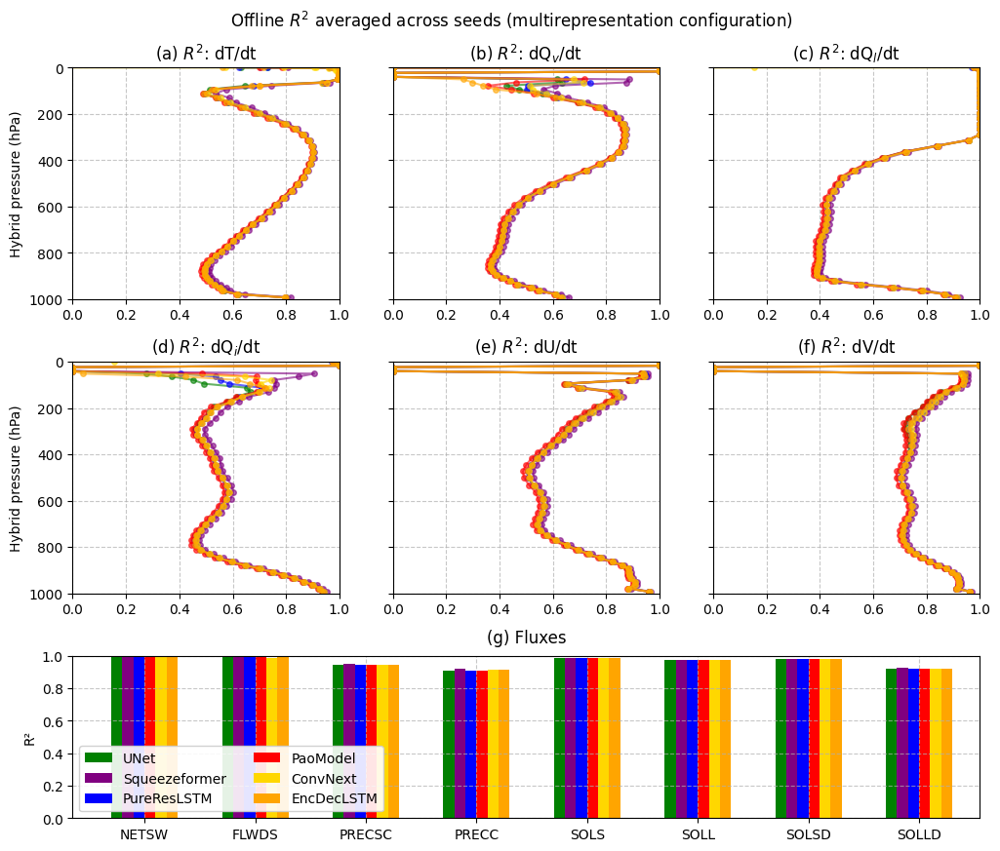

In [17]:
plot_offline_R2_lines(
      multirep_unet_r2,
      multirep_squeezeformer_r2,
      multirep_pure_resLSTM_r2,
      multirep_pao_model_r2,
      multirep_convnext_r2,
      multirep_encdec_lstm_r2,
      'multirepresentation'
    )

/tmp/ipykernel_682969/3824460911.py:192: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


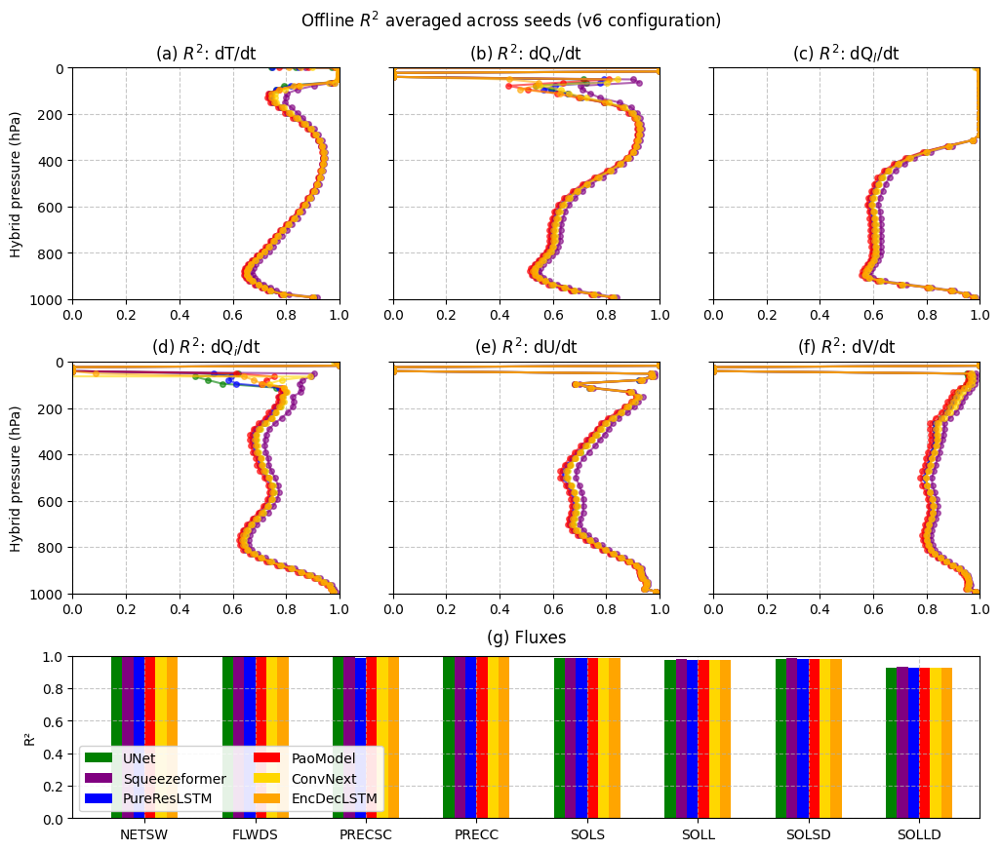

In [18]:
plot_offline_R2_lines(
      v6_unet_r2,
      v6_squeezeformer_r2,
      v6_pure_resLSTM_r2,
      v6_pao_model_r2,
      v6_convnext_r2,
      v6_encdec_lstm_r2,
      'v6'
    )

In [15]:
def get_coeff(target, pred):
    rss = np.sum((pred - target)**2, axis = 0)
    tss = np.sum((target - np.mean(target, axis = 0)[None,:,:])**2, axis = 0)
    coeff = 1 - rss/tss
    mask = tss == 0
    coeff[mask] = 1.0 * (rss[mask] == 0) 
    return coeff

# standard_unet_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], standard_preds['unet'](seed)[:,:,:60]) for seed in seeds}
# standard_unet_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], standard_preds['unet'](seed)[:,:,60:120]) for seed in seeds}
# standard_unet_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], standard_preds['unet'](seed)[:,:,120:180]) for seed in seeds}
# standard_unet_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], standard_preds['unet'](seed)[:,:,180:240]) for seed in seeds}
# standard_unet_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], standard_preds['unet'](seed)[:,:,240:300]) for seed in seeds}
# standard_unet_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], standard_preds['unet'](seed)[:,:,300:360]) for seed in seeds}

# standard_squeezeformer_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], standard_preds['squeezeformer'](seed)[:,:,:60]) for seed in seeds}
# standard_squeezeformer_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], standard_preds['squeezeformer'](seed)[:,:,60:120]) for seed in seeds}
# standard_squeezeformer_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], standard_preds['squeezeformer'](seed)[:,:,120:180]) for seed in seeds}
# standard_squeezeformer_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], standard_preds['squeezeformer'](seed)[:,:,180:240]) for seed in seeds}
# standard_squeezeformer_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], standard_preds['squeezeformer'](seed)[:,:,240:300]) for seed in seeds}
# standard_squeezeformer_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], standard_preds['squeezeformer'](seed)[:,:,300:360]) for seed in seeds}

# standard_pure_resLSTM_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], standard_preds['pure_resLSTM'](seed)[:,:,:60]) for seed in seeds}
# standard_pure_resLSTM_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], standard_preds['pure_resLSTM'](seed)[:,:,60:120]) for seed in seeds}
# standard_pure_resLSTM_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], standard_preds['pure_resLSTM'](seed)[:,:,120:180]) for seed in seeds}
# standard_pure_resLSTM_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], standard_preds['pure_resLSTM'](seed)[:,:,180:240]) for seed in seeds}
# standard_pure_resLSTM_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], standard_preds['pure_resLSTM'](seed)[:,:,240:300]) for seed in seeds}
# standard_pure_resLSTM_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], standard_preds['pure_resLSTM'](seed)[:,:,300:360]) for seed in seeds}

# standard_pao_model_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], standard_preds['pao_model'](seed)[:,:,:60]) for seed in seeds}
# standard_pao_model_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], standard_preds['pao_model'](seed)[:,:,60:120]) for seed in seeds}
# standard_pao_model_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], standard_preds['pao_model'](seed)[:,:,120:180]) for seed in seeds}
# standard_pao_model_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], standard_preds['pao_model'](seed)[:,:,180:240]) for seed in seeds}
# standard_pao_model_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], standard_preds['pao_model'](seed)[:,:,240:300]) for seed in seeds}
# standard_pao_model_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], standard_preds['pao_model'](seed)[:,:,300:360]) for seed in seeds}

# standard_convnext_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], standard_preds['convnext'](seed)[:,:,:60]) for seed in seeds}
# standard_convnext_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], standard_preds['convnext'](seed)[:,:,60:120]) for seed in seeds}
# standard_convnext_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], standard_preds['convnext'](seed)[:,:,120:180]) for seed in seeds}
# standard_convnext_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], standard_preds['convnext'](seed)[:,:,180:240]) for seed in seeds}
# standard_convnext_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], standard_preds['convnext'](seed)[:,:,240:300]) for seed in seeds}
# standard_convnext_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], standard_preds['convnext'](seed)[:,:,300:360]) for seed in seeds}

# standard_encdec_lstm_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], standard_preds['encdec_lstm'](seed)[:,:,:60]) for seed in seeds}
# standard_encdec_lstm_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], standard_preds['encdec_lstm'](seed)[:,:,60:120]) for seed in seeds}
# standard_encdec_lstm_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], standard_preds['encdec_lstm'](seed)[:,:,120:180]) for seed in seeds}
# standard_encdec_lstm_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], standard_preds['encdec_lstm'](seed)[:,:,180:240]) for seed in seeds}
# standard_encdec_lstm_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], standard_preds['encdec_lstm'](seed)[:,:,240:300]) for seed in seeds}
# standard_encdec_lstm_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], standard_preds['encdec_lstm'](seed)[:,:,300:360]) for seed in seeds}

# conf_loss_unet_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], conf_loss_preds['unet'](seed)[:,:,:60]) for seed in seeds}
# conf_loss_unet_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], conf_loss_preds['unet'](seed)[:,:,60:120]) for seed in seeds}
# conf_loss_unet_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], conf_loss_preds['unet'](seed)[:,:,120:180]) for seed in seeds}
# conf_loss_unet_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], conf_loss_preds['unet'](seed)[:,:,180:240]) for seed in seeds}
# conf_loss_unet_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], conf_loss_preds['unet'](seed)[:,:,240:300]) for seed in seeds}
# conf_loss_unet_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], conf_loss_preds['unet'](seed)[:,:,300:360]) for seed in seeds}

# conf_loss_squeezeformer_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], conf_loss_preds['squeezeformer'](seed)[:,:,:60]) for seed in seeds}
# conf_loss_squeezeformer_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], conf_loss_preds['squeezeformer'](seed)[:,:,60:120]) for seed in seeds}
# conf_loss_squeezeformer_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], conf_loss_preds['squeezeformer'](seed)[:,:,120:180]) for seed in seeds}
# conf_loss_squeezeformer_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], conf_loss_preds['squeezeformer'](seed)[:,:,180:240]) for seed in seeds}
# conf_loss_squeezeformer_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], conf_loss_preds['squeezeformer'](seed)[:,:,240:300]) for seed in seeds}
# conf_loss_squeezeformer_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], conf_loss_preds['squeezeformer'](seed)[:,:,300:360]) for seed in seeds}

# conf_loss_pure_resLSTM_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], conf_loss_preds['pure_resLSTM'](seed)[:,:,:60]) for seed in seeds}
# conf_loss_pure_resLSTM_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], conf_loss_preds['pure_resLSTM'](seed)[:,:,60:120]) for seed in seeds}
# conf_loss_pure_resLSTM_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], conf_loss_preds['pure_resLSTM'](seed)[:,:,120:180]) for seed in seeds}
# conf_loss_pure_resLSTM_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], conf_loss_preds['pure_resLSTM'](seed)[:,:,180:240]) for seed in seeds}
# conf_loss_pure_resLSTM_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], conf_loss_preds['pure_resLSTM'](seed)[:,:,240:300]) for seed in seeds}
# conf_loss_pure_resLSTM_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], conf_loss_preds['pure_resLSTM'](seed)[:,:,300:360]) for seed in seeds}

# conf_loss_pao_model_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], conf_loss_preds['pao_model'](seed)[:,:,:60]) for seed in seeds}
# conf_loss_pao_model_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], conf_loss_preds['pao_model'](seed)[:,:,60:120]) for seed in seeds}
# conf_loss_pao_model_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], conf_loss_preds['pao_model'](seed)[:,:,120:180]) for seed in seeds}
# conf_loss_pao_model_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], conf_loss_preds['pao_model'](seed)[:,:,180:240]) for seed in seeds}
# conf_loss_pao_model_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], conf_loss_preds['pao_model'](seed)[:,:,240:300]) for seed in seeds}
# conf_loss_pao_model_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], conf_loss_preds['pao_model'](seed)[:,:,300:360]) for seed in seeds}

# conf_loss_convnext_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], conf_loss_preds['convnext'](seed)[:,:,:60]) for seed in seeds}
# conf_loss_convnext_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], conf_loss_preds['convnext'](seed)[:,:,60:120]) for seed in seeds}
# conf_loss_convnext_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], conf_loss_preds['convnext'](seed)[:,:,120:180]) for seed in seeds}
# conf_loss_convnext_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], conf_loss_preds['convnext'](seed)[:,:,180:240]) for seed in seeds}
# conf_loss_convnext_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], conf_loss_preds['convnext'](seed)[:,:,240:300]) for seed in seeds}
# conf_loss_convnext_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], conf_loss_preds['convnext'](seed)[:,:,300:360]) for seed in seeds}

# conf_loss_encdec_lstm_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], conf_loss_preds['encdec_lstm'](seed)[:,:,:60]) for seed in seeds}
# conf_loss_encdec_lstm_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], conf_loss_preds['encdec_lstm'](seed)[:,:,60:120]) for seed in seeds}
# conf_loss_encdec_lstm_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], conf_loss_preds['encdec_lstm'](seed)[:,:,120:180]) for seed in seeds}
# conf_loss_encdec_lstm_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], conf_loss_preds['encdec_lstm'](seed)[:,:,180:240]) for seed in seeds}
# conf_loss_encdec_lstm_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], conf_loss_preds['encdec_lstm'](seed)[:,:,240:300]) for seed in seeds}
# conf_loss_encdec_lstm_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], conf_loss_preds['encdec_lstm'](seed)[:,:,300:360]) for seed in seeds}

# diff_loss_unet_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], diff_loss_preds['unet'](seed)[:,:,:60]) for seed in seeds}
# diff_loss_unet_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], diff_loss_preds['unet'](seed)[:,:,60:120]) for seed in seeds}
# diff_loss_unet_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], diff_loss_preds['unet'](seed)[:,:,120:180]) for seed in seeds}
# diff_loss_unet_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], diff_loss_preds['unet'](seed)[:,:,180:240]) for seed in seeds}
# diff_loss_unet_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], diff_loss_preds['unet'](seed)[:,:,240:300]) for seed in seeds}
# diff_loss_unet_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], diff_loss_preds['unet'](seed)[:,:,300:360]) for seed in seeds}

# diff_loss_squeezeformer_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], diff_loss_preds['squeezeformer'](seed)[:,:,:60]) for seed in seeds}
# diff_loss_squeezeformer_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], diff_loss_preds['squeezeformer'](seed)[:,:,60:120]) for seed in seeds}
# diff_loss_squeezeformer_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], diff_loss_preds['squeezeformer'](seed)[:,:,120:180]) for seed in seeds}
# diff_loss_squeezeformer_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], diff_loss_preds['squeezeformer'](seed)[:,:,180:240]) for seed in seeds}
# diff_loss_squeezeformer_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], diff_loss_preds['squeezeformer'](seed)[:,:,240:300]) for seed in seeds}
# diff_loss_squeezeformer_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], diff_loss_preds['squeezeformer'](seed)[:,:,300:360]) for seed in seeds}

# diff_loss_pure_resLSTM_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], diff_loss_preds['pure_resLSTM'](seed)[:,:,:60]) for seed in seeds}
# diff_loss_pure_resLSTM_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], diff_loss_preds['pure_resLSTM'](seed)[:,:,60:120]) for seed in seeds}
# diff_loss_pure_resLSTM_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], diff_loss_preds['pure_resLSTM'](seed)[:,:,120:180]) for seed in seeds}
# diff_loss_pure_resLSTM_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], diff_loss_preds['pure_resLSTM'](seed)[:,:,180:240]) for seed in seeds}
# diff_loss_pure_resLSTM_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], diff_loss_preds['pure_resLSTM'](seed)[:,:,240:300]) for seed in seeds}
# diff_loss_pure_resLSTM_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], diff_loss_preds['pure_resLSTM'](seed)[:,:,300:360]) for seed in seeds}

# diff_loss_pao_model_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], diff_loss_preds['pao_model'](seed)[:,:,:60]) for seed in seeds}
# diff_loss_pao_model_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], diff_loss_preds['pao_model'](seed)[:,:,60:120]) for seed in seeds}
# diff_loss_pao_model_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], diff_loss_preds['pao_model'](seed)[:,:,120:180]) for seed in seeds}
# diff_loss_pao_model_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], diff_loss_preds['pao_model'](seed)[:,:,180:240]) for seed in seeds}
# diff_loss_pao_model_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], diff_loss_preds['pao_model'](seed)[:,:,240:300]) for seed in seeds}
# diff_loss_pao_model_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], diff_loss_preds['pao_model'](seed)[:,:,300:360]) for seed in seeds}

# diff_loss_convnext_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], diff_loss_preds['convnext'](seed)[:,:,:60]) for seed in seeds}
# diff_loss_convnext_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], diff_loss_preds['convnext'](seed)[:,:,60:120]) for seed in seeds}
# diff_loss_convnext_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], diff_loss_preds['convnext'](seed)[:,:,120:180]) for seed in seeds}
# diff_loss_convnext_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], diff_loss_preds['convnext'](seed)[:,:,180:240]) for seed in seeds}
# diff_loss_convnext_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], diff_loss_preds['convnext'](seed)[:,:,240:300]) for seed in seeds}
# diff_loss_convnext_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], diff_loss_preds['convnext'](seed)[:,:,300:360]) for seed in seeds}

# diff_loss_encdec_lstm_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], diff_loss_preds['encdec_lstm'](seed)[:,:,:60]) for seed in seeds}
# diff_loss_encdec_lstm_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], diff_loss_preds['encdec_lstm'](seed)[:,:,60:120]) for seed in seeds}
# diff_loss_encdec_lstm_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], diff_loss_preds['encdec_lstm'](seed)[:,:,120:180]) for seed in seeds}
# diff_loss_encdec_lstm_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], diff_loss_preds['encdec_lstm'](seed)[:,:,180:240]) for seed in seeds}
# diff_loss_encdec_lstm_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], diff_loss_preds['encdec_lstm'](seed)[:,:,240:300]) for seed in seeds}
# diff_loss_encdec_lstm_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], diff_loss_preds['encdec_lstm'](seed)[:,:,300:360]) for seed in seeds}

# multirep_unet_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], multirep_preds['unet'](seed)[:,:,:60]) for seed in seeds}
# multirep_unet_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], multirep_preds['unet'](seed)[:,:,60:120]) for seed in seeds}
# multirep_unet_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], multirep_preds['unet'](seed)[:,:,120:180]) for seed in seeds}
# multirep_unet_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], multirep_preds['unet'](seed)[:,:,180:240]) for seed in seeds}
# multirep_unet_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], multirep_preds['unet'](seed)[:,:,240:300]) for seed in seeds}
# multirep_unet_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], multirep_preds['unet'](seed)[:,:,300:360]) for seed in seeds}

# multirep_squeezeformer_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], multirep_preds['squeezeformer'](seed)[:,:,:60]) for seed in seeds}
# multirep_squeezeformer_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], multirep_preds['squeezeformer'](seed)[:,:,60:120]) for seed in seeds}
# multirep_squeezeformer_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], multirep_preds['squeezeformer'](seed)[:,:,120:180]) for seed in seeds}
# multirep_squeezeformer_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], multirep_preds['squeezeformer'](seed)[:,:,180:240]) for seed in seeds}
# multirep_squeezeformer_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], multirep_preds['squeezeformer'](seed)[:,:,240:300]) for seed in seeds}
# multirep_squeezeformer_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], multirep_preds['squeezeformer'](seed)[:,:,300:360]) for seed in seeds}

# multirep_pure_resLSTM_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], multirep_preds['pure_resLSTM'](seed)[:,:,:60]) for seed in seeds}
# multirep_pure_resLSTM_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], multirep_preds['pure_resLSTM'](seed)[:,:,60:120]) for seed in seeds}
# multirep_pure_resLSTM_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], multirep_preds['pure_resLSTM'](seed)[:,:,120:180]) for seed in seeds}
# multirep_pure_resLSTM_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], multirep_preds['pure_resLSTM'](seed)[:,:,180:240]) for seed in seeds}
# multirep_pure_resLSTM_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], multirep_preds['pure_resLSTM'](seed)[:,:,240:300]) for seed in seeds}
# multirep_pure_resLSTM_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], multirep_preds['pure_resLSTM'](seed)[:,:,300:360]) for seed in seeds}

# multirep_pao_model_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], multirep_preds['pao_model'](seed)[:,:,:60]) for seed in seeds}
# multirep_pao_model_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], multirep_preds['pao_model'](seed)[:,:,60:120]) for seed in seeds}
# multirep_pao_model_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], multirep_preds['pao_model'](seed)[:,:,120:180]) for seed in seeds}
# multirep_pao_model_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], multirep_preds['pao_model'](seed)[:,:,180:240]) for seed in seeds}
# multirep_pao_model_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], multirep_preds['pao_model'](seed)[:,:,240:300]) for seed in seeds}
# multirep_pao_model_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], multirep_preds['pao_model'](seed)[:,:,300:360]) for seed in seeds}

# multirep_convnext_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], multirep_preds['convnext'](seed)[:,:,:60]) for seed in seeds}
# multirep_convnext_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], multirep_preds['convnext'](seed)[:,:,60:120]) for seed in seeds}
# multirep_convnext_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], multirep_preds['convnext'](seed)[:,:,120:180]) for seed in seeds}
# multirep_convnext_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], multirep_preds['convnext'](seed)[:,:,180:240]) for seed in seeds}
# multirep_convnext_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], multirep_preds['convnext'](seed)[:,:,240:300]) for seed in seeds}
# multirep_convnext_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], multirep_preds['convnext'](seed)[:,:,300:360]) for seed in seeds}

# multirep_encdec_lstm_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], multirep_preds['encdec_lstm'](seed)[:,:,:60]) for seed in seeds}
# multirep_encdec_lstm_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], multirep_preds['encdec_lstm'](seed)[:,:,60:120]) for seed in seeds}
# multirep_encdec_lstm_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], multirep_preds['encdec_lstm'](seed)[:,:,120:180]) for seed in seeds}
# multirep_encdec_lstm_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], multirep_preds['encdec_lstm'](seed)[:,:,180:240]) for seed in seeds}
# multirep_encdec_lstm_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], multirep_preds['encdec_lstm'](seed)[:,:,240:300]) for seed in seeds}
# multirep_encdec_lstm_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], multirep_preds['encdec_lstm'](seed)[:,:,300:360]) for seed in seeds}

# v6_unet_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], v6_preds['unet'](seed)[:,:,:60]) for seed in seeds}
# v6_unet_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], v6_preds['unet'](seed)[:,:,60:120]) for seed in seeds}
# v6_unet_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], v6_preds['unet'](seed)[:,:,120:180]) for seed in seeds}
# v6_unet_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], v6_preds['unet'](seed)[:,:,180:240]) for seed in seeds}
# v6_unet_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], v6_preds['unet'](seed)[:,:,240:300]) for seed in seeds}
# v6_unet_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], v6_preds['unet'](seed)[:,:,300:360]) for seed in seeds}

# v6_squeezeformer_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], v6_preds['squeezeformer'](seed)[:,:,:60]) for seed in seeds}
# v6_squeezeformer_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], v6_preds['squeezeformer'](seed)[:,:,60:120]) for seed in seeds}
# v6_squeezeformer_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], v6_preds['squeezeformer'](seed)[:,:,120:180]) for seed in seeds}
# v6_squeezeformer_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], v6_preds['squeezeformer'](seed)[:,:,180:240]) for seed in seeds}
# v6_squeezeformer_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], v6_preds['squeezeformer'](seed)[:,:,240:300]) for seed in seeds}
# v6_squeezeformer_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], v6_preds['squeezeformer'](seed)[:,:,300:360]) for seed in seeds}

# v6_pure_resLSTM_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], v6_preds['pure_resLSTM'](seed)[:,:,:60]) for seed in seeds}
# v6_pure_resLSTM_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], v6_preds['pure_resLSTM'](seed)[:,:,60:120]) for seed in seeds}
# v6_pure_resLSTM_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], v6_preds['pure_resLSTM'](seed)[:,:,120:180]) for seed in seeds}
# v6_pure_resLSTM_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], v6_preds['pure_resLSTM'](seed)[:,:,180:240]) for seed in seeds}
# v6_pure_resLSTM_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], v6_preds['pure_resLSTM'](seed)[:,:,240:300]) for seed in seeds}
# v6_pure_resLSTM_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], v6_preds['pure_resLSTM'](seed)[:,:,300:360]) for seed in seeds}

# v6_pao_model_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], v6_preds['pao_model'](seed)[:,:,:60]) for seed in seeds}
# v6_pao_model_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], v6_preds['pao_model'](seed)[:,:,60:120]) for seed in seeds}
# v6_pao_model_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], v6_preds['pao_model'](seed)[:,:,120:180]) for seed in seeds}
# v6_pao_model_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], v6_preds['pao_model'](seed)[:,:,180:240]) for seed in seeds}
# v6_pao_model_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], v6_preds['pao_model'](seed)[:,:,240:300]) for seed in seeds}
# v6_pao_model_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], v6_preds['pao_model'](seed)[:,:,300:360]) for seed in seeds}

# v6_convnext_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], v6_preds['convnext'](seed)[:,:,:60]) for seed in seeds}
# v6_convnext_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], v6_preds['convnext'](seed)[:,:,60:120]) for seed in seeds}
# v6_convnext_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], v6_preds['convnext'](seed)[:,:,120:180]) for seed in seeds}
# v6_convnext_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], v6_preds['convnext'](seed)[:,:,180:240]) for seed in seeds}
# v6_convnext_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], v6_preds['convnext'](seed)[:,:,240:300]) for seed in seeds}
# v6_convnext_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], v6_preds['convnext'](seed)[:,:,300:360]) for seed in seeds}

# v6_encdec_lstm_zonal_dTdt_r2 = {seed: get_coeff(actual_target[:,:,:60], v6_preds['encdec_lstm'](seed)[:,:,:60]) for seed in seeds}
# v6_encdec_lstm_zonal_dQvdt_r2 = {seed: get_coeff(actual_target[:,:,60:120], v6_preds['encdec_lstm'](seed)[:,:,60:120]) for seed in seeds}
# v6_encdec_lstm_zonal_dQldt_r2 = {seed: get_coeff(actual_target[:,:,120:180], v6_preds['encdec_lstm'](seed)[:,:,120:180]) for seed in seeds}
# v6_encdec_lstm_zonal_dQidt_r2 = {seed: get_coeff(actual_target[:,:,180:240], v6_preds['encdec_lstm'](seed)[:,:,180:240]) for seed in seeds}
# v6_encdec_lstm_zonal_dUdt_r2 = {seed: get_coeff(actual_target[:,:,240:300], v6_preds['encdec_lstm'](seed)[:,:,240:300]) for seed in seeds}
# v6_encdec_lstm_zonal_dVdt_r2 = {seed: get_coeff(actual_target[:,:,300:360], v6_preds['encdec_lstm'](seed)[:,:,300:360]) for seed in seeds}

# with open(os.path.join(offline_save_path, "zonal", "standard_unet_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_unet_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_unet_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_unet_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_unet_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_unet_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_unet_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_unet_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_unet_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_unet_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_unet_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_unet_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "standard_squeezeformer_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_squeezeformer_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_squeezeformer_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_squeezeformer_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_squeezeformer_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_squeezeformer_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_squeezeformer_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_squeezeformer_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_squeezeformer_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_squeezeformer_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_squeezeformer_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_squeezeformer_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "standard_pure_resLSTM_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_pure_resLSTM_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_pure_resLSTM_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_pure_resLSTM_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_pure_resLSTM_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_pure_resLSTM_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_pure_resLSTM_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_pure_resLSTM_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_pure_resLSTM_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_pure_resLSTM_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_pure_resLSTM_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_pure_resLSTM_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "standard_pao_model_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_pao_model_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_pao_model_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_pao_model_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_pao_model_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_pao_model_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_pao_model_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_pao_model_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_pao_model_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_pao_model_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_pao_model_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_pao_model_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "standard_convnext_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_convnext_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_convnext_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_convnext_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_convnext_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_convnext_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_convnext_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_convnext_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_convnext_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_convnext_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_convnext_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_convnext_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "standard_encdec_lstm_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_encdec_lstm_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_encdec_lstm_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_encdec_lstm_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_encdec_lstm_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_encdec_lstm_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_encdec_lstm_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_encdec_lstm_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_encdec_lstm_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_encdec_lstm_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "standard_encdec_lstm_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(standard_encdec_lstm_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "conf_loss_unet_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_unet_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_unet_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_unet_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_unet_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_unet_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_unet_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_unet_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_unet_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_unet_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_unet_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_unet_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "conf_loss_squeezeformer_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_squeezeformer_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_squeezeformer_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_squeezeformer_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_squeezeformer_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_squeezeformer_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_squeezeformer_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_squeezeformer_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_squeezeformer_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_squeezeformer_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_squeezeformer_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_squeezeformer_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "conf_loss_pure_resLSTM_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_pure_resLSTM_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_pure_resLSTM_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_pure_resLSTM_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_pure_resLSTM_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_pure_resLSTM_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_pure_resLSTM_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_pure_resLSTM_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_pure_resLSTM_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_pure_resLSTM_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_pure_resLSTM_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_pure_resLSTM_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "conf_loss_pao_model_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_pao_model_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_pao_model_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_pao_model_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_pao_model_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_pao_model_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_pao_model_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_pao_model_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_pao_model_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_pao_model_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_pao_model_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_pao_model_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "conf_loss_convnext_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_convnext_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_convnext_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_convnext_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_convnext_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_convnext_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_convnext_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_convnext_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_convnext_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_convnext_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_convnext_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_convnext_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "conf_loss_encdec_lstm_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_encdec_lstm_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_encdec_lstm_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_encdec_lstm_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_encdec_lstm_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_encdec_lstm_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_encdec_lstm_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_encdec_lstm_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_encdec_lstm_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_encdec_lstm_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "conf_loss_encdec_lstm_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(conf_loss_encdec_lstm_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "diff_loss_unet_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_unet_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_unet_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_unet_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_unet_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_unet_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_unet_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_unet_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_unet_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_unet_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_unet_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_unet_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "diff_loss_squeezeformer_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_squeezeformer_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_squeezeformer_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_squeezeformer_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_squeezeformer_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_squeezeformer_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_squeezeformer_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_squeezeformer_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_squeezeformer_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_squeezeformer_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_squeezeformer_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_squeezeformer_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "diff_loss_pure_resLSTM_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_pure_resLSTM_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_pure_resLSTM_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_pure_resLSTM_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_pure_resLSTM_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_pure_resLSTM_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_pure_resLSTM_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_pure_resLSTM_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_pure_resLSTM_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_pure_resLSTM_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_pure_resLSTM_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_pure_resLSTM_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "diff_loss_pao_model_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_pao_model_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_pao_model_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_pao_model_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_pao_model_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_pao_model_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_pao_model_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_pao_model_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_pao_model_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_pao_model_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_pao_model_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_pao_model_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "diff_loss_convnext_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_convnext_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_convnext_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_convnext_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_convnext_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_convnext_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_convnext_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_convnext_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_convnext_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_convnext_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_convnext_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_convnext_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "diff_loss_encdec_lstm_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_encdec_lstm_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_encdec_lstm_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_encdec_lstm_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_encdec_lstm_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_encdec_lstm_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_encdec_lstm_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_encdec_lstm_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_encdec_lstm_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_encdec_lstm_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "diff_loss_encdec_lstm_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(diff_loss_encdec_lstm_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "multirep_unet_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_unet_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_unet_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_unet_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_unet_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_unet_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_unet_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_unet_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_unet_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_unet_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_unet_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_unet_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "multirep_squeezeformer_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_squeezeformer_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_squeezeformer_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_squeezeformer_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_squeezeformer_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_squeezeformer_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_squeezeformer_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_squeezeformer_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_squeezeformer_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_squeezeformer_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_squeezeformer_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_squeezeformer_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "multirep_pure_resLSTM_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_pure_resLSTM_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_pure_resLSTM_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_pure_resLSTM_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_pure_resLSTM_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_pure_resLSTM_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_pure_resLSTM_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_pure_resLSTM_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_pure_resLSTM_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_pure_resLSTM_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_pure_resLSTM_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_pure_resLSTM_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "multirep_pao_model_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_pao_model_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_pao_model_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_pao_model_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_pao_model_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_pao_model_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_pao_model_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_pao_model_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_pao_model_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_pao_model_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_pao_model_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_pao_model_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "multirep_convnext_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_convnext_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_convnext_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_convnext_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_convnext_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_convnext_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_convnext_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_convnext_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_convnext_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_convnext_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_convnext_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_convnext_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "multirep_encdec_lstm_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_encdec_lstm_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_encdec_lstm_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_encdec_lstm_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_encdec_lstm_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_encdec_lstm_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_encdec_lstm_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_encdec_lstm_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_encdec_lstm_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_encdec_lstm_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "multirep_encdec_lstm_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(multirep_encdec_lstm_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "v6_unet_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_unet_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_unet_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_unet_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_unet_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_unet_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_unet_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_unet_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_unet_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_unet_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_unet_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_unet_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "v6_squeezeformer_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_squeezeformer_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_squeezeformer_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_squeezeformer_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_squeezeformer_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_squeezeformer_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_squeezeformer_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_squeezeformer_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_squeezeformer_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_squeezeformer_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_squeezeformer_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_squeezeformer_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "v6_pure_resLSTM_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_pure_resLSTM_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_pure_resLSTM_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_pure_resLSTM_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_pure_resLSTM_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_pure_resLSTM_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_pure_resLSTM_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_pure_resLSTM_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_pure_resLSTM_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_pure_resLSTM_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_pure_resLSTM_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_pure_resLSTM_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "v6_pao_model_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_pao_model_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_pao_model_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_pao_model_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_pao_model_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_pao_model_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_pao_model_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_pao_model_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_pao_model_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_pao_model_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_pao_model_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_pao_model_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "v6_convnext_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_convnext_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_convnext_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_convnext_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_convnext_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_convnext_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_convnext_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_convnext_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_convnext_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_convnext_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_convnext_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_convnext_zonal_dVdt_r2, f)

# with open(os.path.join(offline_save_path, "zonal", "v6_encdec_lstm_zonal_dTdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_encdec_lstm_zonal_dTdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_encdec_lstm_zonal_dQvdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_encdec_lstm_zonal_dQvdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_encdec_lstm_zonal_dQldt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_encdec_lstm_zonal_dQldt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_encdec_lstm_zonal_dQidt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_encdec_lstm_zonal_dQidt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_encdec_lstm_zonal_dUdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_encdec_lstm_zonal_dUdt_r2, f)
# with open(os.path.join(offline_save_path, "zonal", "v6_encdec_lstm_zonal_dVdt_r2.pkl"), "wb") as f:
#     pickle.dump(v6_encdec_lstm_zonal_dVdt_r2, f)

with open(os.path.join(offline_save_path,"zonal","standard_unet_zonal_dTdt_r2.pkl"), "rb") as f:
    standard_unet_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_unet_zonal_dQvdt_r2.pkl"), "rb") as f:
    standard_unet_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_unet_zonal_dQldt_r2.pkl"), "rb") as f:
    standard_unet_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_unet_zonal_dQidt_r2.pkl"), "rb") as f:
    standard_unet_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_unet_zonal_dUdt_r2.pkl"), "rb") as f:
    standard_unet_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_unet_zonal_dVdt_r2.pkl"), "rb") as f:
    standard_unet_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","standard_squeezeformer_zonal_dTdt_r2.pkl"), "rb") as f:
    standard_squeezeformer_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_squeezeformer_zonal_dQvdt_r2.pkl"), "rb") as f:
    standard_squeezeformer_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_squeezeformer_zonal_dQldt_r2.pkl"), "rb") as f:
    standard_squeezeformer_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_squeezeformer_zonal_dQidt_r2.pkl"), "rb") as f:
    standard_squeezeformer_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_squeezeformer_zonal_dUdt_r2.pkl"), "rb") as f:
    standard_squeezeformer_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_squeezeformer_zonal_dVdt_r2.pkl"), "rb") as f:
    standard_squeezeformer_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","standard_pure_resLSTM_zonal_dTdt_r2.pkl"), "rb") as f:
    standard_pure_resLSTM_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_pure_resLSTM_zonal_dQvdt_r2.pkl"), "rb") as f:
    standard_pure_resLSTM_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_pure_resLSTM_zonal_dQldt_r2.pkl"), "rb") as f:
    standard_pure_resLSTM_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_pure_resLSTM_zonal_dQidt_r2.pkl"), "rb") as f:
    standard_pure_resLSTM_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_pure_resLSTM_zonal_dUdt_r2.pkl"), "rb") as f:
    standard_pure_resLSTM_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_pure_resLSTM_zonal_dVdt_r2.pkl"), "rb") as f:
    standard_pure_resLSTM_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","standard_pao_model_zonal_dTdt_r2.pkl"), "rb") as f:
    standard_pao_model_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_pao_model_zonal_dQvdt_r2.pkl"), "rb") as f:
    standard_pao_model_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_pao_model_zonal_dQldt_r2.pkl"), "rb") as f:
    standard_pao_model_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_pao_model_zonal_dQidt_r2.pkl"), "rb") as f:
    standard_pao_model_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_pao_model_zonal_dUdt_r2.pkl"), "rb") as f:
    standard_pao_model_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_pao_model_zonal_dVdt_r2.pkl"), "rb") as f:
    standard_pao_model_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","standard_convnext_zonal_dTdt_r2.pkl"), "rb") as f:
    standard_convnext_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_convnext_zonal_dQvdt_r2.pkl"), "rb") as f:
    standard_convnext_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_convnext_zonal_dQldt_r2.pkl"), "rb") as f:
    standard_convnext_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_convnext_zonal_dQidt_r2.pkl"), "rb") as f:
    standard_convnext_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_convnext_zonal_dUdt_r2.pkl"), "rb") as f:
    standard_convnext_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_convnext_zonal_dVdt_r2.pkl"), "rb") as f:
    standard_convnext_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","standard_encdec_lstm_zonal_dTdt_r2.pkl"), "rb") as f:
    standard_encdec_lstm_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_encdec_lstm_zonal_dQvdt_r2.pkl"), "rb") as f:
    standard_encdec_lstm_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_encdec_lstm_zonal_dQldt_r2.pkl"), "rb") as f:
    standard_encdec_lstm_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_encdec_lstm_zonal_dQidt_r2.pkl"), "rb") as f:
    standard_encdec_lstm_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_encdec_lstm_zonal_dUdt_r2.pkl"), "rb") as f:
    standard_encdec_lstm_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","standard_encdec_lstm_zonal_dVdt_r2.pkl"), "rb") as f:
    standard_encdec_lstm_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","conf_loss_unet_zonal_dTdt_r2.pkl"), "rb") as f:
    conf_loss_unet_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_unet_zonal_dQvdt_r2.pkl"), "rb") as f:
    conf_loss_unet_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_unet_zonal_dQldt_r2.pkl"), "rb") as f:
    conf_loss_unet_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_unet_zonal_dQidt_r2.pkl"), "rb") as f:
    conf_loss_unet_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_unet_zonal_dUdt_r2.pkl"), "rb") as f:
    conf_loss_unet_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_unet_zonal_dVdt_r2.pkl"), "rb") as f:
    conf_loss_unet_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","conf_loss_squeezeformer_zonal_dTdt_r2.pkl"), "rb") as f:
    conf_loss_squeezeformer_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_squeezeformer_zonal_dQvdt_r2.pkl"), "rb") as f:
    conf_loss_squeezeformer_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_squeezeformer_zonal_dQldt_r2.pkl"), "rb") as f:
    conf_loss_squeezeformer_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_squeezeformer_zonal_dQidt_r2.pkl"), "rb") as f:
    conf_loss_squeezeformer_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_squeezeformer_zonal_dUdt_r2.pkl"), "rb") as f:
    conf_loss_squeezeformer_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_squeezeformer_zonal_dVdt_r2.pkl"), "rb") as f:
    conf_loss_squeezeformer_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","conf_loss_pure_resLSTM_zonal_dTdt_r2.pkl"), "rb") as f:
    conf_loss_pure_resLSTM_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_pure_resLSTM_zonal_dQvdt_r2.pkl"), "rb") as f:
    conf_loss_pure_resLSTM_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_pure_resLSTM_zonal_dQldt_r2.pkl"), "rb") as f:
    conf_loss_pure_resLSTM_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_pure_resLSTM_zonal_dQidt_r2.pkl"), "rb") as f:
    conf_loss_pure_resLSTM_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_pure_resLSTM_zonal_dUdt_r2.pkl"), "rb") as f:
    conf_loss_pure_resLSTM_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_pure_resLSTM_zonal_dVdt_r2.pkl"), "rb") as f:
    conf_loss_pure_resLSTM_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","conf_loss_pao_model_zonal_dTdt_r2.pkl"), "rb") as f:
    conf_loss_pao_model_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_pao_model_zonal_dQvdt_r2.pkl"), "rb") as f:
    conf_loss_pao_model_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_pao_model_zonal_dQldt_r2.pkl"), "rb") as f:
    conf_loss_pao_model_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_pao_model_zonal_dQidt_r2.pkl"), "rb") as f:
    conf_loss_pao_model_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_pao_model_zonal_dUdt_r2.pkl"), "rb") as f:
    conf_loss_pao_model_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_pao_model_zonal_dVdt_r2.pkl"), "rb") as f:
    conf_loss_pao_model_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","conf_loss_convnext_zonal_dTdt_r2.pkl"), "rb") as f:
    conf_loss_convnext_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_convnext_zonal_dQvdt_r2.pkl"), "rb") as f:
    conf_loss_convnext_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_convnext_zonal_dQldt_r2.pkl"), "rb") as f:
    conf_loss_convnext_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_convnext_zonal_dQidt_r2.pkl"), "rb") as f:
    conf_loss_convnext_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_convnext_zonal_dUdt_r2.pkl"), "rb") as f:
    conf_loss_convnext_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_convnext_zonal_dVdt_r2.pkl"), "rb") as f:
    conf_loss_convnext_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","conf_loss_encdec_lstm_zonal_dTdt_r2.pkl"), "rb") as f:
    conf_loss_encdec_lstm_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_encdec_lstm_zonal_dQvdt_r2.pkl"), "rb") as f:
    conf_loss_encdec_lstm_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_encdec_lstm_zonal_dQldt_r2.pkl"), "rb") as f:
    conf_loss_encdec_lstm_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_encdec_lstm_zonal_dQidt_r2.pkl"), "rb") as f:
    conf_loss_encdec_lstm_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_encdec_lstm_zonal_dUdt_r2.pkl"), "rb") as f:
    conf_loss_encdec_lstm_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","conf_loss_encdec_lstm_zonal_dVdt_r2.pkl"), "rb") as f:
    conf_loss_encdec_lstm_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","diff_loss_unet_zonal_dTdt_r2.pkl"), "rb") as f:
    diff_loss_unet_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_unet_zonal_dQvdt_r2.pkl"), "rb") as f:
    diff_loss_unet_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_unet_zonal_dQldt_r2.pkl"), "rb") as f:
    diff_loss_unet_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_unet_zonal_dQidt_r2.pkl"), "rb") as f:
    diff_loss_unet_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_unet_zonal_dUdt_r2.pkl"), "rb") as f:
    diff_loss_unet_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_unet_zonal_dVdt_r2.pkl"), "rb") as f:
    diff_loss_unet_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","diff_loss_squeezeformer_zonal_dTdt_r2.pkl"), "rb") as f:
    diff_loss_squeezeformer_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_squeezeformer_zonal_dQvdt_r2.pkl"), "rb") as f:
    diff_loss_squeezeformer_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_squeezeformer_zonal_dQldt_r2.pkl"), "rb") as f:
    diff_loss_squeezeformer_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_squeezeformer_zonal_dQidt_r2.pkl"), "rb") as f:
    diff_loss_squeezeformer_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_squeezeformer_zonal_dUdt_r2.pkl"), "rb") as f:
    diff_loss_squeezeformer_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_squeezeformer_zonal_dVdt_r2.pkl"), "rb") as f:
    diff_loss_squeezeformer_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","diff_loss_pure_resLSTM_zonal_dTdt_r2.pkl"), "rb") as f:
    diff_loss_pure_resLSTM_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_pure_resLSTM_zonal_dQvdt_r2.pkl"), "rb") as f:
    diff_loss_pure_resLSTM_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_pure_resLSTM_zonal_dQldt_r2.pkl"), "rb") as f:
    diff_loss_pure_resLSTM_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_pure_resLSTM_zonal_dQidt_r2.pkl"), "rb") as f:
    diff_loss_pure_resLSTM_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_pure_resLSTM_zonal_dUdt_r2.pkl"), "rb") as f:
    diff_loss_pure_resLSTM_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_pure_resLSTM_zonal_dVdt_r2.pkl"), "rb") as f:
    diff_loss_pure_resLSTM_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","diff_loss_pao_model_zonal_dTdt_r2.pkl"), "rb") as f:
    diff_loss_pao_model_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_pao_model_zonal_dQvdt_r2.pkl"), "rb") as f:
    diff_loss_pao_model_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_pao_model_zonal_dQldt_r2.pkl"), "rb") as f:
    diff_loss_pao_model_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_pao_model_zonal_dQidt_r2.pkl"), "rb") as f:
    diff_loss_pao_model_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_pao_model_zonal_dUdt_r2.pkl"), "rb") as f:
    diff_loss_pao_model_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_pao_model_zonal_dVdt_r2.pkl"), "rb") as f:
    diff_loss_pao_model_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","diff_loss_convnext_zonal_dTdt_r2.pkl"), "rb") as f:
    diff_loss_convnext_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_convnext_zonal_dQvdt_r2.pkl"), "rb") as f:
    diff_loss_convnext_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_convnext_zonal_dQldt_r2.pkl"), "rb") as f:
    diff_loss_convnext_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_convnext_zonal_dQidt_r2.pkl"), "rb") as f:
    diff_loss_convnext_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_convnext_zonal_dUdt_r2.pkl"), "rb") as f:
    diff_loss_convnext_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_convnext_zonal_dVdt_r2.pkl"), "rb") as f:
    diff_loss_convnext_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","diff_loss_encdec_lstm_zonal_dTdt_r2.pkl"), "rb") as f:
    diff_loss_encdec_lstm_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_encdec_lstm_zonal_dQvdt_r2.pkl"), "rb") as f:
    diff_loss_encdec_lstm_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_encdec_lstm_zonal_dQldt_r2.pkl"), "rb") as f:
    diff_loss_encdec_lstm_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_encdec_lstm_zonal_dQidt_r2.pkl"), "rb") as f:
    diff_loss_encdec_lstm_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_encdec_lstm_zonal_dUdt_r2.pkl"), "rb") as f:
    diff_loss_encdec_lstm_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","diff_loss_encdec_lstm_zonal_dVdt_r2.pkl"), "rb") as f:
    diff_loss_encdec_lstm_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","multirep_unet_zonal_dTdt_r2.pkl"), "rb") as f:
    multirep_unet_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_unet_zonal_dQvdt_r2.pkl"), "rb") as f:
    multirep_unet_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_unet_zonal_dQldt_r2.pkl"), "rb") as f:
    multirep_unet_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_unet_zonal_dQidt_r2.pkl"), "rb") as f:
    multirep_unet_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_unet_zonal_dUdt_r2.pkl"), "rb") as f:
    multirep_unet_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_unet_zonal_dVdt_r2.pkl"), "rb") as f:
    multirep_unet_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","multirep_squeezeformer_zonal_dTdt_r2.pkl"), "rb") as f:
    multirep_squeezeformer_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_squeezeformer_zonal_dQvdt_r2.pkl"), "rb") as f:
    multirep_squeezeformer_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_squeezeformer_zonal_dQldt_r2.pkl"), "rb") as f:
    multirep_squeezeformer_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_squeezeformer_zonal_dQidt_r2.pkl"), "rb") as f:
    multirep_squeezeformer_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_squeezeformer_zonal_dUdt_r2.pkl"), "rb") as f:
    multirep_squeezeformer_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_squeezeformer_zonal_dVdt_r2.pkl"), "rb") as f:
    multirep_squeezeformer_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","multirep_pure_resLSTM_zonal_dTdt_r2.pkl"), "rb") as f:
    multirep_pure_resLSTM_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_pure_resLSTM_zonal_dQvdt_r2.pkl"), "rb") as f:
    multirep_pure_resLSTM_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_pure_resLSTM_zonal_dQldt_r2.pkl"), "rb") as f:
    multirep_pure_resLSTM_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_pure_resLSTM_zonal_dQidt_r2.pkl"), "rb") as f:
    multirep_pure_resLSTM_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_pure_resLSTM_zonal_dUdt_r2.pkl"), "rb") as f:
    multirep_pure_resLSTM_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_pure_resLSTM_zonal_dVdt_r2.pkl"), "rb") as f:
    multirep_pure_resLSTM_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","multirep_pao_model_zonal_dTdt_r2.pkl"), "rb") as f:
    multirep_pao_model_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_pao_model_zonal_dQvdt_r2.pkl"), "rb") as f:
    multirep_pao_model_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_pao_model_zonal_dQldt_r2.pkl"), "rb") as f:
    multirep_pao_model_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_pao_model_zonal_dQidt_r2.pkl"), "rb") as f:
    multirep_pao_model_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_pao_model_zonal_dUdt_r2.pkl"), "rb") as f:
    multirep_pao_model_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_pao_model_zonal_dVdt_r2.pkl"), "rb") as f:
    multirep_pao_model_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","multirep_convnext_zonal_dTdt_r2.pkl"), "rb") as f:
    multirep_convnext_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_convnext_zonal_dQvdt_r2.pkl"), "rb") as f:
    multirep_convnext_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_convnext_zonal_dQldt_r2.pkl"), "rb") as f:
    multirep_convnext_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_convnext_zonal_dQidt_r2.pkl"), "rb") as f:
    multirep_convnext_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_convnext_zonal_dUdt_r2.pkl"), "rb") as f:
    multirep_convnext_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_convnext_zonal_dVdt_r2.pkl"), "rb") as f:
    multirep_convnext_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","multirep_encdec_lstm_zonal_dTdt_r2.pkl"), "rb") as f:
    multirep_encdec_lstm_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_encdec_lstm_zonal_dQvdt_r2.pkl"), "rb") as f:
    multirep_encdec_lstm_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_encdec_lstm_zonal_dQldt_r2.pkl"), "rb") as f:
    multirep_encdec_lstm_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_encdec_lstm_zonal_dQidt_r2.pkl"), "rb") as f:
    multirep_encdec_lstm_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_encdec_lstm_zonal_dUdt_r2.pkl"), "rb") as f:
    multirep_encdec_lstm_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","multirep_encdec_lstm_zonal_dVdt_r2.pkl"), "rb") as f:
    multirep_encdec_lstm_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","v6_unet_zonal_dTdt_r2.pkl"), "rb") as f:
    v6_unet_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_unet_zonal_dQvdt_r2.pkl"), "rb") as f:
    v6_unet_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_unet_zonal_dQldt_r2.pkl"), "rb") as f:
    v6_unet_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_unet_zonal_dQidt_r2.pkl"), "rb") as f:
    v6_unet_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_unet_zonal_dUdt_r2.pkl"), "rb") as f:
    v6_unet_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_unet_zonal_dVdt_r2.pkl"), "rb") as f:
    v6_unet_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","v6_squeezeformer_zonal_dTdt_r2.pkl"), "rb") as f:
    v6_squeezeformer_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_squeezeformer_zonal_dQvdt_r2.pkl"), "rb") as f:
    v6_squeezeformer_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_squeezeformer_zonal_dQldt_r2.pkl"), "rb") as f:
    v6_squeezeformer_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_squeezeformer_zonal_dQidt_r2.pkl"), "rb") as f:
    v6_squeezeformer_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_squeezeformer_zonal_dUdt_r2.pkl"), "rb") as f:
    v6_squeezeformer_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_squeezeformer_zonal_dVdt_r2.pkl"), "rb") as f:
    v6_squeezeformer_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","v6_pure_resLSTM_zonal_dTdt_r2.pkl"), "rb") as f:
    v6_pure_resLSTM_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_pure_resLSTM_zonal_dQvdt_r2.pkl"), "rb") as f:
    v6_pure_resLSTM_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_pure_resLSTM_zonal_dQldt_r2.pkl"), "rb") as f:
    v6_pure_resLSTM_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_pure_resLSTM_zonal_dQidt_r2.pkl"), "rb") as f:
    v6_pure_resLSTM_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_pure_resLSTM_zonal_dUdt_r2.pkl"), "rb") as f:
    v6_pure_resLSTM_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_pure_resLSTM_zonal_dVdt_r2.pkl"), "rb") as f:
    v6_pure_resLSTM_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","v6_pao_model_zonal_dTdt_r2.pkl"), "rb") as f:
    v6_pao_model_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_pao_model_zonal_dQvdt_r2.pkl"), "rb") as f:
    v6_pao_model_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_pao_model_zonal_dQldt_r2.pkl"), "rb") as f:
    v6_pao_model_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_pao_model_zonal_dQidt_r2.pkl"), "rb") as f:
    v6_pao_model_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_pao_model_zonal_dUdt_r2.pkl"), "rb") as f:
    v6_pao_model_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_pao_model_zonal_dVdt_r2.pkl"), "rb") as f:
    v6_pao_model_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","v6_convnext_zonal_dTdt_r2.pkl"), "rb") as f:
    v6_convnext_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_convnext_zonal_dQvdt_r2.pkl"), "rb") as f:
    v6_convnext_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_convnext_zonal_dQldt_r2.pkl"), "rb") as f:
    v6_convnext_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_convnext_zonal_dQidt_r2.pkl"), "rb") as f:
    v6_convnext_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_convnext_zonal_dUdt_r2.pkl"), "rb") as f:
    v6_convnext_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_convnext_zonal_dVdt_r2.pkl"), "rb") as f:
    v6_convnext_zonal_dVdt_r2 = pickle.load(f)

with open(os.path.join(offline_save_path,"zonal","v6_encdec_lstm_zonal_dTdt_r2.pkl"), "rb") as f:
    v6_encdec_lstm_zonal_dTdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_encdec_lstm_zonal_dQvdt_r2.pkl"), "rb") as f:
    v6_encdec_lstm_zonal_dQvdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_encdec_lstm_zonal_dQldt_r2.pkl"), "rb") as f:
    v6_encdec_lstm_zonal_dQldt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_encdec_lstm_zonal_dQidt_r2.pkl"), "rb") as f:
    v6_encdec_lstm_zonal_dQidt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_encdec_lstm_zonal_dUdt_r2.pkl"), "rb") as f:
    v6_encdec_lstm_zonal_dUdt_r2 = pickle.load(f)
with open(os.path.join(offline_save_path,"zonal","v6_encdec_lstm_zonal_dVdt_r2.pkl"), "rb") as f:
    v6_encdec_lstm_zonal_dVdt_r2 = pickle.load(f)

In [16]:
def plot_zonal_r2(
    zonal_dTdt_r2,
    zonal_dQvdt_r2,
    zonal_dQldt_r2,
    zonal_dQidt_r2,
    zonal_dUdt_r2,
    zonal_dVdt_r2,
    model_label):
    fig = plt.figure(figsize=(18, 10))
    gs = gridspec.GridSpec(2, 3, height_ratios=[1, 1], hspace=0.2, wspace=0.15)
    
    y = np.arange(60)
    X, Y = np.meshgrid(np.sin(np.pi*lat_bin_mids/180), y)
    Y = (1/100) * np.mean(pressures_binned, axis = 0).T
    
    zonal_r2_profiles = {
        r'(a) $R^2$: dT/dt': data_v2_rh_mc.zonal_bin_weight_3d(np.mean(np.stack([zonal_dTdt_r2[seed] for seed in seeds]), axis = 0)[None,:,:])[0], 
        r'(b) $R^2$: dQ$_v$/dt': data_v2_rh_mc.zonal_bin_weight_3d(np.mean(np.stack([zonal_dQvdt_r2[seed] for seed in seeds]), axis = 0)[None,:,:])[0], 
        r'(c) $R^2$: dQ$_l$/dt': data_v2_rh_mc.zonal_bin_weight_3d(np.mean(np.stack([zonal_dQldt_r2[seed] for seed in seeds]), axis = 0)[None,:,:])[0],
        r'(d) $R^2$: dQ$_i$/dt': data_v2_rh_mc.zonal_bin_weight_3d(np.mean(np.stack([zonal_dQidt_r2[seed] for seed in seeds]), axis = 0)[None,:,:])[0], 
        r'(e) $R^2$: dU/dt': data_v2_rh_mc.zonal_bin_weight_3d(np.mean(np.stack([zonal_dUdt_r2[seed] for seed in seeds]), axis = 0)[None,:,:])[0], 
        r'(f) $R^2$: dV/dt': data_v2_rh_mc.zonal_bin_weight_3d(np.mean(np.stack([zonal_dVdt_r2[seed] for seed in seeds]), axis = 0)[None,:,:])[0]
    }
    
    for idx, var in enumerate(zonal_r2_profiles.keys()):
        row = idx // 3
        col = idx % 3
        ax = fig.add_subplot(gs[row, col])
        
        ax.pcolor(X, Y, zonal_r2_profiles[var].T, cmap = 'Blues', vmin = 0, vmax = 1)
        ax.contour(X, Y, zonal_r2_profiles[var].T, [0.7], colors = 'orange', linewidths = [4])
        ax.contour(X, Y, zonal_r2_profiles[var].T, [0.9], colors = 'yellow', linewidths = [4])
        ax.set_ylim(ax.get_ylim()[::-1])
        ax.set_title(var, fontsize = 15, pad = 14)
        if col == 0:
            ax.yaxis.set_ticks([1000,800,600,400,200,0])
            ax.yaxis.set_tick_params(labelsize = 14)
            if row == 0:
                ax.set_ylabel("Pressure [hPa]", fontsize = 16)
                ax.yaxis.set_label_coords(-0.2,-0.09)
        else:
            ax.set_yticklabels([])   # no y‐labels on inner panels
    
        if row == 0:
            ax.set_xticks([])
        else:
            ax.xaxis.set_ticks([np.sin(-50/180*np.pi), 0, np.sin(50/180*np.pi)])
            ax.xaxis.set_ticklabels(['50$^\circ$S', '0$^\circ$', '50$^\circ$N'], fontsize = 16)
        config_label = 'Standard U-net'
        fig.suptitle(r'Offline Zonal $R^2$ averaged across seeds ' +  f'({model_label})', y = .97, fontsize = 18)

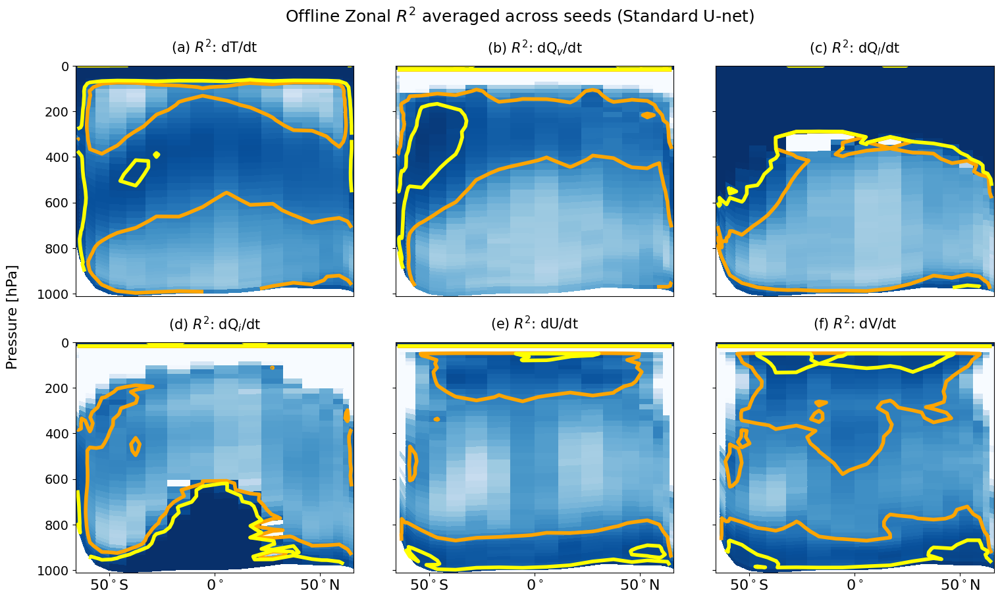

In [17]:
plot_zonal_r2(
    standard_unet_zonal_dTdt_r2,
    standard_unet_zonal_dQvdt_r2,
    standard_unet_zonal_dQldt_r2,
    standard_unet_zonal_dQidt_r2,
    standard_unet_zonal_dUdt_r2,
    standard_unet_zonal_dVdt_r2,
    'Standard U-net')

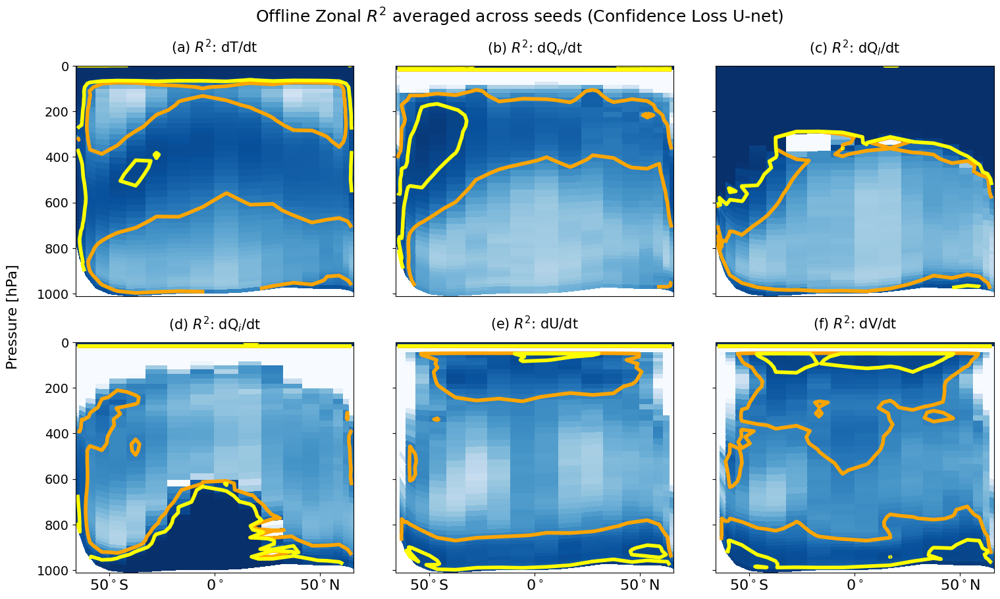

In [18]:
plot_zonal_r2(
    conf_loss_unet_zonal_dTdt_r2,
    conf_loss_unet_zonal_dQvdt_r2,
    conf_loss_unet_zonal_dQldt_r2,
    conf_loss_unet_zonal_dQidt_r2,
    conf_loss_unet_zonal_dUdt_r2,
    conf_loss_unet_zonal_dVdt_r2,
    'Confidence Loss U-net')

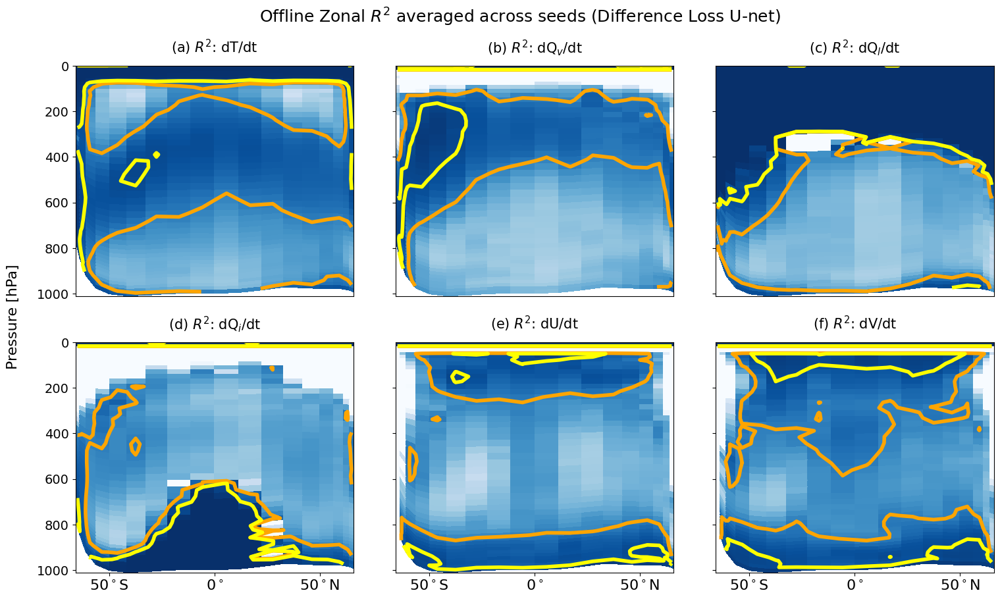

In [19]:
plot_zonal_r2(
    diff_loss_unet_zonal_dTdt_r2,
    diff_loss_unet_zonal_dQvdt_r2,
    diff_loss_unet_zonal_dQldt_r2,
    diff_loss_unet_zonal_dQidt_r2,
    diff_loss_unet_zonal_dUdt_r2,
    diff_loss_unet_zonal_dVdt_r2,
    'Difference Loss U-net')

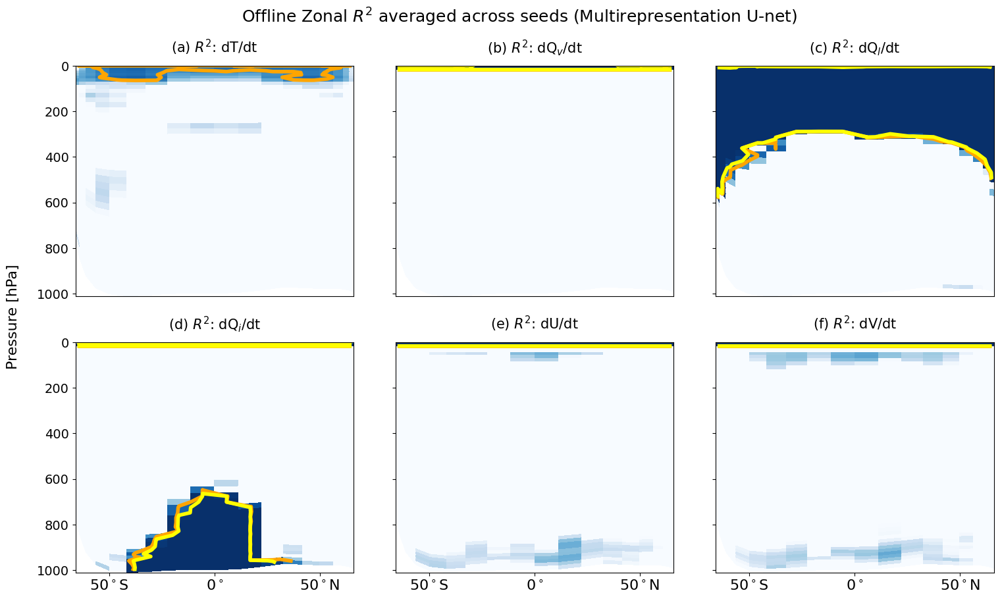

In [20]:
plot_zonal_r2(
    multirep_unet_zonal_dTdt_r2,
    multirep_unet_zonal_dQvdt_r2,
    multirep_unet_zonal_dQldt_r2,
    multirep_unet_zonal_dQidt_r2,
    multirep_unet_zonal_dUdt_r2,
    multirep_unet_zonal_dVdt_r2,
    'Multirepresentation U-net')

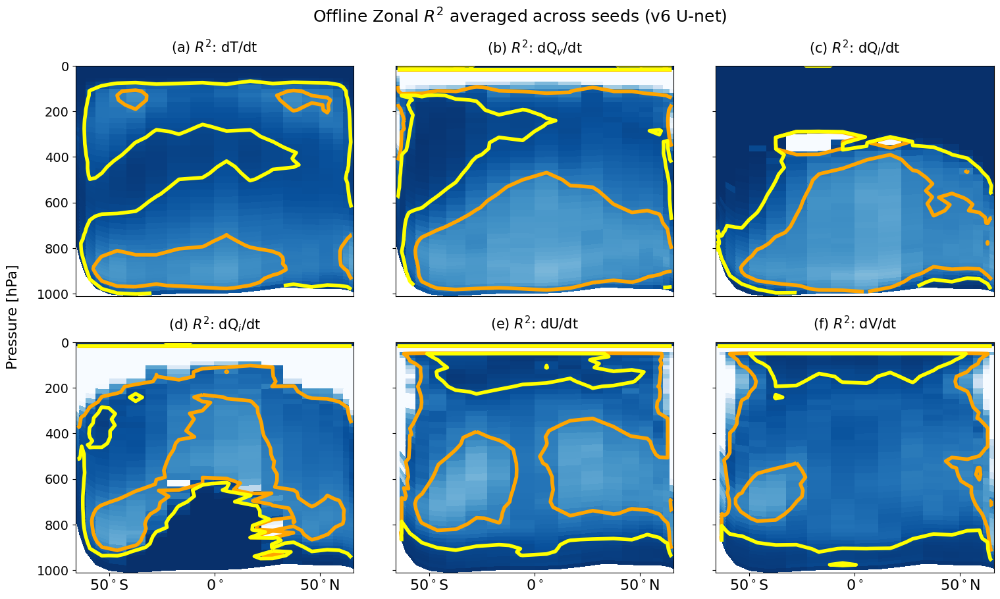

In [21]:
plot_zonal_r2(
    v6_unet_zonal_dTdt_r2,
    v6_unet_zonal_dQvdt_r2,
    v6_unet_zonal_dQldt_r2,
    v6_unet_zonal_dQidt_r2,
    v6_unet_zonal_dUdt_r2,
    v6_unet_zonal_dVdt_r2,
    'v6 U-net')

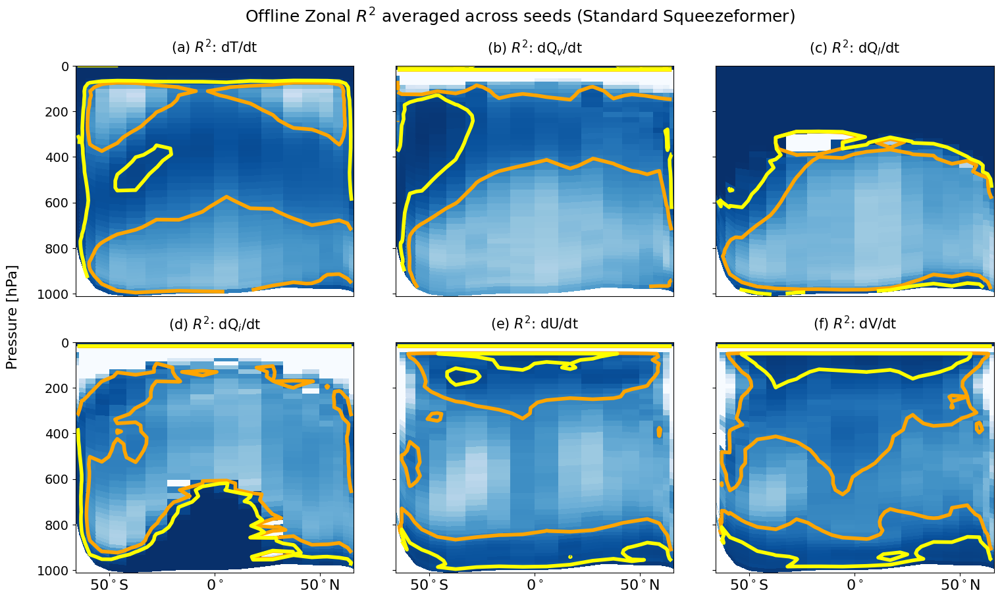

In [22]:
plot_zonal_r2(
    standard_squeezeformer_zonal_dTdt_r2,
    standard_squeezeformer_zonal_dQvdt_r2,
    standard_squeezeformer_zonal_dQldt_r2,
    standard_squeezeformer_zonal_dQidt_r2,
    standard_squeezeformer_zonal_dUdt_r2,
    standard_squeezeformer_zonal_dVdt_r2,
    'Standard Squeezeformer')

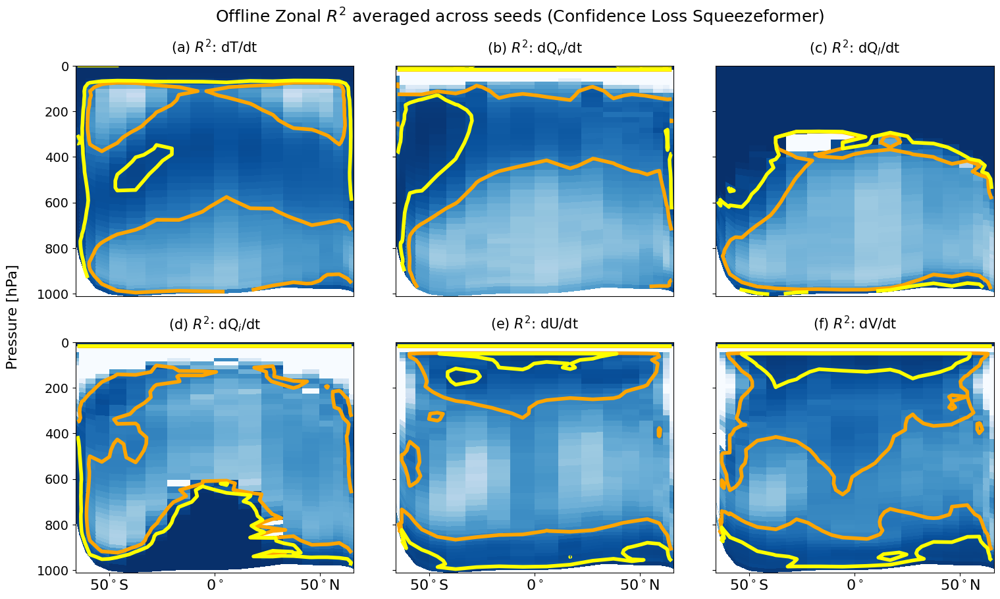

In [23]:
plot_zonal_r2(
    conf_loss_squeezeformer_zonal_dTdt_r2,
    conf_loss_squeezeformer_zonal_dQvdt_r2,
    conf_loss_squeezeformer_zonal_dQldt_r2,
    conf_loss_squeezeformer_zonal_dQidt_r2,
    conf_loss_squeezeformer_zonal_dUdt_r2,
    conf_loss_squeezeformer_zonal_dVdt_r2,
    'Confidence Loss Squeezeformer')

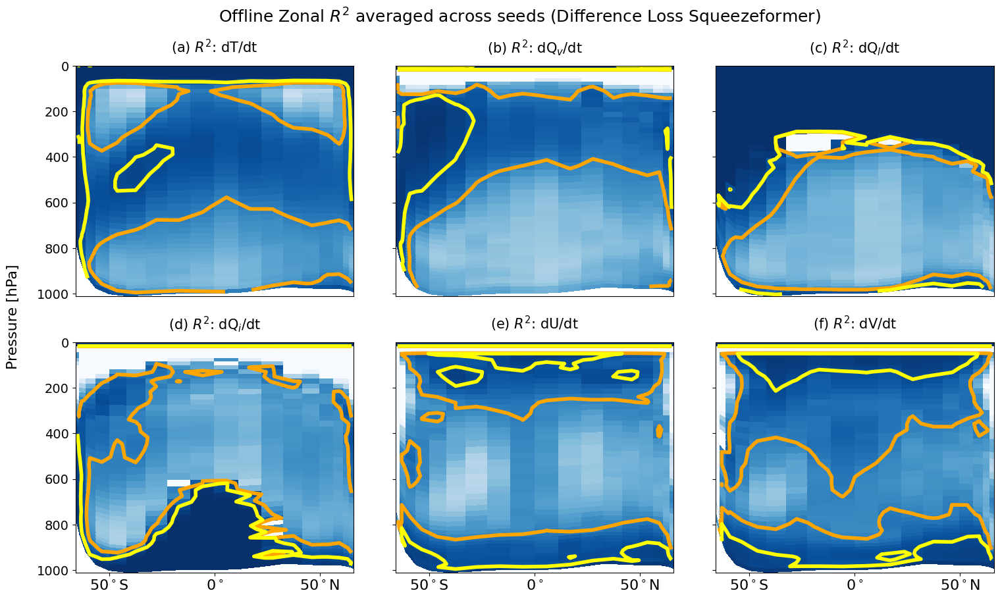

In [24]:
plot_zonal_r2(
    diff_loss_squeezeformer_zonal_dTdt_r2,
    diff_loss_squeezeformer_zonal_dQvdt_r2,
    diff_loss_squeezeformer_zonal_dQldt_r2,
    diff_loss_squeezeformer_zonal_dQidt_r2,
    diff_loss_squeezeformer_zonal_dUdt_r2,
    diff_loss_squeezeformer_zonal_dVdt_r2,
    'Difference Loss Squeezeformer')

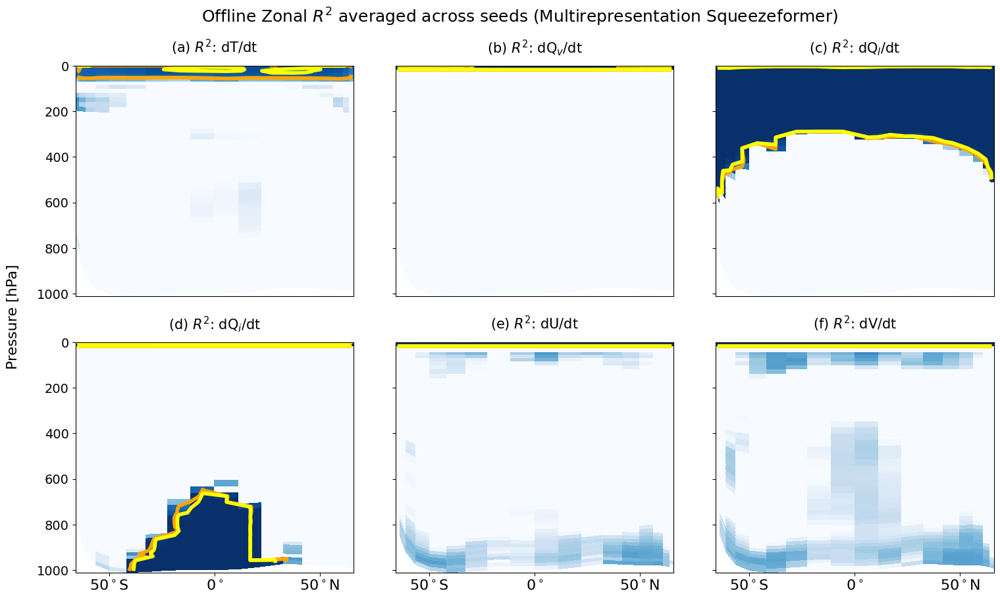

In [25]:
plot_zonal_r2(
    multirep_squeezeformer_zonal_dTdt_r2,
    multirep_squeezeformer_zonal_dQvdt_r2,
    multirep_squeezeformer_zonal_dQldt_r2,
    multirep_squeezeformer_zonal_dQidt_r2,
    multirep_squeezeformer_zonal_dUdt_r2,
    multirep_squeezeformer_zonal_dVdt_r2,
    'Multirepresentation Squeezeformer')

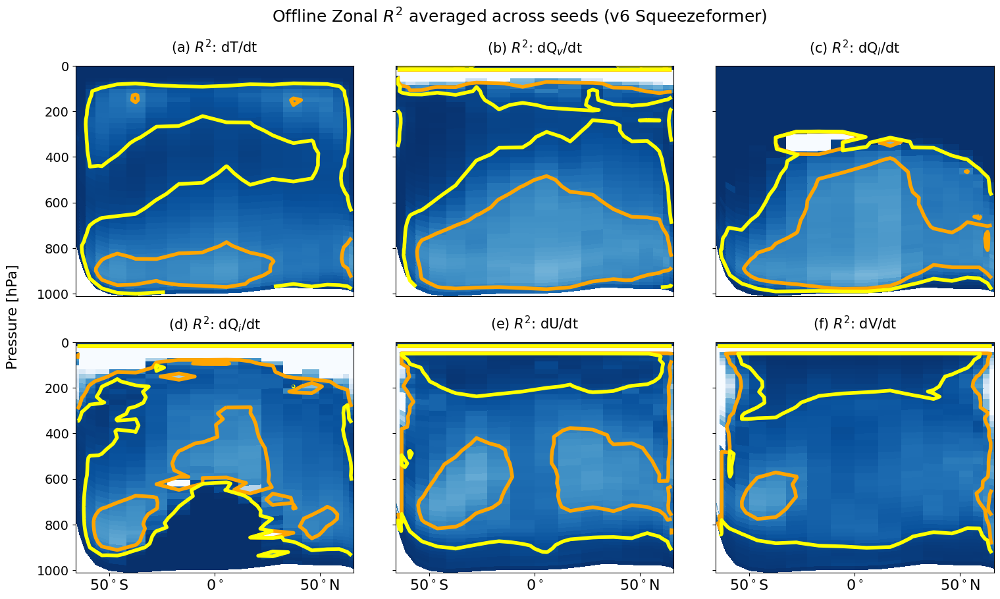

In [26]:
plot_zonal_r2(
    v6_squeezeformer_zonal_dTdt_r2,
    v6_squeezeformer_zonal_dQvdt_r2,
    v6_squeezeformer_zonal_dQldt_r2,
    v6_squeezeformer_zonal_dQidt_r2,
    v6_squeezeformer_zonal_dUdt_r2,
    v6_squeezeformer_zonal_dVdt_r2,
    'v6 Squeezeformer')

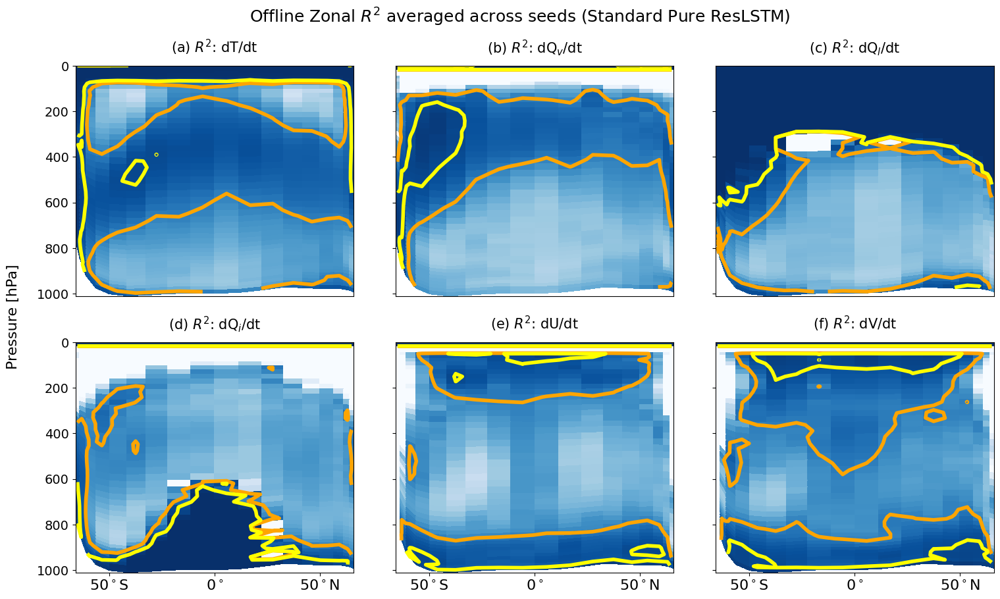

In [27]:
plot_zonal_r2(
    standard_pure_resLSTM_zonal_dTdt_r2,
    standard_pure_resLSTM_zonal_dQvdt_r2,
    standard_pure_resLSTM_zonal_dQldt_r2,
    standard_pure_resLSTM_zonal_dQidt_r2,
    standard_pure_resLSTM_zonal_dUdt_r2,
    standard_pure_resLSTM_zonal_dVdt_r2,
    'Standard Pure ResLSTM')

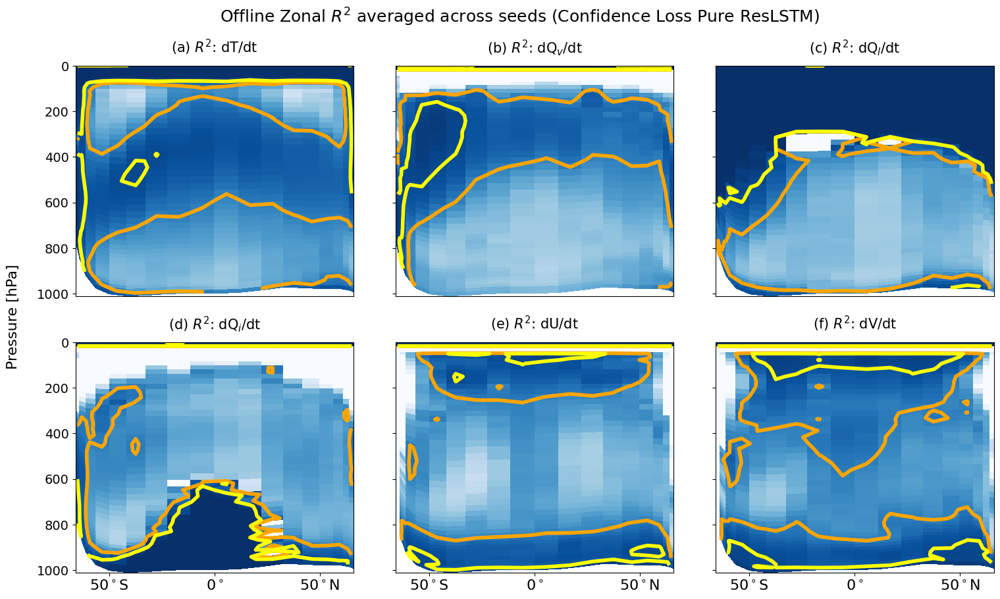

In [28]:
plot_zonal_r2(
    conf_loss_pure_resLSTM_zonal_dTdt_r2,
    conf_loss_pure_resLSTM_zonal_dQvdt_r2,
    conf_loss_pure_resLSTM_zonal_dQldt_r2,
    conf_loss_pure_resLSTM_zonal_dQidt_r2,
    conf_loss_pure_resLSTM_zonal_dUdt_r2,
    conf_loss_pure_resLSTM_zonal_dVdt_r2,
    'Confidence Loss Pure ResLSTM')

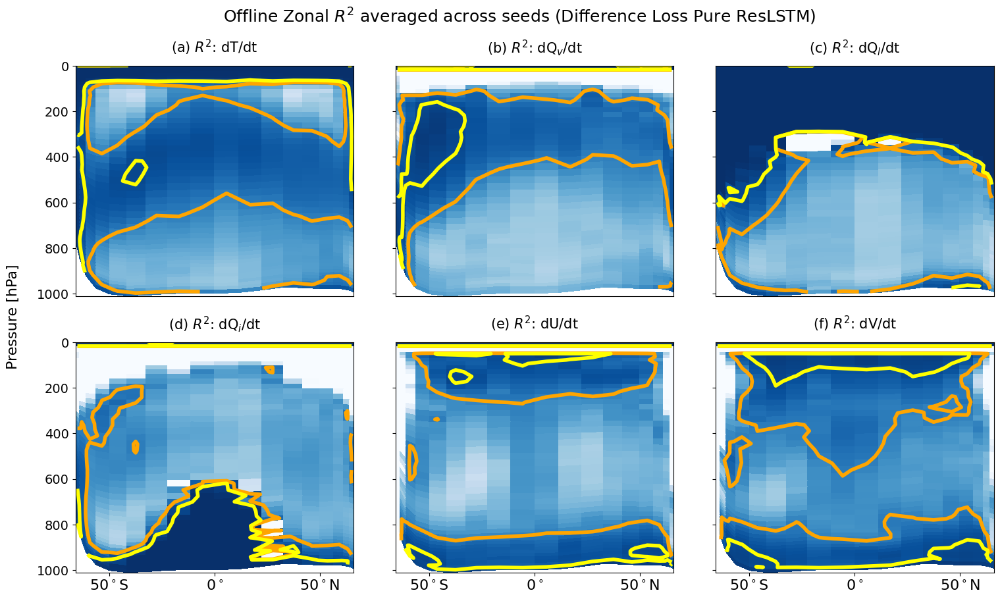

In [29]:
plot_zonal_r2(
    diff_loss_pure_resLSTM_zonal_dTdt_r2,
    diff_loss_pure_resLSTM_zonal_dQvdt_r2,
    diff_loss_pure_resLSTM_zonal_dQldt_r2,
    diff_loss_pure_resLSTM_zonal_dQidt_r2,
    diff_loss_pure_resLSTM_zonal_dUdt_r2,
    diff_loss_pure_resLSTM_zonal_dVdt_r2,
    'Difference Loss Pure ResLSTM')

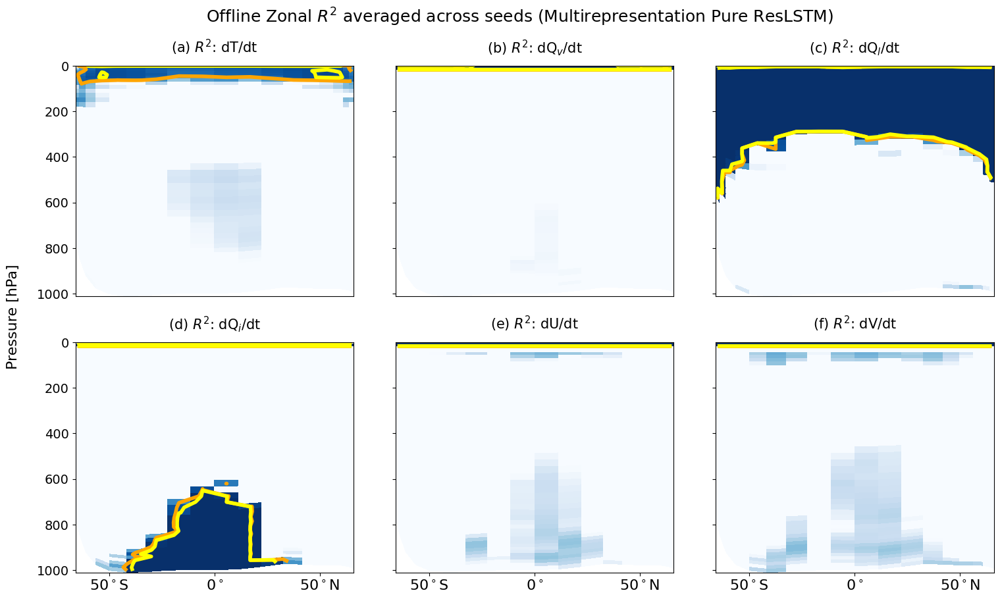

In [30]:
plot_zonal_r2(
    multirep_pure_resLSTM_zonal_dTdt_r2,
    multirep_pure_resLSTM_zonal_dQvdt_r2,
    multirep_pure_resLSTM_zonal_dQldt_r2,
    multirep_pure_resLSTM_zonal_dQidt_r2,
    multirep_pure_resLSTM_zonal_dUdt_r2,
    multirep_pure_resLSTM_zonal_dVdt_r2,
    'Multirepresentation Pure ResLSTM')

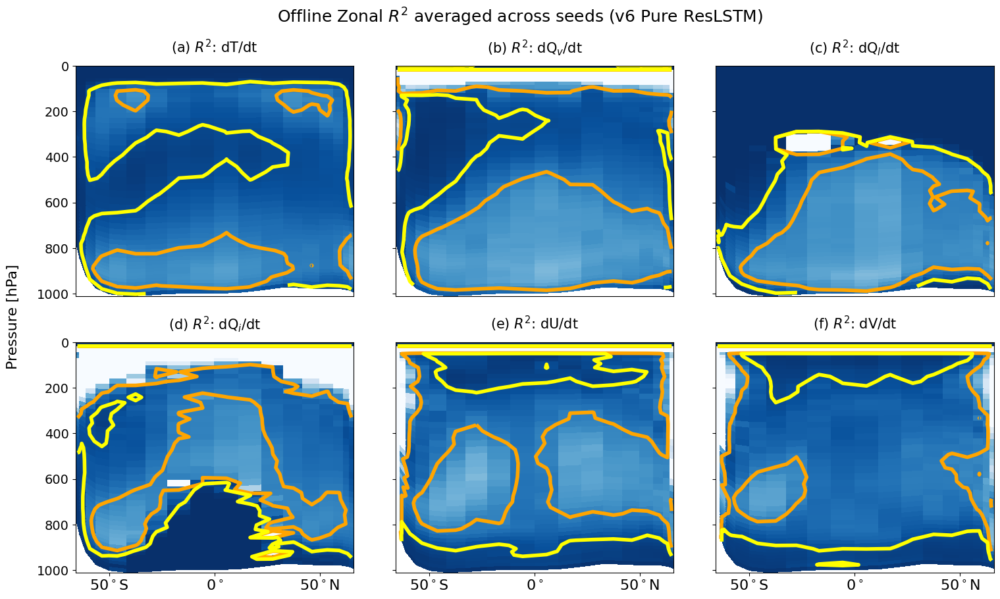

In [31]:
plot_zonal_r2(
    v6_pure_resLSTM_zonal_dTdt_r2,
    v6_pure_resLSTM_zonal_dQvdt_r2,
    v6_pure_resLSTM_zonal_dQldt_r2,
    v6_pure_resLSTM_zonal_dQidt_r2,
    v6_pure_resLSTM_zonal_dUdt_r2,
    v6_pure_resLSTM_zonal_dVdt_r2,
    'v6 Pure ResLSTM')

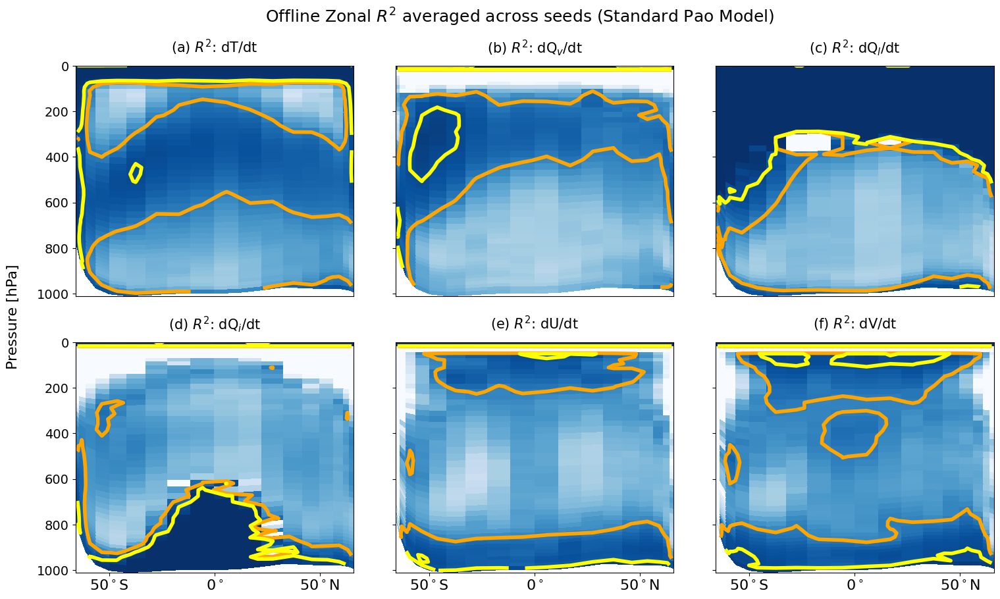

In [32]:
plot_zonal_r2(
    standard_pao_model_zonal_dTdt_r2,
    standard_pao_model_zonal_dQvdt_r2,
    standard_pao_model_zonal_dQldt_r2,
    standard_pao_model_zonal_dQidt_r2,
    standard_pao_model_zonal_dUdt_r2,
    standard_pao_model_zonal_dVdt_r2,
    'Standard Pao Model')

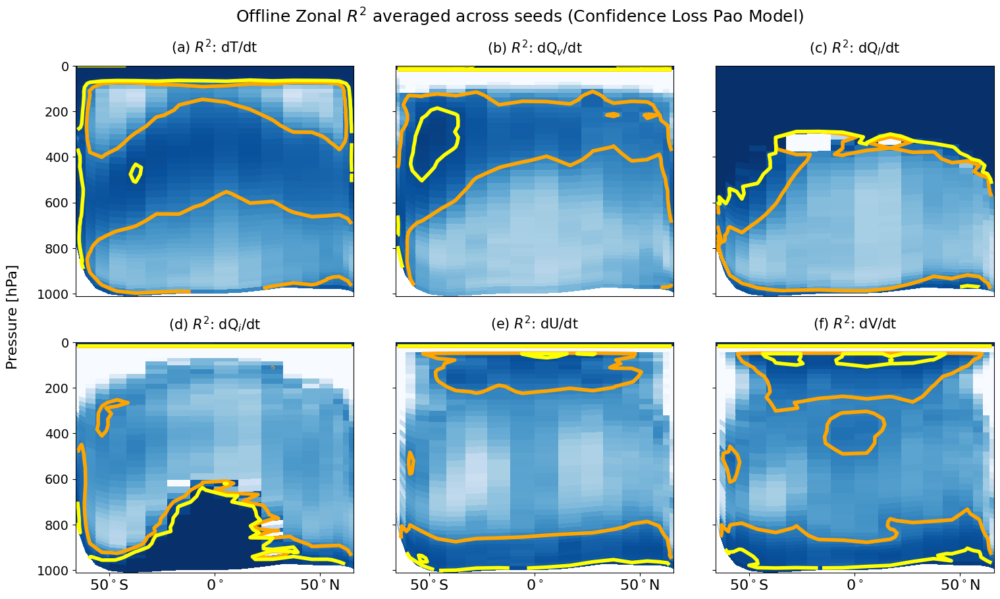

In [33]:
plot_zonal_r2(
    conf_loss_pao_model_zonal_dTdt_r2,
    conf_loss_pao_model_zonal_dQvdt_r2,
    conf_loss_pao_model_zonal_dQldt_r2,
    conf_loss_pao_model_zonal_dQidt_r2,
    conf_loss_pao_model_zonal_dUdt_r2,
    conf_loss_pao_model_zonal_dVdt_r2,
    'Confidence Loss Pao Model')

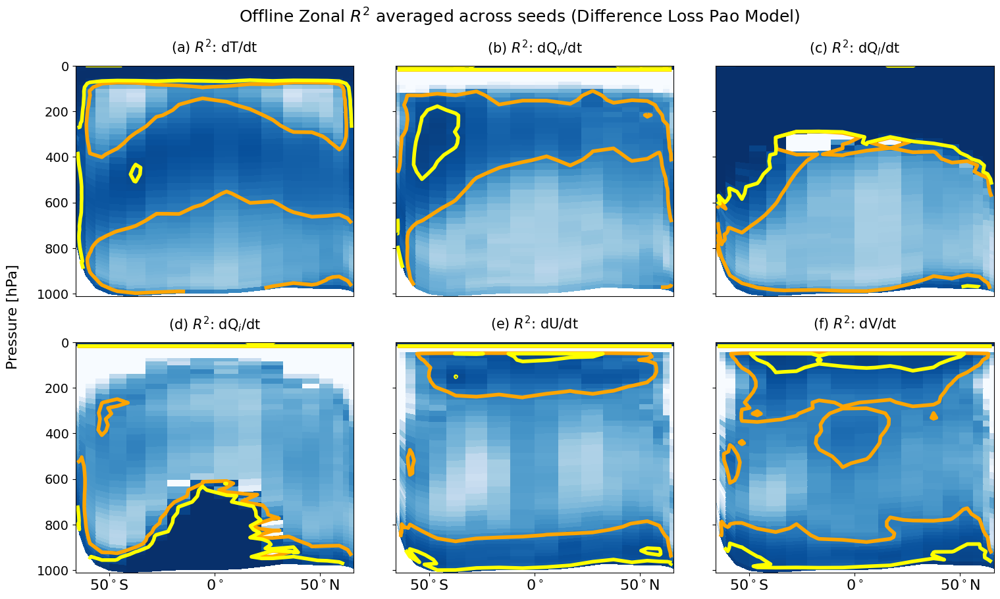

In [34]:
plot_zonal_r2(
    diff_loss_pao_model_zonal_dTdt_r2,
    diff_loss_pao_model_zonal_dQvdt_r2,
    diff_loss_pao_model_zonal_dQldt_r2,
    diff_loss_pao_model_zonal_dQidt_r2,
    diff_loss_pao_model_zonal_dUdt_r2,
    diff_loss_pao_model_zonal_dVdt_r2,
    'Difference Loss Pao Model')

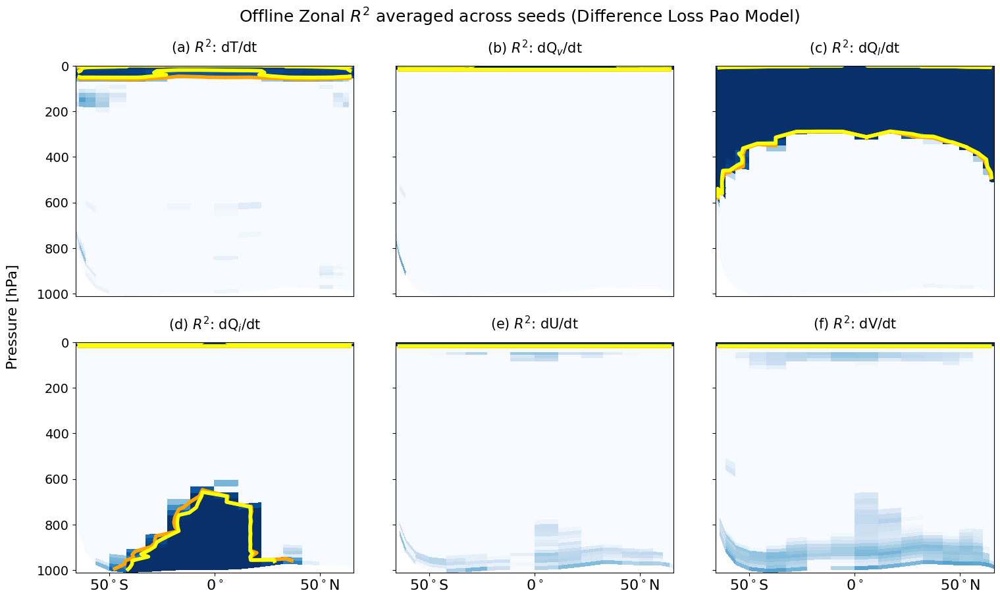

In [35]:
plot_zonal_r2(
    multirep_pao_model_zonal_dTdt_r2,
    multirep_pao_model_zonal_dQvdt_r2,
    multirep_pao_model_zonal_dQldt_r2,
    multirep_pao_model_zonal_dQidt_r2,
    multirep_pao_model_zonal_dUdt_r2,
    multirep_pao_model_zonal_dVdt_r2,
    'Difference Loss Pao Model')

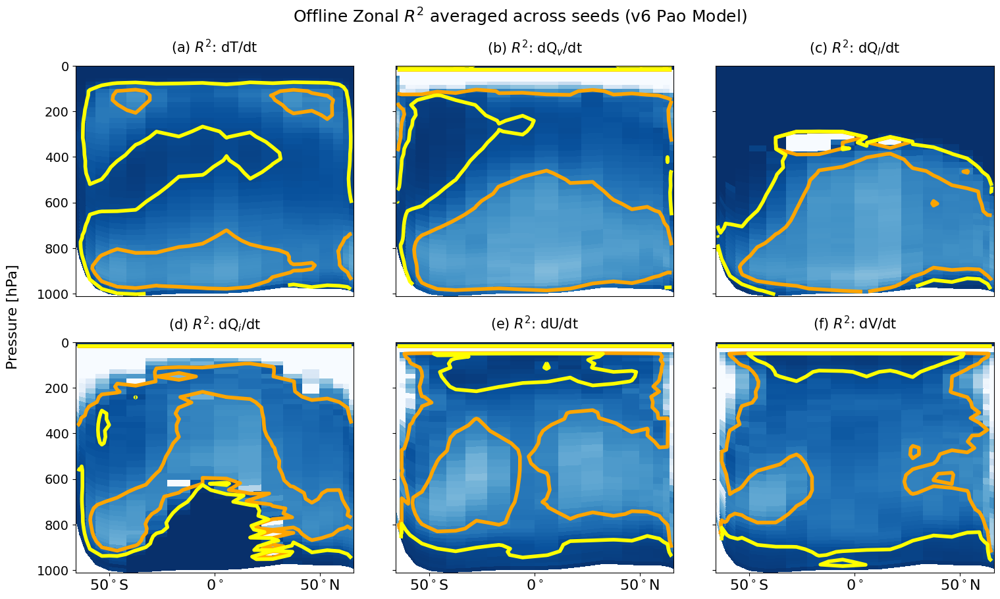

In [36]:
plot_zonal_r2(
    v6_pao_model_zonal_dTdt_r2,
    v6_pao_model_zonal_dQvdt_r2,
    v6_pao_model_zonal_dQldt_r2,
    v6_pao_model_zonal_dQidt_r2,
    v6_pao_model_zonal_dUdt_r2,
    v6_pao_model_zonal_dVdt_r2,
    'v6 Pao Model')

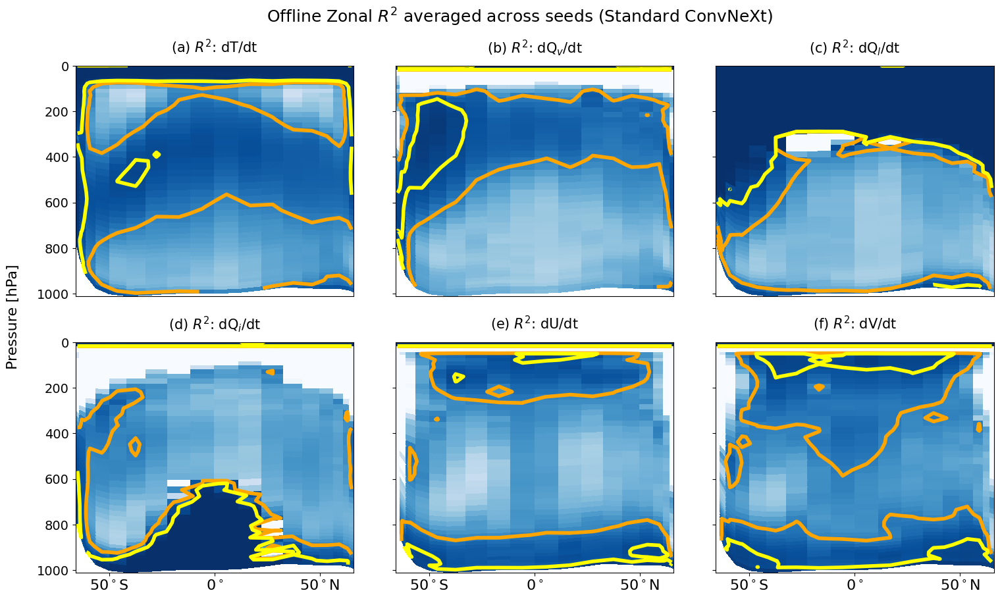

In [37]:
plot_zonal_r2(
    standard_convnext_zonal_dTdt_r2,
    standard_convnext_zonal_dQvdt_r2,
    standard_convnext_zonal_dQldt_r2,
    standard_convnext_zonal_dQidt_r2,
    standard_convnext_zonal_dUdt_r2,
    standard_convnext_zonal_dVdt_r2,
    'Standard ConvNeXt')

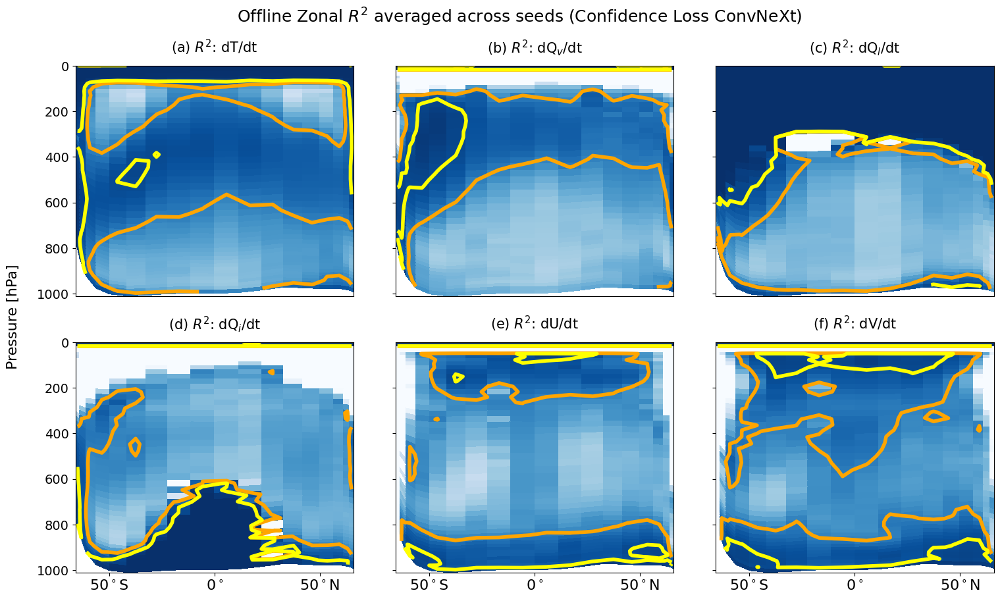

In [38]:
plot_zonal_r2(
    conf_loss_convnext_zonal_dTdt_r2,
    conf_loss_convnext_zonal_dQvdt_r2,
    conf_loss_convnext_zonal_dQldt_r2,
    conf_loss_convnext_zonal_dQidt_r2,
    conf_loss_convnext_zonal_dUdt_r2,
    conf_loss_convnext_zonal_dVdt_r2,
    'Confidence Loss ConvNeXt')

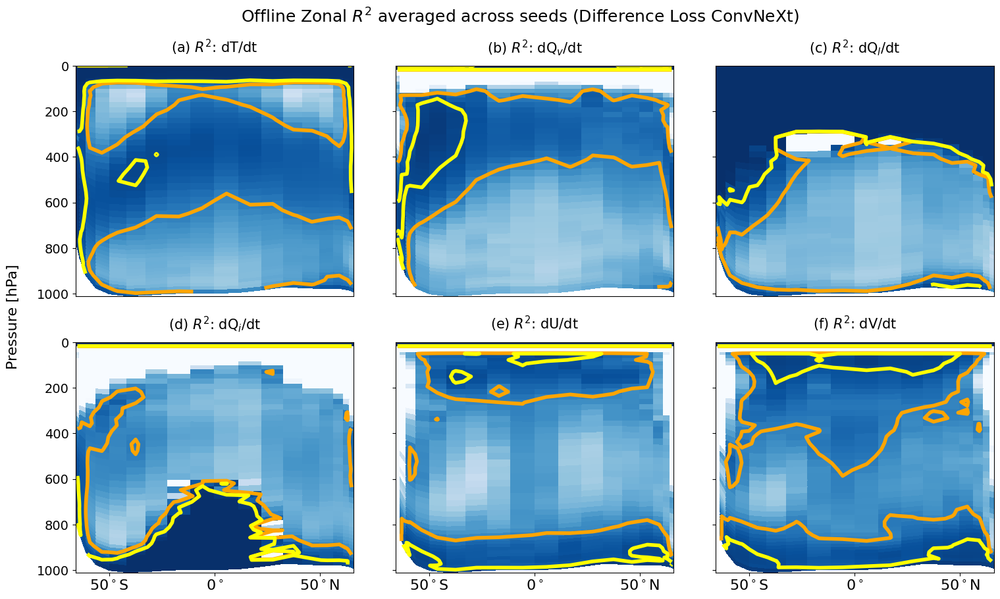

In [39]:
plot_zonal_r2(
    diff_loss_convnext_zonal_dTdt_r2,
    diff_loss_convnext_zonal_dQvdt_r2,
    diff_loss_convnext_zonal_dQldt_r2,
    diff_loss_convnext_zonal_dQidt_r2,
    diff_loss_convnext_zonal_dUdt_r2,
    diff_loss_convnext_zonal_dVdt_r2,
    'Difference Loss ConvNeXt')

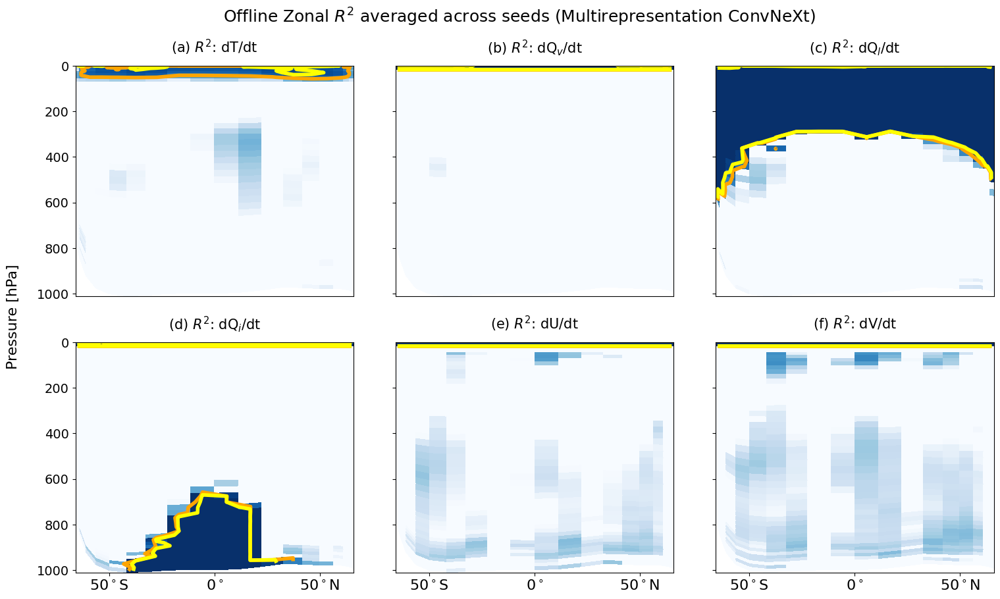

In [40]:
plot_zonal_r2(
    multirep_convnext_zonal_dTdt_r2,
    multirep_convnext_zonal_dQvdt_r2,
    multirep_convnext_zonal_dQldt_r2,
    multirep_convnext_zonal_dQidt_r2,
    multirep_convnext_zonal_dUdt_r2,
    multirep_convnext_zonal_dVdt_r2,
    'Multirepresentation ConvNeXt')

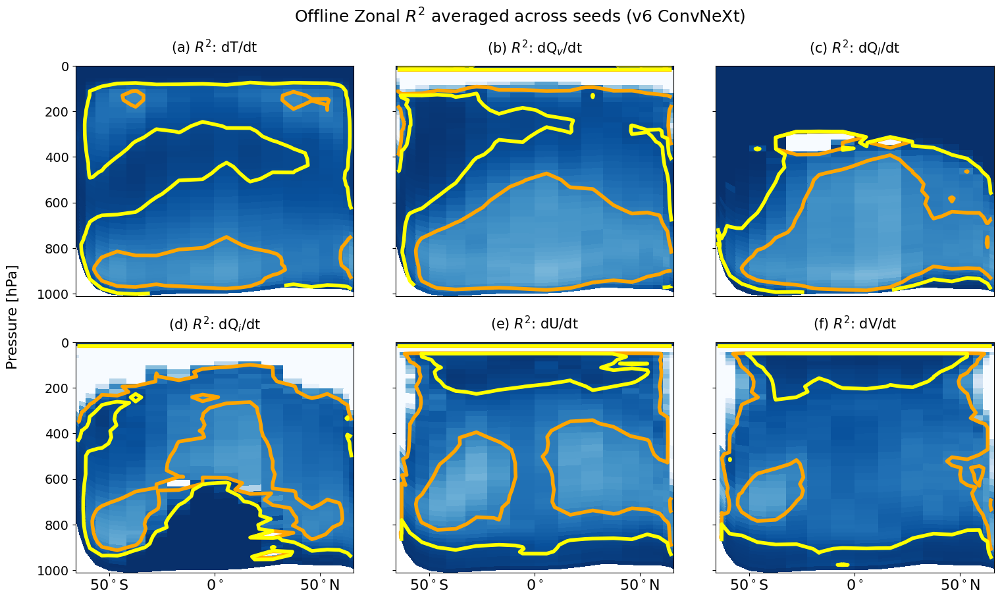

In [41]:
plot_zonal_r2(
    v6_convnext_zonal_dTdt_r2,
    v6_convnext_zonal_dQvdt_r2,
    v6_convnext_zonal_dQldt_r2,
    v6_convnext_zonal_dQidt_r2,
    v6_convnext_zonal_dUdt_r2,
    v6_convnext_zonal_dVdt_r2,
    'v6 ConvNeXt')

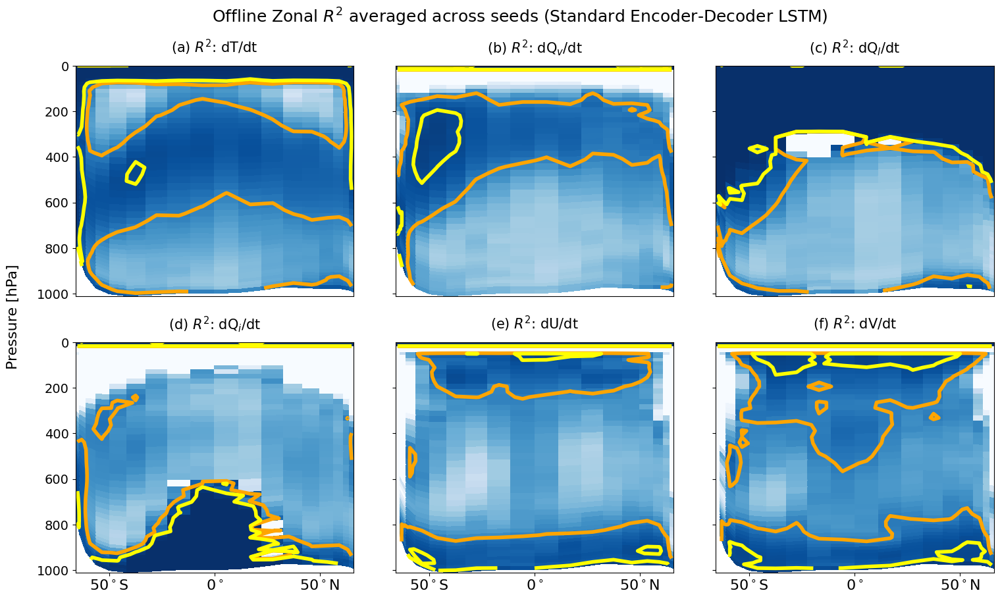

In [42]:
plot_zonal_r2(
    standard_encdec_lstm_zonal_dTdt_r2,
    standard_encdec_lstm_zonal_dQvdt_r2,
    standard_encdec_lstm_zonal_dQldt_r2,
    standard_encdec_lstm_zonal_dQidt_r2,
    standard_encdec_lstm_zonal_dUdt_r2,
    standard_encdec_lstm_zonal_dVdt_r2,
    'Standard Encoder-Decoder LSTM')

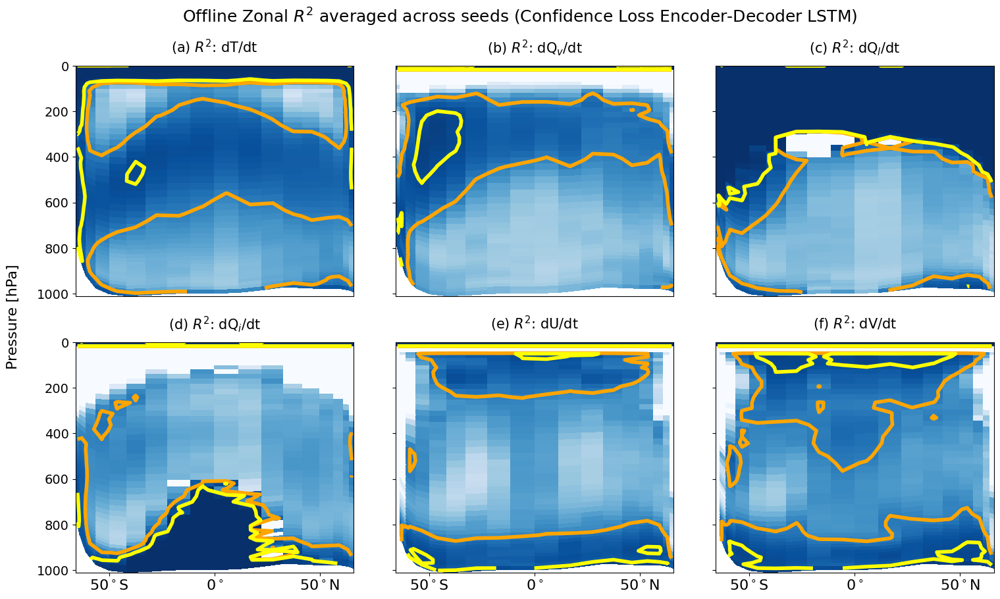

In [43]:
plot_zonal_r2(
    conf_loss_encdec_lstm_zonal_dTdt_r2,
    conf_loss_encdec_lstm_zonal_dQvdt_r2,
    conf_loss_encdec_lstm_zonal_dQldt_r2,
    conf_loss_encdec_lstm_zonal_dQidt_r2,
    conf_loss_encdec_lstm_zonal_dUdt_r2,
    conf_loss_encdec_lstm_zonal_dVdt_r2,
    'Confidence Loss Encoder-Decoder LSTM')

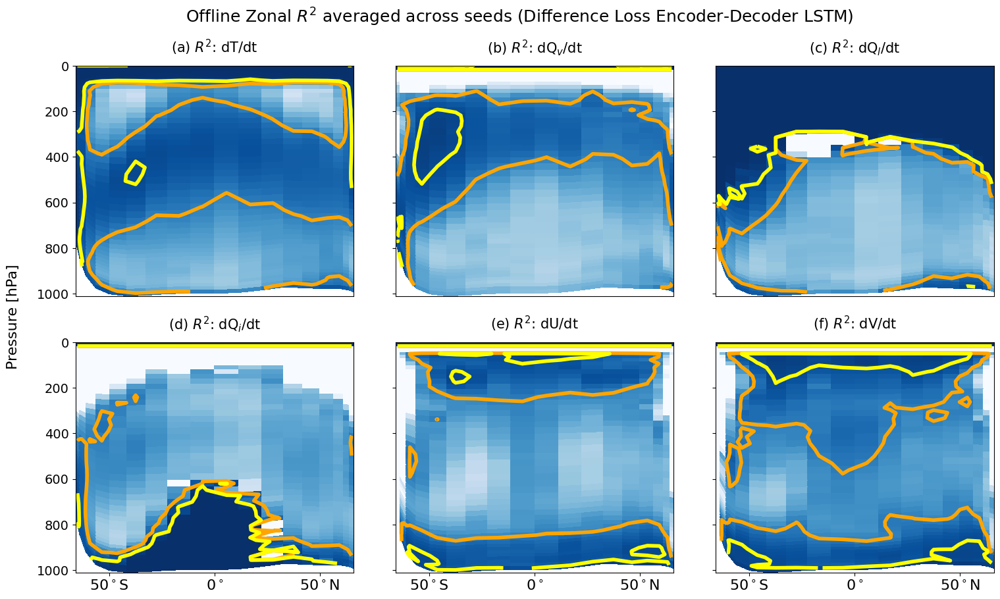

In [45]:
plot_zonal_r2(
    diff_loss_encdec_lstm_zonal_dTdt_r2,
    diff_loss_encdec_lstm_zonal_dQvdt_r2,
    diff_loss_encdec_lstm_zonal_dQldt_r2,
    diff_loss_encdec_lstm_zonal_dQidt_r2,
    diff_loss_encdec_lstm_zonal_dUdt_r2,
    diff_loss_encdec_lstm_zonal_dVdt_r2,
    'Difference Loss Encoder-Decoder LSTM')

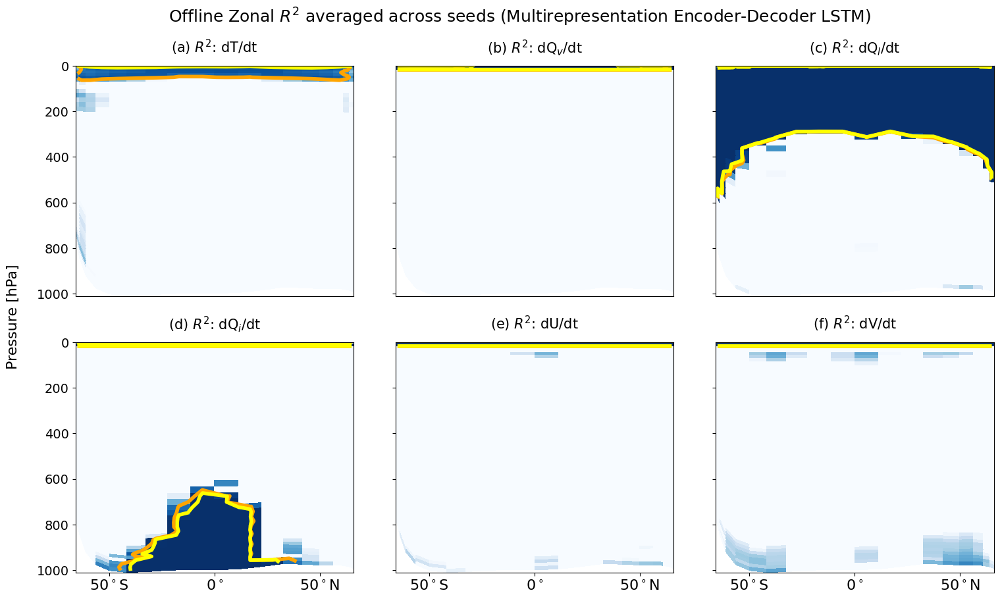

In [46]:
plot_zonal_r2(
    multirep_encdec_lstm_zonal_dTdt_r2,
    multirep_encdec_lstm_zonal_dQvdt_r2,
    multirep_encdec_lstm_zonal_dQldt_r2,
    multirep_encdec_lstm_zonal_dQidt_r2,
    multirep_encdec_lstm_zonal_dUdt_r2,
    multirep_encdec_lstm_zonal_dVdt_r2,
    'Multirepresentation Encoder-Decoder LSTM')

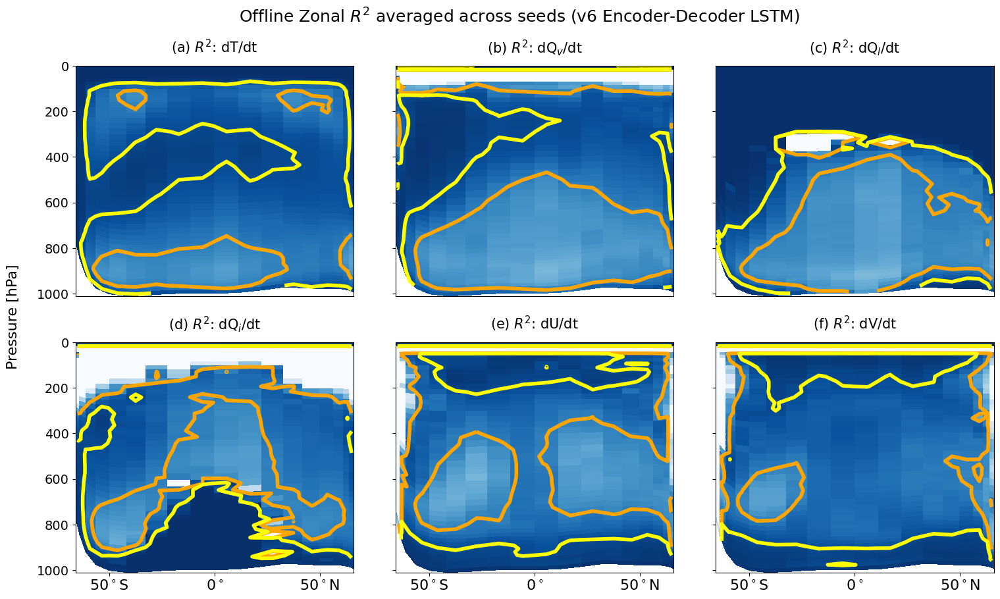

In [47]:
plot_zonal_r2(
    v6_encdec_lstm_zonal_dTdt_r2,
    v6_encdec_lstm_zonal_dQvdt_r2,
    v6_encdec_lstm_zonal_dQldt_r2,
    v6_encdec_lstm_zonal_dQidt_r2,
    v6_encdec_lstm_zonal_dUdt_r2,
    v6_encdec_lstm_zonal_dVdt_r2,
    'v6 Encoder-Decoder LSTM')

In [48]:
lat_bin_mids

array([-85, -75, -65, -55, -45, -35, -25, -15,  -5,   5,  15,  25,  35,
        45,  55,  65,  75,  85])

In [28]:
%matplotlib inline

In [ ]:
def plot_zonal_diff(data,
                    zonal_heating_1_r2, 
                    zonal_heating_2_r2, 
                    zonal_moistening_1_r2, 
                    zonal_moistening_2_r2, 
                    title):
    avg_zonal_heating_2_r2 = np.mean(np.stack([zonal_heating_2_r2[seed] for seed in seeds]), axis = 0)
    avg_zonal_heating_1_r2 = np.mean(np.stack([zonal_heating_1_r2[seed] for seed in seeds]), axis = 0)
    avg_zonal_moistening_2_r2 = np.mean(np.stack([zonal_moistening_2_r2[seed] for seed in seeds]), axis = 0)
    avg_zonal_moistening_1_r2 = np.mean(np.stack([zonal_moistening_1_r2[seed] for seed in seeds]), axis = 0)
    zonal_heating_diff = data.zonal_bin_weight_3d(avg_zonal_heating_2_r2)[0] - data.zonal_bin_weight_3d(avg_zonal_heating_1_r2)[0]
    zonal_moistening_diff = data.zonal_bin_weight_3d(avg_zonal_moistening_2_r2)[0] - data.zonal_bin_weight_3d(avg_zonal_moistening_1_r2)[0]
    fig, ax = plt.subplots(1, 2, figsize = (12, 5))
    y = np.arange(60)
    X, Y = np.meshgrid(np.sin(np.pi*lat_bin_mids/180), y)
    Y = (1/100) * np.mean(pressures_binned, axis = 0).T
    
    contour_plot_heating = ax[0].pcolor(X, Y, zonal_heating_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    ax[0].contour(X, Y, zonal_heating_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[0].contour(X, Y, zonal_heating_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[0].set_ylim(ax[0].get_ylim()[::-1])
    ax[0].set_title('zonal heating r2', fontsize = 14)
    ax[0].xaxis.set_ticks([np.sin(-50/180*np.pi), 0, np.sin(50/180*np.pi)])
    ax[0].xaxis.set_ticklabels(['50$^\circ$S', '0$^\circ$', '50$^\circ$N'], fontsize = 16)
    ax[0].xaxis.set_tick_params(width = 2)
    contour_plot = ax[1].pcolor(X, Y, zonal_moistening_diff.T, cmap='bwr', vmin = -.2, vmax = .2) # pcolormesh
    ax[1].contour(X, Y, zonal_moistening_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[1].contour(X, Y, zonal_moistening_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[1].set_ylim(ax[1].get_ylim()[::-1])
    ax[1].set_title('zonal moistening r2', fontsize = 14)
    ax[1].xaxis.set_ticks([np.sin(-50/180*np.pi), 0, np.sin(50/180*np.pi)])
    ax[1].xaxis.set_ticklabels(['50$^\circ$S', '0$^\circ$', '50$^\circ$N'], fontsize = 16)
    ax[1].xaxis.set_tick_params(width = 2)
    # ax[0].set_yticks([])
    # ax[1].set_yticks([])
    ax[0].set_ylabel("Pressure [hPa]", fontsize = 22)
    ax[0].yaxis.set_tick_params(labelsize = 14)
    ax[0].yaxis.set_ticks([1000,800,600,400,200,0])
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.82, 0.12, 0.02, 0.76])
    cb = fig.colorbar(contour_plot, cax=cbar_ax)
    fig.suptitle(title, fontsize = 16, x=0.46, y=0.98)

In [ ]:
v6_unet_zonal_heating_r2['seed_7'][None,:,:].shape

In [ ]:
data_v6.zonal_bin_weight_3d(v6_unet_zonal_heating_r2['seed_7'][None,:,:])[0].shape

In [ ]:
def get_coeff(target, pred):
    rss = np.sum((pred - target)**2, axis = 0)
    tss = np.sum((target - np.mean(target, axis = 0)[None,:,:])**2, axis = 0)
    coeff = 1 - rss/tss
    mask = tss == 0
    coeff[mask] = 1.0 * (rss[mask] == 0) 
    return coeff

print('Calculating zonal heating standard r2')
standard_unet_zonal_heating_r2 = {seed: get_coeff(actual_target[:,:,:60], standard_preds['unet'](seed)[:,:,:60]) for seed in seeds}
standard_squeezeformer_zonal_heating_r2 = {seed: get_coeff(actual_target[:,:,:60], standard_preds['squeezeformer'](seed)[:,:,:60]) for seed in seeds}
standard_pure_resLSTM_zonal_heating_r2 = {seed: get_coeff(actual_target[:,:,:60], standard_preds['pure_resLSTM'](seed)[:,:,:60]) for seed in seeds}
standard_pao_model_zonal_heating_r2 = {seed: get_coeff(actual_target[:,:,:60], standard_preds['pao_model'](seed)[:,:,:60]) for seed in seeds}
standard_convnext_zonal_heating_r2 = {seed: get_coeff(actual_target[:,:,:60], standard_preds['convnext'](seed)[:,:,:60]) for seed in seeds}
standard_encdec_lstm_zonal_heating_r2 = {seed: get_coeff(actual_target[:,:,:60], standard_preds['encdec_lstm'](seed)[:,:,:60]) for seed in seeds}

for model_name in model_paths.keys():
    zonal_heating_r2[model_name] = data.zonal_bin_weight_3d(get_coeff(reshaped_target[:,:,:60], \
                                                                      model_preds[model_name][:,:,:60]))[0]
    zonal_moistening_r2[model_name] = data.zonal_bin_weight_3d(get_coeff(reshaped_target[:,:,60:120], \
                                                                          model_preds[model_name][:,:,60:120]))[0]

In [ ]:
plt.plot(np.arange(368), standard_unet_r2['seed_1024'][0], color = 'blue')
plt.plot(np.arange(368), conf_loss_unet_r2['seed_1024'][0], color = 'red')

In [ ]:
plt.plot(np.arange(368), standard_squeezeformer_r2['seed_1024'][0], color = 'blue')
plt.plot(np.arange(368), conf_loss_squeezeformer_r2['seed_1024'][0], color = 'red')

In [ ]:
plt.figure(figsize=(10, 6))
for model_name in model_paths.keys():
    r2_scores[model_name], r2_scores_capped[model_name] = show_r2(reshaped_target, model_preds[model_name])
    label_text = f'{model_labels[model_name]}: {np.mean(r2_scores[model_name]):.3g}' 
    plt.plot(np.arange(data.target_feature_len), r2_scores[model_name], color = model_colors[model_name], label=f"{label_text}")
    
plt.legend()
plt.xlabel('Feature Index')
plt.ylabel(r'$R^2$ Score')
plt.title(r'$R^2$ Score Comparison')

feature_indices = [0, 60, 120, 180, 240, 300, 308]
feature_labels = ['dT', 'dQv', 'dQn (liq+ice)', 'dU', 'dV', 'scalars', '']
plt.xticks(ticks=feature_indices, labels=feature_labels)
plt.ylim(0, 1)
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.savefig(preds_path + 'r2_lines.png')
plt.clf()

In [ ]:
def get_coeff(target, pred):
    rss = np.sum((pred - target)**2, axis = 0)
    tss = np.sum((target - np.mean(target, axis = 0)[None,:,:])**2, axis = 0)
    coeff = 1 - rss/tss
    mask = tss == 0
    coeff[mask] = 1.0 * (rss[mask] == 0) 
    return coeff

for model_name in model_paths.keys():
    zonal_heating_r2[model_name] = data.zonal_bin_weight_3d(get_coeff(reshaped_target[:,:,:60], \
                                                                      model_preds[model_name][:,:,:60]))[0]
    zonal_moistening_r2[model_name] = data.zonal_bin_weight_3d(get_coeff(reshaped_target[:,:,60:120], \
                                                                          model_preds[model_name][:,:,60:120]))[0]

In [ ]:
def show_r2(target, preds):
    assert target.shape == preds.shape, f'target shape {target.shape} does not match preds shape {preds.shape}'
    new_shape = (np.prod(target.shape[:-1]), target.shape[-1])
    target_flattened = target.reshape(new_shape)
    preds_flattened = preds.reshape(new_shape)
    r2_scores = np.array([r2_score(target_flattened[:, i], preds_flattened[:, i]) for i in range(368)])
    r2_scores_capped = r2_scores.copy()
    r2_scores_capped[r2_scores_capped < 0] = 0
    return r2_scores, r2_scores_capped

r2_scores, r2_scores_capped = show_r2(actual_target, standard_preds['unet']('seed_7'))

In [ ]:
standard_preds = {
    'unet': lambda seed_key: load_seed_data(standard_save_path, 'standard_unet_preds.npz', seed_key)
}
r2_scores_A, r2_scores_capped_A = show_r2(actual_target, standard_preds['unet']('seed_7'))

In [ ]:
np.array_equal(r2_scores, r2_scores_A)

In [ ]:
np.array_equal(r2_scores_capped, r2_scores_capped_A)

In [ ]:
def show_r2(target, preds):
    assert target.shape == preds.shape, f'target shape {target.shape} does not match preds shape {preds.shape}'
    new_shape = (np.prod(target.shape[:-1]), target.shape[-1])
    target_flattened = target.reshape(new_shape)
    preds_flattened = preds.reshape(new_shape)
    r2_scores = np.array([r2_score(target_flattened[:, i], preds_flattened[:, i]) for i in range(368)])
    r2_scores_capped = r2_scores.copy()
    r2_scores_capped[r2_scores_capped < 0] = 0
    return r2_scores, r2_scores_capped

plt.figure(figsize=(10, 6))
for model_name in model_paths.keys():
    r2_scores[model_name], r2_scores_capped[model_name] = show_r2(reshaped_target, model_preds[model_name])
    label_text = f'{model_labels[model_name]}: {np.mean(r2_scores[model_name]):.3g}' 
    plt.plot(np.arange(data.target_feature_len), r2_scores[model_name], color = model_colors[model_name], label=f"{label_text}")
    
plt.legend()
plt.xlabel('Feature Index')
plt.ylabel(r'$R^2$ Score')
plt.title(r'$R^2$ Score Comparison')

feature_indices = [0, 60, 120, 180, 240, 300, 308]
feature_labels = ['dT', 'dQv', 'dQn (liq+ice)', 'dU', 'dV', 'scalars', '']
plt.xticks(ticks=feature_indices, labels=feature_labels)
plt.ylim(0, 1)
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.savefig(preds_path + 'r2_lines.png')
plt.clf()


In [ ]:
# plot zonal diff
def plot_zonal_avg_diff(data, start_idx, end_idx, var_str):

    print('Calculating standard zonal r2')
    standard_unet_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], standard_preds['unet'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    standard_squeezeformer_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], standard_preds['squeezeformer'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    standard_pure_resLSTM_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], standard_preds['pure_resLSTM'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    standard_pao_model_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], standard_preds['pao_model'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    standard_convnext_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], standard_preds['convnext'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    standard_encdec_lstm_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], standard_preds['encdec_lstm'](seed)[:,:,start_idx:end_idx]) for seed in seeds}

    print('Calculating conf loss zonal r2')
    conf_loss_unet_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], conf_loss_preds['unet'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    conf_loss_squeezeformer_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], conf_loss_preds['squeezeformer'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    conf_loss_pure_resLSTM_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], conf_loss_preds['pure_resLSTM'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    conf_loss_pao_model_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], conf_loss_preds['pao_model'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    conf_loss_convnext_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], conf_loss_preds['convnext'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    conf_loss_encdec_lstm_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], conf_loss_preds['encdec_lstm'](seed)[:,:,start_idx:end_idx]) for seed in seeds}

    print('Calculating diff loss zonal r2')
    diff_loss_unet_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], diff_loss_preds['unet'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    diff_loss_squeezeformer_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], diff_loss_preds['squeezeformer'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    diff_loss_pure_resLSTM_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], diff_loss_preds['pure_resLSTM'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    diff_loss_pao_model_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], diff_loss_preds['pao_model'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    diff_loss_convnext_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], diff_loss_preds['convnext'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    diff_loss_encdec_lstm_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], diff_loss_preds['encdec_lstm'](seed)[:,:,start_idx:end_idx]) for seed in seeds}

    print('Calculating multirep zonal r2')
    multirep_unet_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], multirep_preds['unet'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    multirep_squeezeformer_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], multirep_preds['squeezeformer'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    multirep_pure_resLSTM_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], multirep_preds['pure_resLSTM'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    multirep_pao_model_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], multirep_preds['pao_model'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    multirep_convnext_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], multirep_preds['convnext'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    multirep_encdec_lstm_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], multirep_preds['encdec_lstm'](seed)[:,:,start_idx:end_idx]) for seed in seeds}

    print('Calculating v6 zonal r2')
    v6_unet_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], v6_preds['unet'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    v6_squeezeformer_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], v6_preds['squeezeformer'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    v6_pure_resLSTM_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], v6_preds['pure_resLSTM'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    v6_pao_model_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], v6_preds['pao_model'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    v6_convnext_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], v6_preds['convnext'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    v6_encdec_lstm_zonal_r2 = {seed: get_coeff(actual_target[:,:,start_idx:end_idx], v6_preds['encdec_lstm'](seed)[:,:,start_idx:end_idx]) for seed in seeds}
    
    standard_unet_avg_zonal_r2 = data.zonal_bin_weight_3d(np.mean(np.stack([standard_unet_zonal_r2[seed] for seed in seeds]), axis = 0))[0]
    standard_squeezeformer_avg_zonal_r2 = data.zonal_bin_weight_3d(np.mean(np.stack([standard_squeezeformer_zonal_r2[seed] for seed in seeds]), axis = 0))[0]
    standard_pure_resLSTM_avg_zonal_r2 = data.zonal_bin_weight_3d(np.mean(np.stack([standard_pure_resLSTM_zonal_r2[seed] for seed in seeds]), axis = 0))[0]
    standard_pao_model_avg_zonal_r2 = data.zonal_bin_weight_3d(np.mean(np.stack([standard_pao_model_zonal_r2[seed] for seed in seeds]), axis = 0))[0]
    standard_convnext_avg_zonal_r2 = data.zonal_bin_weight_3d(np.mean(np.stack([standard_convnext_zonal_r2[seed] for seed in seeds]), axis = 0))[0]
    standard_encdec_lstm_avg_zonal_r2 = data.zonal_bin_weight_3d(np.mean(np.stack([standard_encdec_lstm_zonal_r2[seed] for seed in seeds]), axis = 0))[0]

    conf_loss_unet_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([conf_loss_unet_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_unet_avg_zonal_r2
    conf_loss_squeezeformer_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([conf_loss_squeezeformer_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_squeezeformer_avg_zonal_r2
    conf_loss_pure_resLSTM_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([conf_loss_pure_resLSTM_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_pure_resLSTM_avg_zonal_r2
    conf_loss_pao_model_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([conf_loss_pao_model_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_pao_model_avg_zonal_r2
    conf_loss_convnext_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([conf_loss_convnext_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_convnext_avg_zonal_r2
    conf_loss_encdec_lstm_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([conf_loss_encdec_lstm_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_encdec_lstm_avg_zonal_r2

    diff_loss_unet_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([diff_loss_unet_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_unet_avg_zonal_r2
    diff_loss_squeezeformer_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([diff_loss_squeezeformer_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_squeezeformer_avg_zonal_r2
    diff_loss_pure_resLSTM_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([diff_loss_pure_resLSTM_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_pure_resLSTM_avg_zonal_r2
    diff_loss_pao_model_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([diff_loss_pao_model_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_pao_model_avg_zonal_r2
    diff_loss_convnext_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([diff_loss_convnext_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_convnext_avg_zonal_r2
    diff_loss_encdec_lstm_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([diff_loss_encdec_lstm_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_encdec_lstm_avg_zonal_r2

    multirep_unet_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([multirep_unet_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_unet_avg_zonal_r2
    multirep_squeezeformer_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([multirep_squeezeformer_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_squeezeformer_avg_zonal_r2
    multirep_pure_resLSTM_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([multirep_pure_resLSTM_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_pure_resLSTM_avg_zonal_r2
    multirep_pao_model_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([multirep_pao_model_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_pao_model_avg_zonal_r2
    multirep_convnext_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([multirep_convnext_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_convnext_avg_zonal_r2
    multirep_encdec_lstm_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([multirep_encdec_lstm_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_encdec_lstm_avg_zonal_r2

    v6_unet_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([v6_unet_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_unet_avg_zonal_r2
    v6_squeezeformer_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([v6_squeezeformer_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_squeezeformer_avg_zonal_r2
    v6_pure_resLSTM_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([v6_pure_resLSTM_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_pure_resLSTM_avg_zonal_r2
    v6_pao_model_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([v6_pao_model_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_pao_model_avg_zonal_r2
    v6_convnext_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([v6_convnext_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_convnext_avg_zonal_r2
    v6_encdec_lstm_avg_zonal_r2_diff = data.zonal_bin_weight_3d(np.mean(np.stack([v6_encdec_lstm_zonal_r2[seed] for seed in seeds]), axis = 0))[0] - standard_encdec_lstm_avg_zonal_r2

    fig, ax = plt.subplots(4, 6, figsize = (12, 24))
    y = np.arange(60)
    X, Y = np.meshgrid(np.sin(np.pi*lat_bin_mids/180), y)
    Y = (1/100) * np.mean(pressures_binned, axis = 0).T
    
    conf_loss_unet_diff_contour_plot = ax[0,0].pcolor(X, Y, conf_loss_unet_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    conf_loss_squeezeformer_diff_contour_plot = ax[0,1].pcolor(X, Y, conf_loss_squeezeformer_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    conf_loss_pure_resLSTM_diff_contour_plot = ax[0,2].pcolor(X, Y, conf_loss_pure_resLSTM_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    conf_loss_pao_model_diff_contour_plot = ax[0,3].pcolor(X, Y, conf_loss_pao_model_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    conf_loss_convnext_diff_contour_plot = ax[0,4].pcolor(X, Y, conf_loss_convnext_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    conf_loss_encdec_lstm_diff_contour_plot = ax[0,5].pcolor(X, Y, conf_loss_encdec_lstm_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)

    diff_loss_unet_diff_contour_plot = ax[1,0].pcolor(X, Y, diff_loss_unet_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    diff_loss_squeezeformer_diff_contour_plot = ax[1,1].pcolor(X, Y, diff_loss_squeezeformer_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    diff_loss_pure_resLSTM_diff_contour_plot = ax[1,2].pcolor(X, Y, diff_loss_pure_resLSTM_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    diff_loss_pao_model_diff_contour_plot = ax[1,3].pcolor(X, Y, diff_loss_pao_model_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    diff_loss_convnext_diff_contour_plot = ax[1,4].pcolor(X, Y, diff_loss_convnext_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    diff_loss_encdec_lstm_diff_contour_plot = ax[1,5].pcolor(X, Y, diff_loss_encdec_lstm_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)

    multirep_unet_diff_contour_plot = ax[2,0].pcolor(X, Y, multirep_unet_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    multirep_squeezeformer_diff_contour_plot = ax[2,1].pcolor(X, Y, multirep_squeezeformer_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    multirep_pure_resLSTM_diff_contour_plot = ax[2,2].pcolor(X, Y, multirep_pure_resLSTM_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    multirep_pao_model_diff_contour_plot = ax[2,3].pcolor(X, Y, multirep_pao_model_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    multirep_convnext_diff_contour_plot = ax[2,4].pcolor(X, Y, multirep_convnext_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    multirep_encdec_lstm_diff_contour_plot = ax[2,5].pcolor(X, Y, multirep_encdec_lstm_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)

    v6_unet_diff_contour_plot = ax[3,0].pcolor(X, Y, v6_unet_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    v6_squeezeformer_diff_contour_plot = ax[3,1].pcolor(X, Y, v6_squeezeformer_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    v6_pure_resLSTM_diff_contour_plot = ax[3,2].pcolor(X, Y, v6_pure_resLSTM_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    v6_pao_model_diff_contour_plot = ax[3,3].pcolor(X, Y, v6_pao_model_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    v6_convnext_diff_contour_plot = ax[3,4].pcolor(X, Y, v6_convnext_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    v6_encdec_lstm_diff_contour_plot = ax[3,5].pcolor(X, Y, v6_encdec_lstm_avg_zonal_r2_diff.T, cmap='bwr', vmin = -.2, vmax = .2)
    
    ax[0,0].contour(X, Y, conf_loss_unet_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[0,0].contour(X, Y, conf_loss_unet_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[0,1].contour(X, Y, conf_loss_squeezeformer_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[0,1].contour(X, Y, conf_loss_squeezeformer_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[0,2].contour(X, Y, conf_loss_pure_resLSTM_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[0,2].contour(X, Y, conf_loss_pure_resLSTM_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[0,3].contour(X, Y, conf_loss_pao_model_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[0,3].contour(X, Y, conf_loss_pao_model_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[0,4].contour(X, Y, conf_loss_convnext_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[0,4].contour(X, Y, conf_loss_convnext_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[0,5].contour(X, Y, conf_loss_encdec_lstm_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[0,5].contour(X, Y, conf_loss_encdec_lstm_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[1,0].contour(X, Y, diff_loss_unet_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[1,0].contour(X, Y, diff_loss_unet_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[1,1].contour(X, Y, diff_loss_squeezeformer_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[1,1].contour(X, Y, diff_loss_squeezeformer_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[1,2].contour(X, Y, diff_loss_pure_resLSTM_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[1,2].contour(X, Y, diff_loss_pure_resLSTM_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[1,3].contour(X, Y, diff_loss_pao_model_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[1,3].contour(X, Y, diff_loss_pao_model_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[1,4].contour(X, Y, diff_loss_convnext_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[1,4].contour(X, Y, diff_loss_convnext_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[1,5].contour(X, Y, diff_loss_encdec_lstm_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[1,5].contour(X, Y, diff_loss_encdec_lstm_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[2,0].contour(X, Y, multirep_unet_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[2,0].contour(X, Y, multirep_unet_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[2,1].contour(X, Y, multirep_squeezeformer_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[2,1].contour(X, Y, multirep_squeezeformer_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[2,2].contour(X, Y, multirep_pure_resLSTM_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[2,2].contour(X, Y, multirep_pure_resLSTM_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[2,3].contour(X, Y, multirep_pao_model_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[2,3].contour(X, Y, multirep_pao_model_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[2,4].contour(X, Y, multirep_convnext_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[2,4].contour(X, Y, multirep_convnext_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[2,5].contour(X, Y, multirep_encdec_lstm_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[2,5].contour(X, Y, multirep_encdec_lstm_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[3,0].contour(X, Y, v6_unet_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[3,0].contour(X, Y, v6_unet_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[3,1].contour(X, Y, v6_squeezeformer_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[3,1].contour(X, Y, v6_squeezeformer_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[3,2].contour(X, Y, v6_pure_resLSTM_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[3,2].contour(X, Y, v6_pure_resLSTM_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[3,3].contour(X, Y, v6_pao_model_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[3,3].contour(X, Y, v6_pao_model_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[3,4].contour(X, Y, v6_convnext_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[3,4].contour(X, Y, v6_convnext_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])
    ax[3,5].contour(X, Y, v6_encdec_lstm_avg_zonal_r2_diff.T, [0.05], colors='orange', linewidths=[4])
    ax[3,5].contour(X, Y, v6_encdec_lstm_avg_zonal_r2_diff.T, [0.1], colors='yellow', linewidths=[4])

    for a in ax.flatten():
        a.set_ylim(a[0].get_ylim()[::-1])
        if a in ax[3,:]:
            a.xaxis.set_ticks([np.sin(-50/180*np.pi), 0, np.sin(50/180*np.pi)])
            a.xaxis.set_ticklabels(['50$^\circ$S', '0$^\circ$', '50$^\circ$N'], fontsize = 16)
            a.xaxis.set_tick_params(width = 2)